In [2]:
import retro
import numpy as np
import scipy.ndimage
import glob
import pandas as pd
from mario_replays import replay_bk2
from mario_replays.utils import get_variables_from_replay
from mario_replays.load_data import collect_bk2_files
%pylab inline
import os.path as op
from mario_scenes.load_data import load_scenes_info
from mario_replays.load_data import load_replay_sidecars
from PIL import Image
import os

import json

%pylab is deprecated, use %matplotlib inline and import the required libraries.
Populating the interactive namespace from numpy and matplotlib


In [3]:
DATA_PATH = '/home/hyruuk/GitHub/neuromod/mario_repos/mario.scenes/data/mario/'
replays_dir = op.join('..','..','mario.replays', 'data', 'mario', 'derivatives', 'replays')

retro.data.Integrations.add_custom_path(op.join(DATA_PATH, 'stimuli'))
scenes_info_dict = load_scenes_info(format='dict')
bk2_list = collect_bk2_files(DATA_PATH)

In [4]:
# create a function to get the maximum position reached for a given level_fullname
def get_max_position(replays_dir, level_fullname='w1l1'):
    sidecars_df = load_replay_sidecars(replays_dir)
    level_df = sidecars_df[sidecars_df['level_fullname']==level_fullname]
    return level_df['Final_position'].max()

In [5]:
import os.path as op
import numpy as np
import cv2
import matplotlib.pyplot as plt

def create_mosaic_from_replay(repetition_variables, replay_frames, level_layout, columns_per_frame, start_pos=None, end_pos=None):
    """
    Creates a full-level mosaic image from replay data using a rightmost-columns strategy
    with incremental accumulation based on scroll_x_pos increases.
    
    Valid frames are those where:
      - repetition_variables['level_layout'] equals the given level_layout, and
      - repetition_variables['player_state'] equals 8.
    
    Process:
      1. Capture the full first valid frame.
      2. Then, wait until a valid frame’s scroll_x_pos increases by at least columns_per_frame
         relative to the last contributing frame. When that happens, append the rightmost
         columns_per_frame columns of that frame.
      3. Capture the full last valid frame.
      4. Post-process the mosaic to fill in any missing columns.
      5. If start_pos and end_pos are specified (with end_pos > start_pos), crop the mosaic so
         that only columns from start_pos to end_pos are returned.
    
    Parameters:
        repetition_variables (dict): Replay variables (must include keys:
                                       'xscrollHi', 'xscrollLo', 'level_layout', 'player_state').
        replay_frames (list): List of frame images (as RGB NumPy arrays).
        level_layout (int): Only frames with repetition_variables['level_layout'] equal to this value are used.
        columns_per_frame (int): Number of columns (from the right side) to append from intermediate frames.
        start_pos (int or None): If provided, the mosaic is cropped starting at this column index.
        end_pos (int or None): If provided (and > start_pos), the mosaic is cropped to end at this column index.
    
    Returns:
        np.ndarray: The mosaic image as an RGB (uint8) NumPy array (possibly cropped).
    """
    # Compute scroll_x_pos from xscrollHi and xscrollLo.
    repetition_variables['scroll_x_pos'] = [
        hi * 256 + lo for hi, lo in zip(
            repetition_variables['xscrollHi'], repetition_variables['xscrollLo']
        )
    ]
    
    frames = replay_frames
    scrolls = repetition_variables["scroll_x_pos"]
    num_frames = len(frames)
    
    # Filter valid frames based on level_layout and player_state == 8.
    valid_indices = [i for i in range(num_frames)
                     if repetition_variables['level_layout'][i] == level_layout and
                        repetition_variables['player_state'][i] == 8]
    if not valid_indices:
        raise ValueError("No frames with the specified level_layout and player_state found.")
    
    # Sort valid indices by scroll_x_pos (lowest first)
    sorted_valid = sorted(valid_indices, key=lambda i: scrolls[i])
    
    # Basic dimensions and mosaic setup.
    frame_height, frame_width, _ = frames[0].shape
    valid_scrolls = [scrolls[i] for i in sorted_valid]
    base = min(tuple(valid_scrolls))
    max_scroll = max(tuple(valid_scrolls))
    total_width = (max_scroll - base) + frame_width
    mosaic = np.zeros((frame_height, total_width, 3), dtype=np.uint8)
    
    # 1. Capture the full first valid frame.
    first_index = sorted_valid[0]
    offset_first = scrolls[first_index] - base
    if offset_first < 0:
        visible = frames[first_index][:, -offset_first:, :]
        mosaic[:, 0:visible.shape[1], :] = visible
    else:
        width_to_place = min((frame_width, total_width - offset_first))
        mosaic[:, offset_first:offset_first + width_to_place, :] = frames[first_index][:, 0:width_to_place, :]
    
    last_added_scroll = scrolls[first_index]
    
    # 2. Process intermediate valid frames: append rightmost columns when scroll_x_pos increases sufficiently.
    for i in sorted_valid[1:-1]:
        current_scroll = scrolls[i]
        if current_scroll >= last_added_scroll + columns_per_frame:
            offset = current_scroll - base
            target_start = offset + (frame_width - columns_per_frame)
            target_end   = offset + frame_width
            if target_end <= 0:
                continue
            if target_start < 0:
                visible_width = columns_per_frame + target_start  # target_start is negative.
                if visible_width > 0:
                    source_start = (frame_width - columns_per_frame) - target_start
                    mosaic[:, 0:visible_width, :] = frames[i][:, source_start: source_start + visible_width, :]
            else:
                width_to_copy = min((columns_per_frame, total_width - target_start))
                if width_to_copy > 0:
                    block = frames[i][:, frame_width - columns_per_frame: frame_width]
                    mosaic[:, target_start:target_start + width_to_copy, :] = block[:, :width_to_copy, :]
            last_added_scroll = current_scroll
    
    # 3. Capture the full last valid frame.
    last_index = sorted_valid[-1]
    offset_last = scrolls[last_index] - base
    if offset_last < 0:
        visible = frames[last_index][:, -offset_last:, :]
        mosaic[:, 0:visible.shape[1], :] = visible
    else:
        width_to_place = min((frame_width, total_width - offset_last))
        mosaic[:, offset_last:offset_last + width_to_place, :] = frames[last_index][:, 0:width_to_place, :]
    
    # 4. Post-process: For any column in the mosaic that is completely black, fill it using a valid frame.
    for x in range(total_width):
        if np.all(mosaic[:, x, :] == 0):
            for i in sorted_valid:
                off = scrolls[i] - base
                if off <= x < off + frame_width:
                    mosaic[:, x, :] = frames[i][:, x - off, :]
                    break
    
    # 5. Crop the mosaic if start_pos and end_pos are specified.
    if start_pos is not None and end_pos is not None:
        if end_pos <= start_pos:
            raise ValueError("end_pos must be greater than start_pos")
        # Ensure we don't exceed mosaic boundaries.
        start = int(start_pos)
        end = int(min((end_pos, mosaic.shape[1])))
        mosaic = mosaic[:, start:end, :]
    
    return mosaic




In [ ]:
### FULL LEVEL

level_list = np.unique([x[:4] for x in scenes_info_dict.keys()])
for level_todo in level_list:
    print(f'Creating background for level {level_todo}')
    # First, accumulate columns across all the replays for this level
    level_collected = False
    background_frame = None
    
    scenes_in_level = [x for x in scenes_info_dict.keys() if x[:4] == level_todo]
    layouts = [scenes_info_dict[x]['level_layout'] for x in scenes_in_level]
    values, counts = np.unique(layouts, return_counts=True)
    most_common_layout = values[np.argsort(counts)[-1]]
    
    max_level_position = get_max_position(replays_dir, level_fullname=level_todo)
    
    columns_to_fill = np.ones(max_level_position)

    for bk2_info in bk2_list:
        if not level_collected:
            sidecar_name = op.join(replays_dir, bk2_info['bk2_file']).replace('.bk2','.json')
            with open(sidecar_name, 'r') as f:
                sidecar_info = json.load(f)

            bk2_file = bk2_info['bk2_file']
            skip_first_step = bk2_info['bk2_idx'] == 0
            bk2_level_fullname = bk2_info['bk2_file'].split('_')[-2].split('-')[1]
            if bk2_level_fullname == level_todo:
                if sidecar_info['Cleared'] == True:

                    print(f'Processing {bk2_file}')
                    bk2_file = op.join(DATA_PATH, bk2_file)
                    repetition_variables, replay_info, replay_frames, replay_states = get_variables_from_replay(
                        bk2_file, skip_first_step=skip_first_step
                    )

                    # Create the mosaic using the desired parameters.
                    # Here, we use level_layout 144 and accumulate the rightmost 3 columns for frames after the first valid frame.
                    mosaic_img = create_mosaic_from_replay(repetition_variables, replay_frames, level_layout=most_common_layout, columns_per_frame=10)

                    level_collected = True
                    # Save the mosaic image as "background.png" (convert from RGB to BGR for OpenCV).
                    os.makedirs(op.join('..', 'resources', 'level_backgrounds'), exist_ok=True)
                    cv2.imwrite(op.join('..', 'resources', 'level_backgrounds', f"{level_todo}.png"), 
                                cv2.cvtColor(mosaic_img, cv2.COLOR_RGB2BGR))

                    # Display the mosaic in the notebook.
                    plt.figure(figsize=(12, 6))
                    plt.imshow(mosaic_img)
                    plt.axis("off")
                    plt.show()


Creating background for scene w1l1s0
Processing sub-01/ses-001/gamelogs/sub-01_ses-001_task-mario_level-w1l1_rep-000.bk2


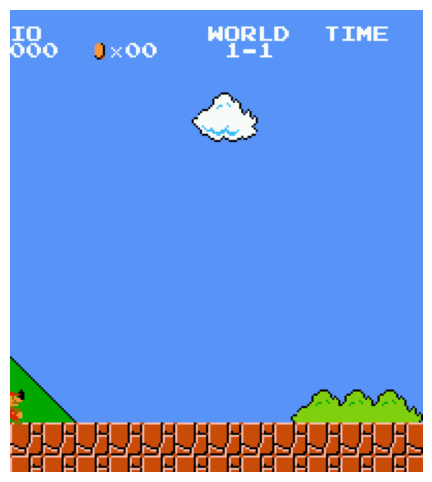

Creating background for scene w1l1s1
Processing sub-01/ses-001/gamelogs/sub-01_ses-001_task-mario_level-w1l1_rep-000.bk2


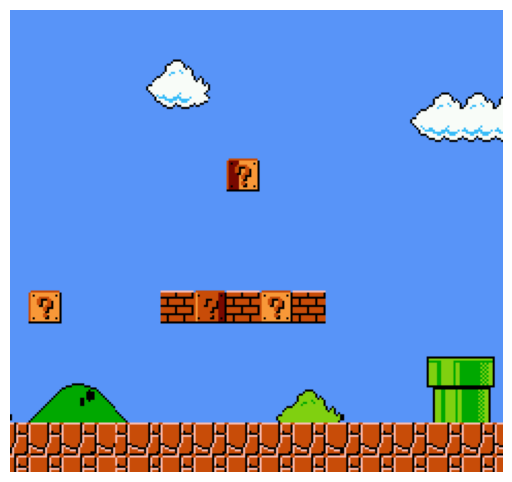

Creating background for scene w1l1s2
Processing sub-01/ses-001/gamelogs/sub-01_ses-001_task-mario_level-w1l1_rep-000.bk2


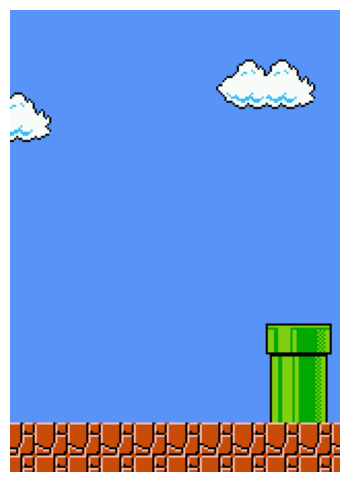

Creating background for scene w1l1s3
Processing sub-01/ses-001/gamelogs/sub-01_ses-001_task-mario_level-w1l1_rep-000.bk2


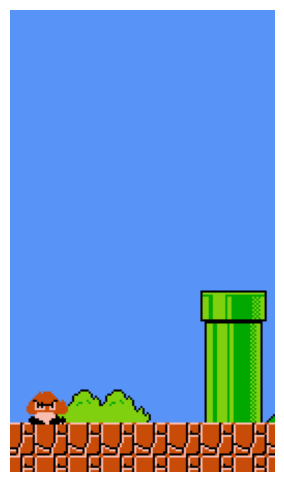

Creating background for scene w1l1s4
Processing sub-01/ses-001/gamelogs/sub-01_ses-001_task-mario_level-w1l1_rep-000.bk2


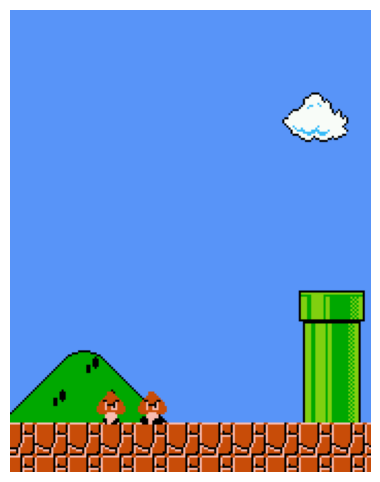

Creating background for scene w1l1s5
Processing sub-01/ses-001/gamelogs/sub-01_ses-001_task-mario_level-w1l1_rep-000.bk2


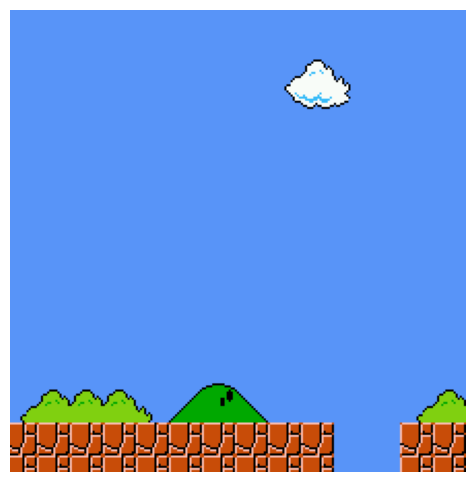

Creating background for scene w1l1s6
Processing sub-01/ses-001/gamelogs/sub-01_ses-001_task-mario_level-w1l1_rep-000.bk2


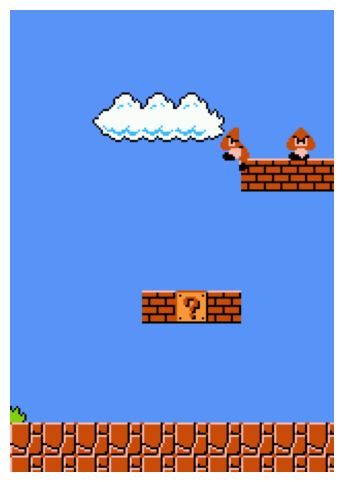

Creating background for scene w1l1s7
Processing sub-01/ses-001/gamelogs/sub-01_ses-001_task-mario_level-w1l1_rep-000.bk2


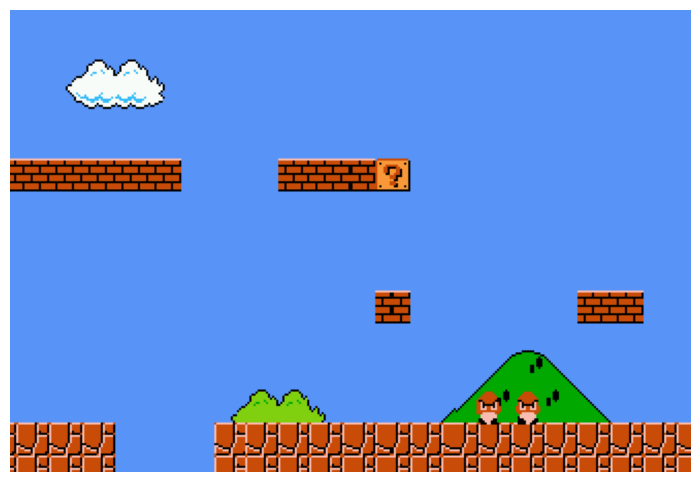

Creating background for scene w1l1s8
Processing sub-01/ses-001/gamelogs/sub-01_ses-001_task-mario_level-w1l1_rep-000.bk2


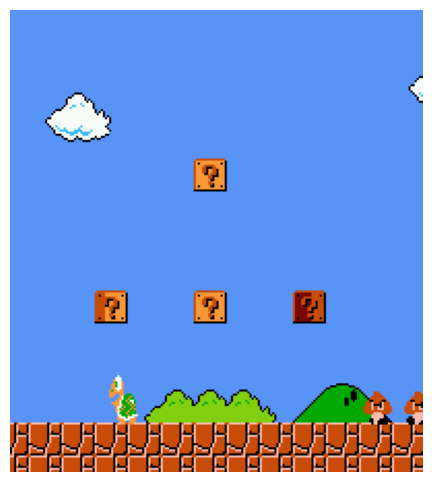

Creating background for scene w1l1s9
Processing sub-01/ses-001/gamelogs/sub-01_ses-001_task-mario_level-w1l1_rep-000.bk2


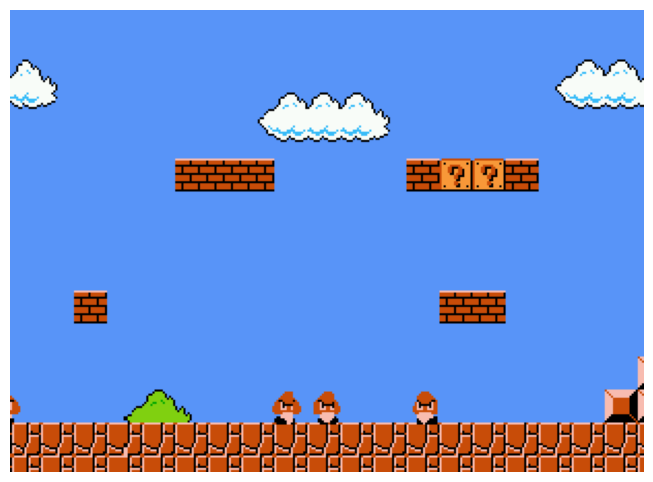

Creating background for scene w1l1s10
Processing sub-01/ses-001/gamelogs/sub-01_ses-001_task-mario_level-w1l1_rep-000.bk2


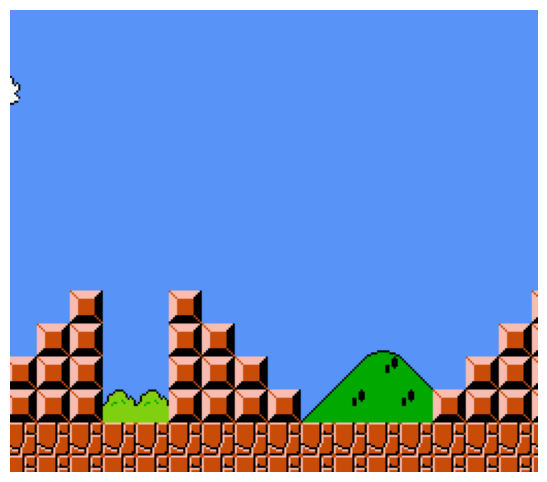

Creating background for scene w1l1s11
Processing sub-01/ses-001/gamelogs/sub-01_ses-001_task-mario_level-w1l1_rep-000.bk2


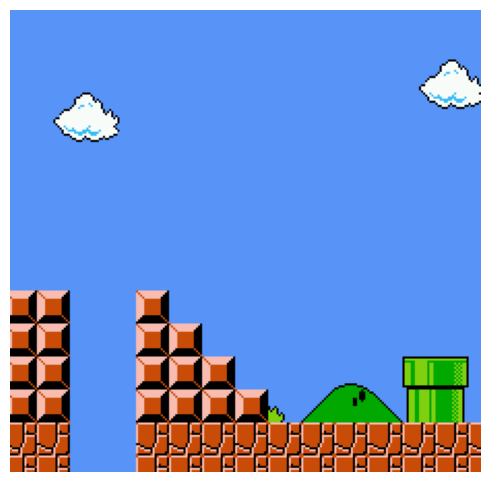

Creating background for scene w1l1s12
Processing sub-01/ses-001/gamelogs/sub-01_ses-001_task-mario_level-w1l1_rep-000.bk2
Processing sub-01/ses-001/gamelogs/sub-01_ses-001_task-mario_level-w1l1_rep-001.bk2
Processing sub-01/ses-001/gamelogs/sub-01_ses-001_task-mario_level-w1l1_rep-002.bk2
Processing sub-01/ses-001/gamelogs/sub-01_ses-001_task-mario_level-w1l1_rep-003.bk2
Processing sub-01/ses-001/gamelogs/sub-01_ses-001_task-mario_level-w1l1_rep-004.bk2
Processing sub-01/ses-001/gamelogs/sub-01_ses-001_task-mario_level-w1l1_rep-005.bk2
Processing sub-01/ses-001/gamelogs/sub-01_ses-001_task-mario_level-w1l1_rep-006.bk2
Processing sub-01/ses-001/gamelogs/sub-01_ses-001_task-mario_level-w1l1_rep-007.bk2
Processing sub-01/ses-001/gamelogs/sub-01_ses-001_task-mario_level-w1l1_rep-008.bk2
Processing sub-01/ses-001/gamelogs/sub-01_ses-001_task-mario_level-w1l1_rep-009.bk2
Processing sub-01/ses-001/gamelogs/sub-01_ses-001_task-mario_level-w1l1_rep-010.bk2
Processing sub-01/ses-007/gamelogs/sub

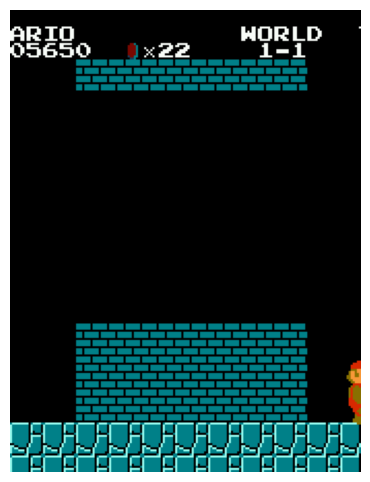

Creating background for scene w1l1s13
Processing sub-01/ses-001/gamelogs/sub-01_ses-001_task-mario_level-w1l1_rep-000.bk2


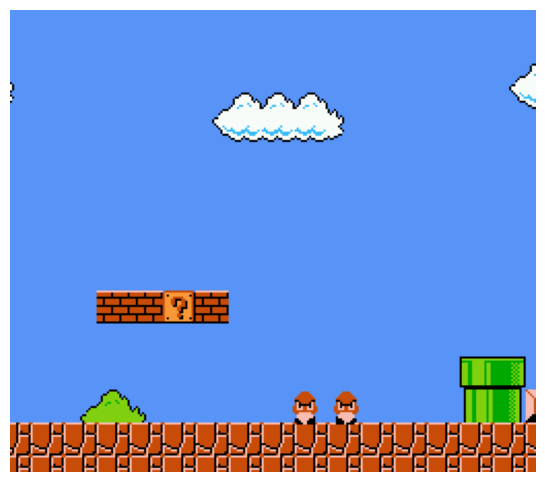

Creating background for scene w1l1s14
Processing sub-01/ses-001/gamelogs/sub-01_ses-001_task-mario_level-w1l1_rep-000.bk2


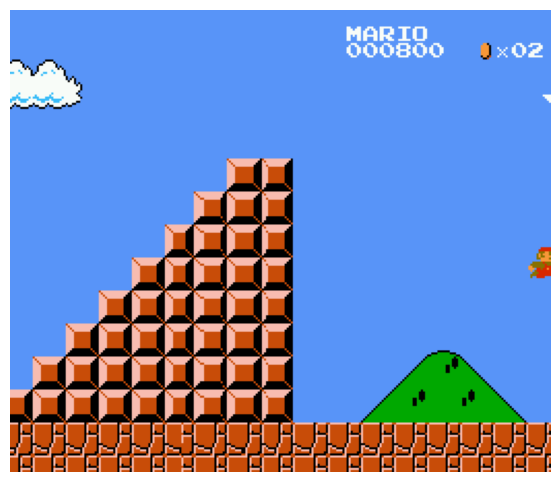

Creating background for scene w1l2s0
Processing sub-01/ses-001/gamelogs/sub-01_ses-001_task-mario_level-w1l2_rep-000.bk2


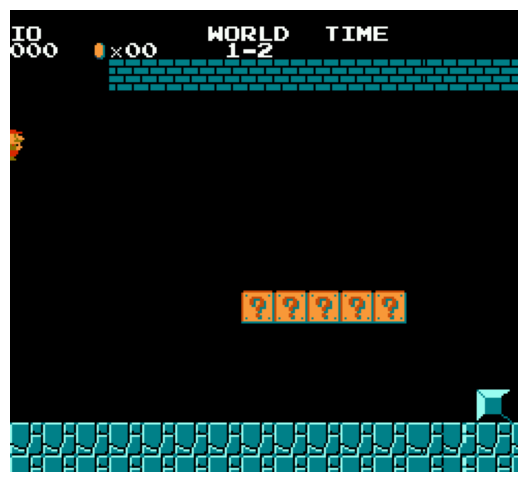

Creating background for scene w1l2s1
Processing sub-01/ses-001/gamelogs/sub-01_ses-001_task-mario_level-w1l2_rep-000.bk2


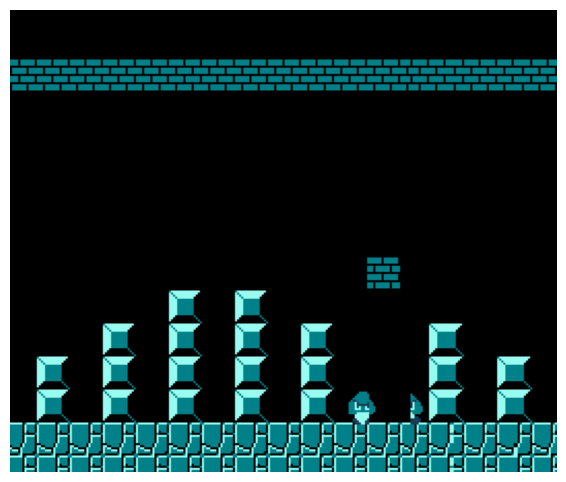

Creating background for scene w1l2s2
Processing sub-01/ses-001/gamelogs/sub-01_ses-001_task-mario_level-w1l2_rep-000.bk2


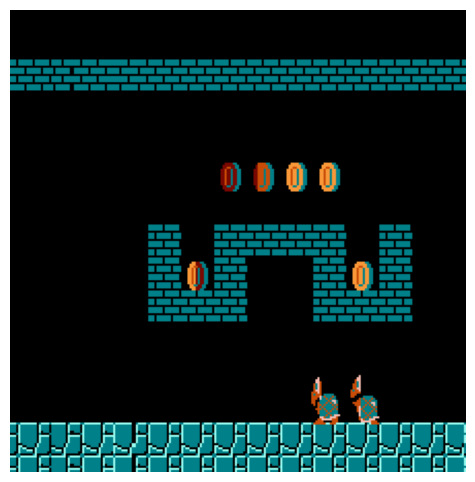

Creating background for scene w1l2s3
Processing sub-01/ses-001/gamelogs/sub-01_ses-001_task-mario_level-w1l2_rep-000.bk2


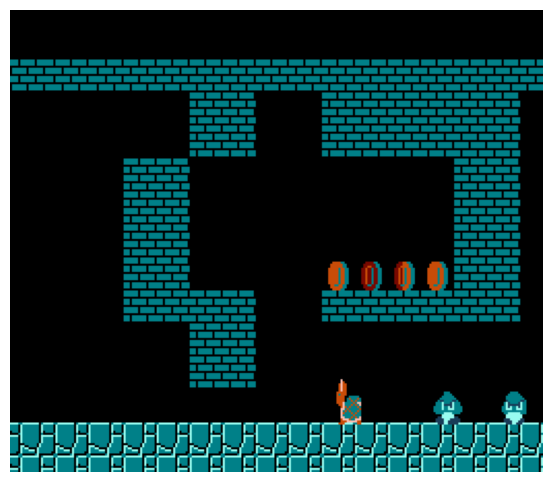

Creating background for scene w1l2s4
Processing sub-01/ses-001/gamelogs/sub-01_ses-001_task-mario_level-w1l2_rep-000.bk2


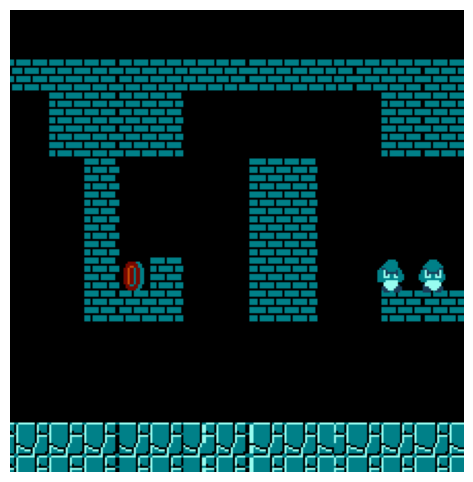

Creating background for scene w1l2s5
Processing sub-01/ses-001/gamelogs/sub-01_ses-001_task-mario_level-w1l2_rep-000.bk2


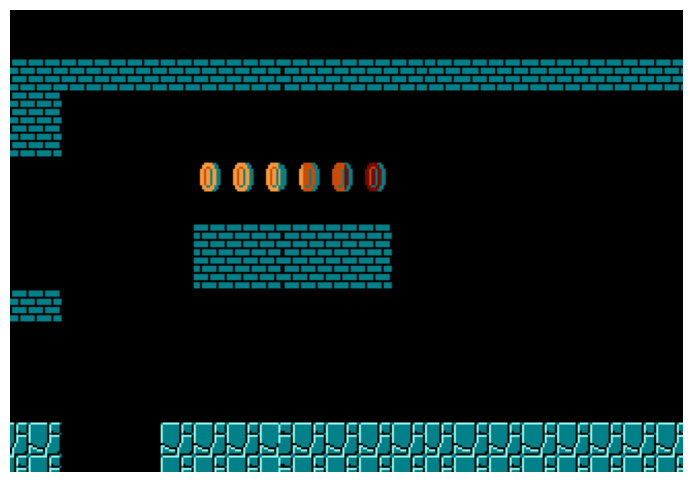

Creating background for scene w1l2s6
Processing sub-01/ses-001/gamelogs/sub-01_ses-001_task-mario_level-w1l2_rep-000.bk2


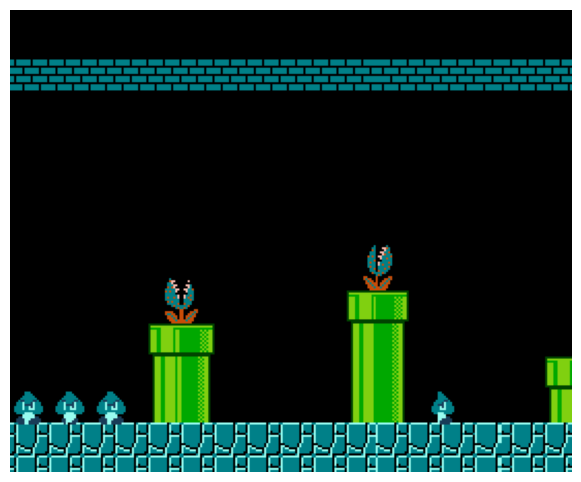

Creating background for scene w1l2s7
Processing sub-01/ses-001/gamelogs/sub-01_ses-001_task-mario_level-w1l2_rep-000.bk2
Processing sub-01/ses-001/gamelogs/sub-01_ses-001_task-mario_level-w1l2_rep-001.bk2
Processing sub-01/ses-001/gamelogs/sub-01_ses-001_task-mario_level-w1l2_rep-002.bk2
Processing sub-01/ses-001/gamelogs/sub-01_ses-001_task-mario_level-w1l2_rep-003.bk2
Processing sub-01/ses-001/gamelogs/sub-01_ses-001_task-mario_level-w1l2_rep-004.bk2
Processing sub-01/ses-001/gamelogs/sub-01_ses-001_task-mario_level-w1l2_rep-005.bk2
Processing sub-01/ses-001/gamelogs/sub-01_ses-001_task-mario_level-w1l2_rep-006.bk2
Processing sub-01/ses-001/gamelogs/sub-01_ses-001_task-mario_level-w1l2_rep-007.bk2
Processing sub-01/ses-001/gamelogs/sub-01_ses-001_task-mario_level-w1l2_rep-008.bk2
Processing sub-01/ses-001/gamelogs/sub-01_ses-001_task-mario_level-w1l2_rep-009.bk2
Processing sub-01/ses-007/gamelogs/sub-01_ses-007_task-mario_level-w1l2_rep-001.bk2
Processing sub-01/ses-007/gamelogs/sub-

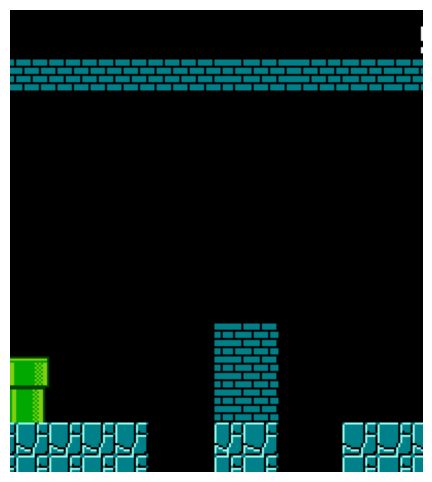

Creating background for scene w1l2s9
Processing sub-01/ses-001/gamelogs/sub-01_ses-001_task-mario_level-w1l2_rep-000.bk2


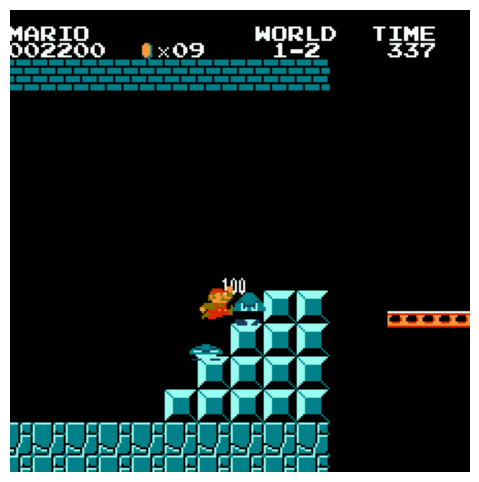

Creating background for scene w1l2s10
Processing sub-01/ses-001/gamelogs/sub-01_ses-001_task-mario_level-w1l2_rep-000.bk2
Creating background for scene w1l2s11
Processing sub-01/ses-001/gamelogs/sub-01_ses-001_task-mario_level-w1l2_rep-000.bk2
Creating background for scene w1l2s12
Processing sub-01/ses-001/gamelogs/sub-01_ses-001_task-mario_level-w1l2_rep-000.bk2
Processing sub-01/ses-001/gamelogs/sub-01_ses-001_task-mario_level-w1l2_rep-001.bk2
Processing sub-01/ses-001/gamelogs/sub-01_ses-001_task-mario_level-w1l2_rep-002.bk2
Processing sub-01/ses-001/gamelogs/sub-01_ses-001_task-mario_level-w1l2_rep-003.bk2
Processing sub-01/ses-001/gamelogs/sub-01_ses-001_task-mario_level-w1l2_rep-004.bk2
Processing sub-01/ses-001/gamelogs/sub-01_ses-001_task-mario_level-w1l2_rep-005.bk2
Processing sub-01/ses-001/gamelogs/sub-01_ses-001_task-mario_level-w1l2_rep-006.bk2
Processing sub-01/ses-001/gamelogs/sub-01_ses-001_task-mario_level-w1l2_rep-007.bk2
Processing sub-01/ses-001/gamelogs/sub-01_ses-

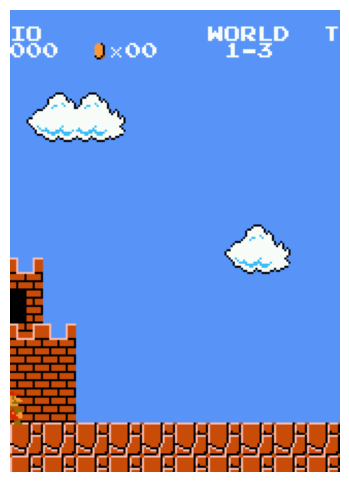

Creating background for scene w1l3s1
Processing sub-01/ses-001/gamelogs/sub-01_ses-001_task-mario_level-w1l3_rep-000.bk2


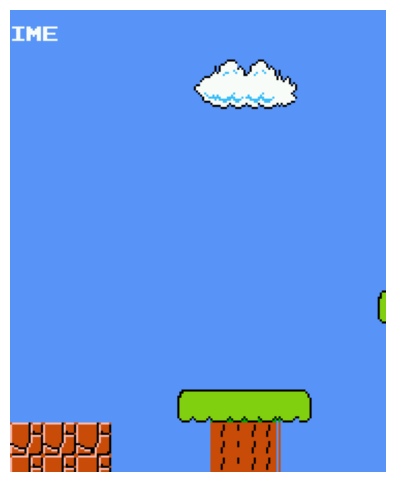

Creating background for scene w1l3s2
Processing sub-01/ses-001/gamelogs/sub-01_ses-001_task-mario_level-w1l3_rep-000.bk2


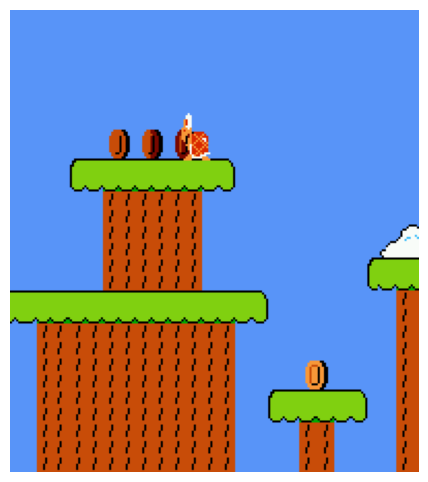

Creating background for scene w1l3s3
Processing sub-01/ses-001/gamelogs/sub-01_ses-001_task-mario_level-w1l3_rep-000.bk2


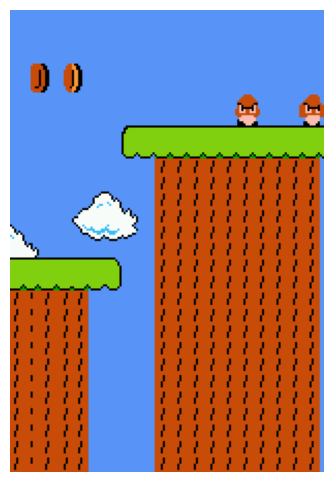

Creating background for scene w1l3s4
Processing sub-01/ses-001/gamelogs/sub-01_ses-001_task-mario_level-w1l3_rep-000.bk2


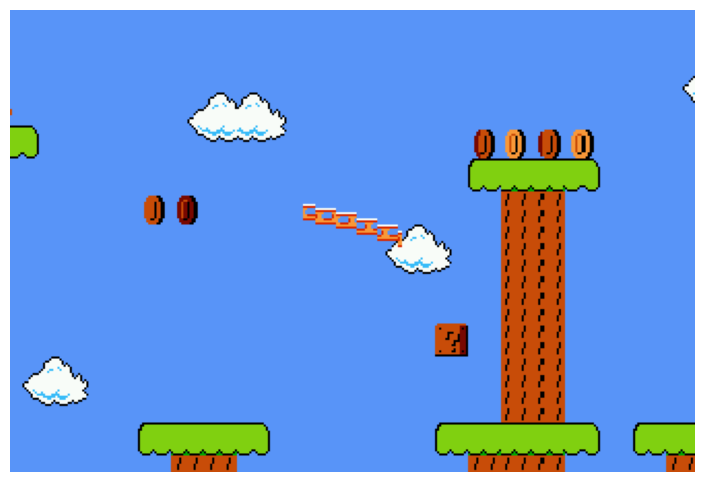

Creating background for scene w1l3s5
Processing sub-01/ses-001/gamelogs/sub-01_ses-001_task-mario_level-w1l3_rep-000.bk2


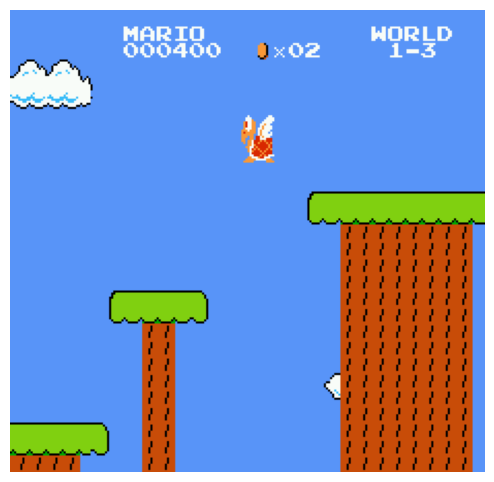

Creating background for scene w1l3s6
Processing sub-01/ses-001/gamelogs/sub-01_ses-001_task-mario_level-w1l3_rep-000.bk2


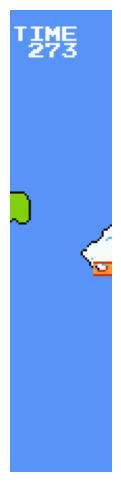

Creating background for scene w1l3s7
Processing sub-01/ses-001/gamelogs/sub-01_ses-001_task-mario_level-w1l3_rep-000.bk2
Creating background for scene w1l3s8
Processing sub-01/ses-001/gamelogs/sub-01_ses-001_task-mario_level-w1l3_rep-000.bk2
Creating background for scene w1l3s9
Processing sub-01/ses-001/gamelogs/sub-01_ses-001_task-mario_level-w1l3_rep-000.bk2
Creating background for scene w1l3s10
Processing sub-01/ses-001/gamelogs/sub-01_ses-001_task-mario_level-w1l3_rep-000.bk2
Creating background for scene w2l1s0
Processing sub-01/ses-001/gamelogs/sub-01_ses-001_task-mario_level-w2l1_rep-000.bk2


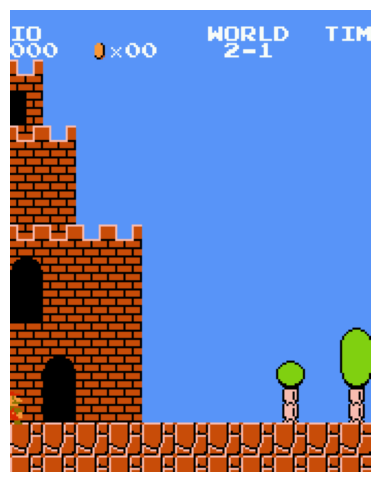

Creating background for scene w2l1s1
Processing sub-01/ses-001/gamelogs/sub-01_ses-001_task-mario_level-w2l1_rep-000.bk2


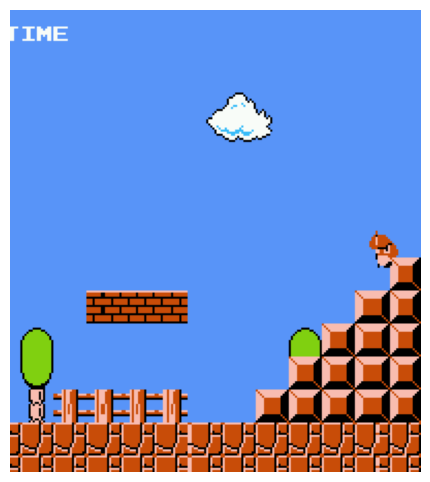

Creating background for scene w2l1s2
Processing sub-01/ses-001/gamelogs/sub-01_ses-001_task-mario_level-w2l1_rep-000.bk2


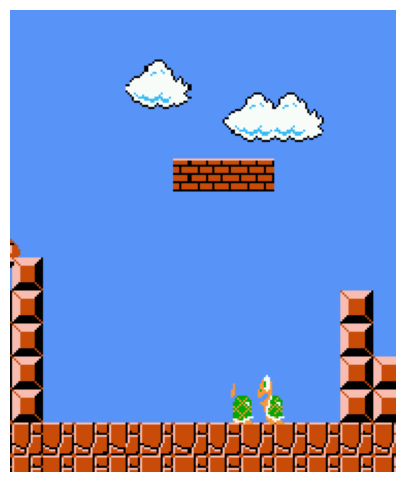

Creating background for scene w2l1s3
Processing sub-01/ses-001/gamelogs/sub-01_ses-001_task-mario_level-w2l1_rep-000.bk2


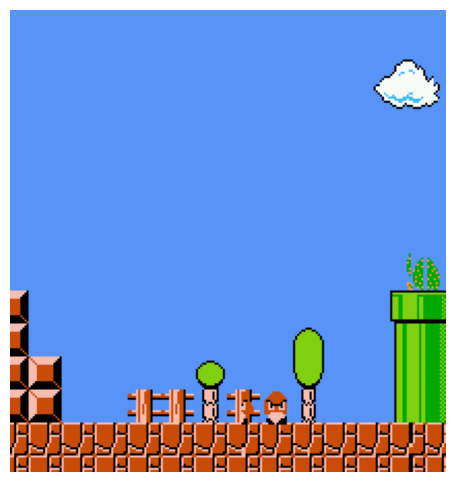

Creating background for scene w2l1s4
Processing sub-01/ses-001/gamelogs/sub-01_ses-001_task-mario_level-w2l1_rep-000.bk2


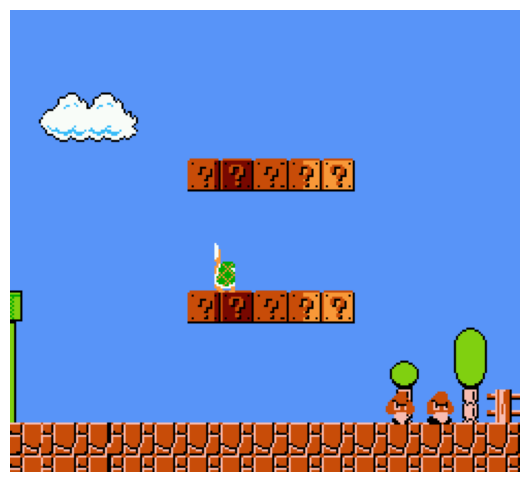

Creating background for scene w2l1s5
Processing sub-01/ses-001/gamelogs/sub-01_ses-001_task-mario_level-w2l1_rep-000.bk2


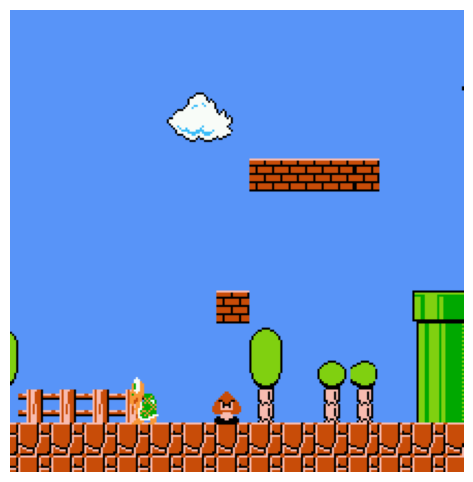

Creating background for scene w2l1s6
Processing sub-01/ses-001/gamelogs/sub-01_ses-001_task-mario_level-w2l1_rep-000.bk2


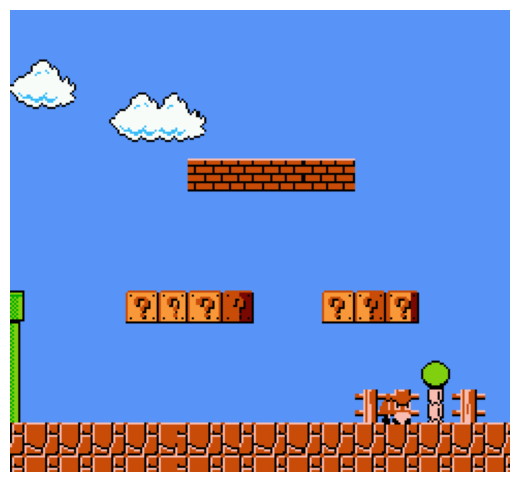

Creating background for scene w2l1s7
Processing sub-01/ses-001/gamelogs/sub-01_ses-001_task-mario_level-w2l1_rep-000.bk2
Processing sub-01/ses-001/gamelogs/sub-01_ses-001_task-mario_level-w2l1_rep-001.bk2
Processing sub-01/ses-001/gamelogs/sub-01_ses-001_task-mario_level-w2l1_rep-002.bk2
Processing sub-01/ses-001/gamelogs/sub-01_ses-001_task-mario_level-w2l1_rep-003.bk2
Processing sub-01/ses-001/gamelogs/sub-01_ses-001_task-mario_level-w2l1_rep-004.bk2
Processing sub-01/ses-001/gamelogs/sub-01_ses-001_task-mario_level-w2l1_rep-005.bk2
Processing sub-01/ses-001/gamelogs/sub-01_ses-001_task-mario_level-w2l1_rep-006.bk2
Processing sub-01/ses-001/gamelogs/sub-01_ses-001_task-mario_level-w2l1_rep-007.bk2
Processing sub-01/ses-001/gamelogs/sub-01_ses-001_task-mario_level-w2l1_rep-008.bk2
Processing sub-01/ses-006/gamelogs/sub-01_ses-006_task-mario_level-w2l1_rep-000.bk2
Processing sub-01/ses-007/gamelogs/sub-01_ses-007_task-mario_level-w2l1_rep-001.bk2
Processing sub-01/ses-007/gamelogs/sub-

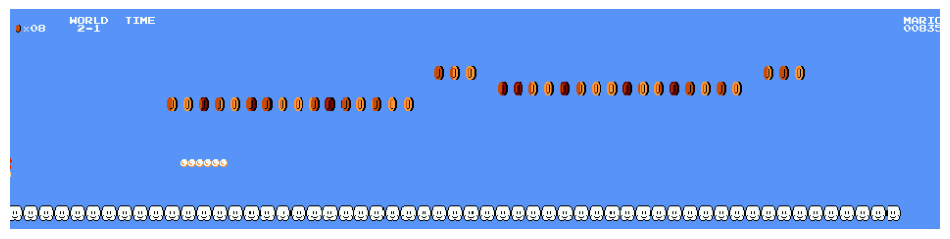

Creating background for scene w2l1s8
Processing sub-01/ses-001/gamelogs/sub-01_ses-001_task-mario_level-w2l1_rep-000.bk2


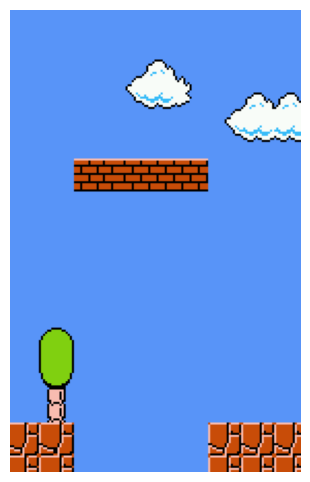

Creating background for scene w2l1s9
Processing sub-01/ses-001/gamelogs/sub-01_ses-001_task-mario_level-w2l1_rep-000.bk2
Processing sub-01/ses-001/gamelogs/sub-01_ses-001_task-mario_level-w2l1_rep-001.bk2
Processing sub-01/ses-001/gamelogs/sub-01_ses-001_task-mario_level-w2l1_rep-002.bk2
Processing sub-01/ses-001/gamelogs/sub-01_ses-001_task-mario_level-w2l1_rep-003.bk2
Processing sub-01/ses-001/gamelogs/sub-01_ses-001_task-mario_level-w2l1_rep-004.bk2
Processing sub-01/ses-001/gamelogs/sub-01_ses-001_task-mario_level-w2l1_rep-005.bk2
Processing sub-01/ses-001/gamelogs/sub-01_ses-001_task-mario_level-w2l1_rep-006.bk2
Processing sub-01/ses-001/gamelogs/sub-01_ses-001_task-mario_level-w2l1_rep-007.bk2
Processing sub-01/ses-001/gamelogs/sub-01_ses-001_task-mario_level-w2l1_rep-008.bk2
Processing sub-01/ses-006/gamelogs/sub-01_ses-006_task-mario_level-w2l1_rep-000.bk2
Processing sub-01/ses-007/gamelogs/sub-01_ses-007_task-mario_level-w2l1_rep-001.bk2
Processing sub-01/ses-007/gamelogs/sub-

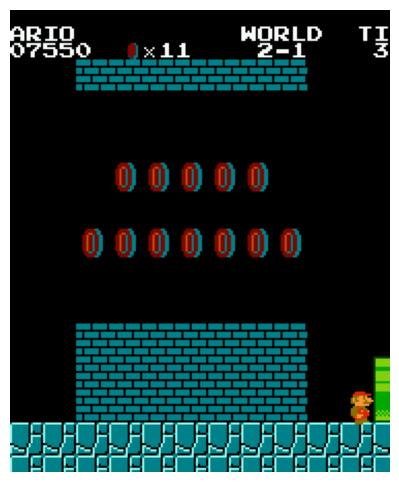

Creating background for scene w2l1s10
Processing sub-01/ses-001/gamelogs/sub-01_ses-001_task-mario_level-w2l1_rep-000.bk2


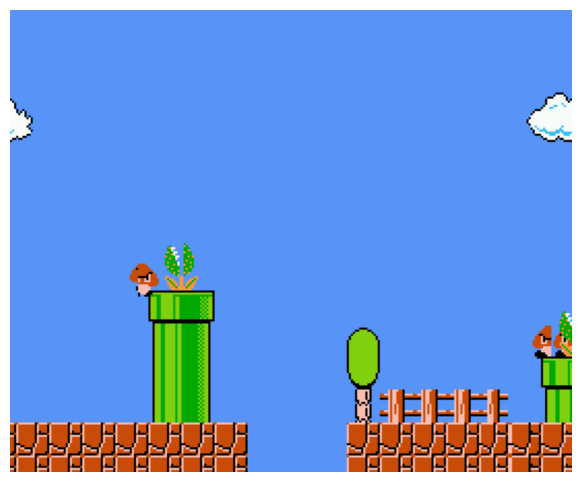

Creating background for scene w2l1s11
Processing sub-01/ses-001/gamelogs/sub-01_ses-001_task-mario_level-w2l1_rep-000.bk2


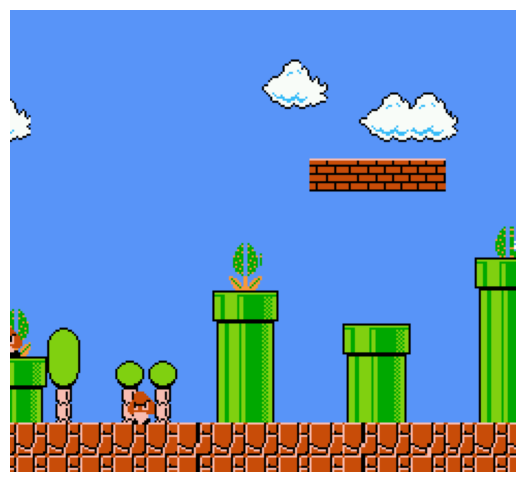

Creating background for scene w2l1s12
Processing sub-01/ses-001/gamelogs/sub-01_ses-001_task-mario_level-w2l1_rep-000.bk2


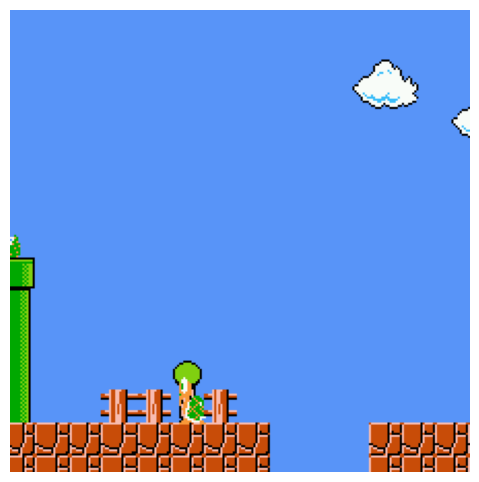

Creating background for scene w2l1s13
Processing sub-01/ses-001/gamelogs/sub-01_ses-001_task-mario_level-w2l1_rep-000.bk2


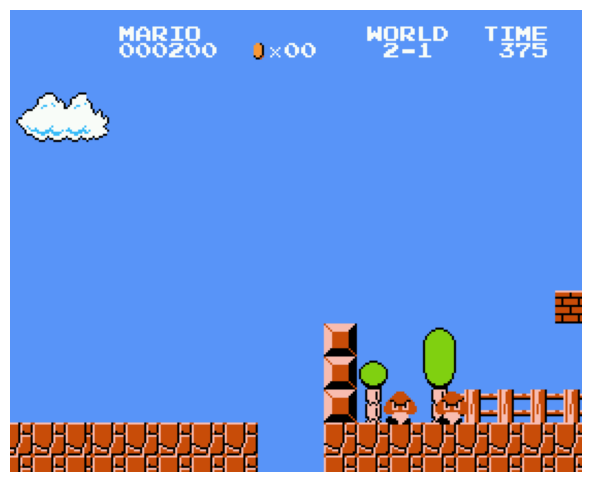

Creating background for scene w2l1s14
Processing sub-01/ses-001/gamelogs/sub-01_ses-001_task-mario_level-w2l1_rep-000.bk2
Creating background for scene w2l1s15
Processing sub-01/ses-001/gamelogs/sub-01_ses-001_task-mario_level-w2l1_rep-000.bk2
Creating background for scene w2l1s16
Processing sub-01/ses-001/gamelogs/sub-01_ses-001_task-mario_level-w2l1_rep-000.bk2
Creating background for scene w2l3s0
Processing sub-01/ses-002/gamelogs/sub-01_ses-002_task-mario_level-w2l3_rep-000.bk2


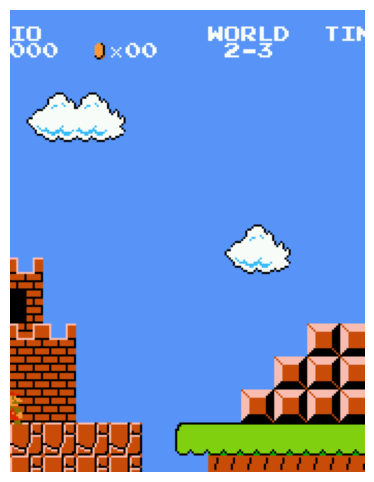

Creating background for scene w2l3s1
Processing sub-01/ses-002/gamelogs/sub-01_ses-002_task-mario_level-w2l3_rep-000.bk2


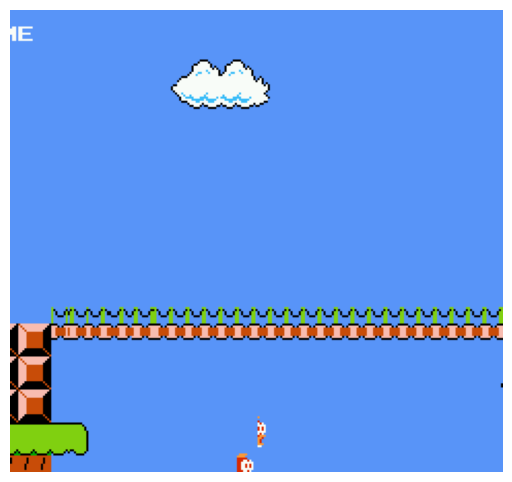

Creating background for scene w2l3s2
Processing sub-01/ses-002/gamelogs/sub-01_ses-002_task-mario_level-w2l3_rep-000.bk2


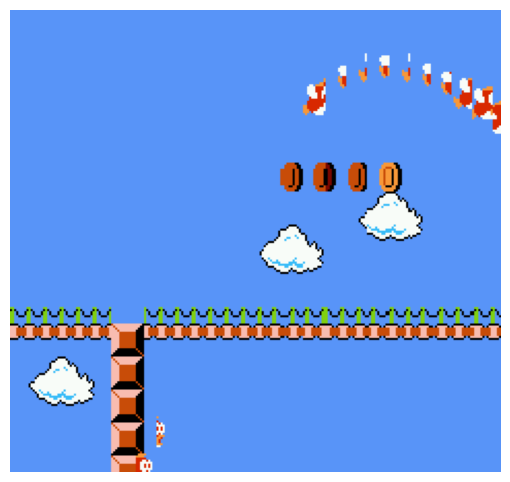

Creating background for scene w2l3s3
Processing sub-01/ses-002/gamelogs/sub-01_ses-002_task-mario_level-w2l3_rep-000.bk2


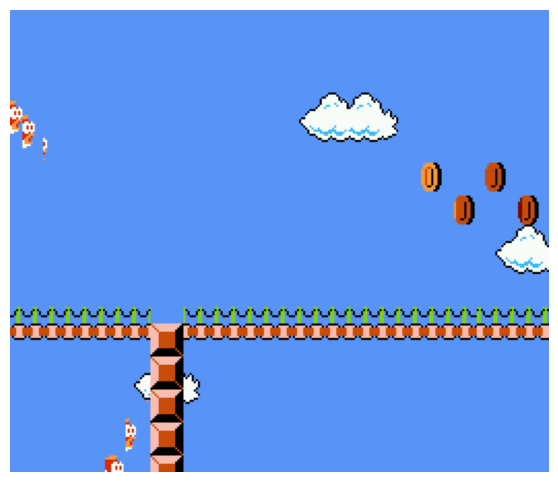

Creating background for scene w2l3s4
Processing sub-01/ses-002/gamelogs/sub-01_ses-002_task-mario_level-w2l3_rep-000.bk2


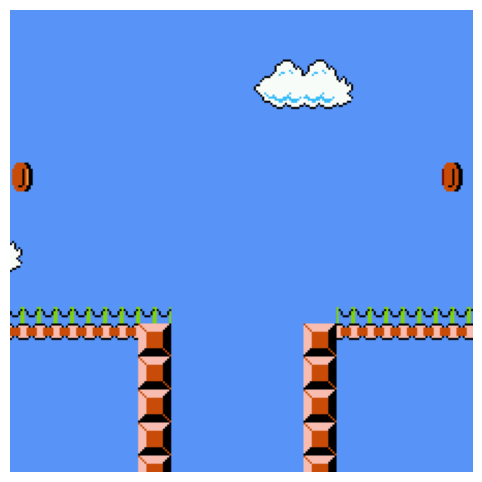

Creating background for scene w2l3s5
Processing sub-01/ses-002/gamelogs/sub-01_ses-002_task-mario_level-w2l3_rep-000.bk2


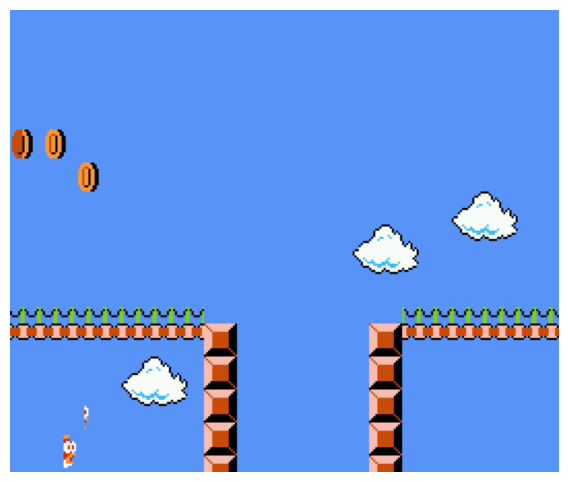

Creating background for scene w2l3s6
Processing sub-01/ses-002/gamelogs/sub-01_ses-002_task-mario_level-w2l3_rep-000.bk2


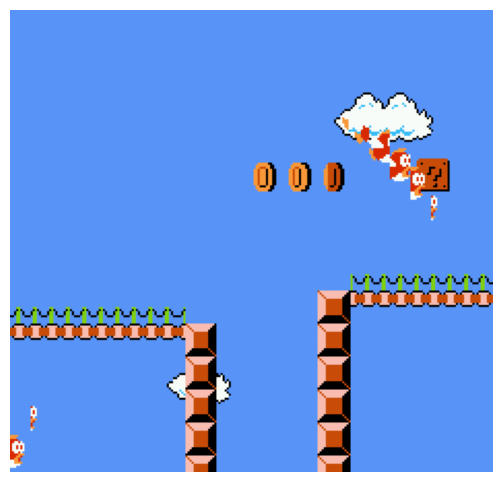

Creating background for scene w2l3s7
Processing sub-01/ses-002/gamelogs/sub-01_ses-002_task-mario_level-w2l3_rep-000.bk2


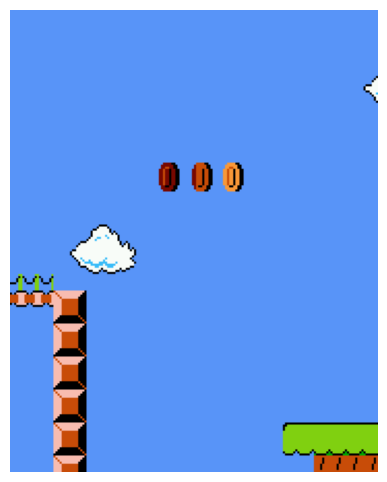

Creating background for scene w2l3s8
Processing sub-01/ses-002/gamelogs/sub-01_ses-002_task-mario_level-w2l3_rep-000.bk2


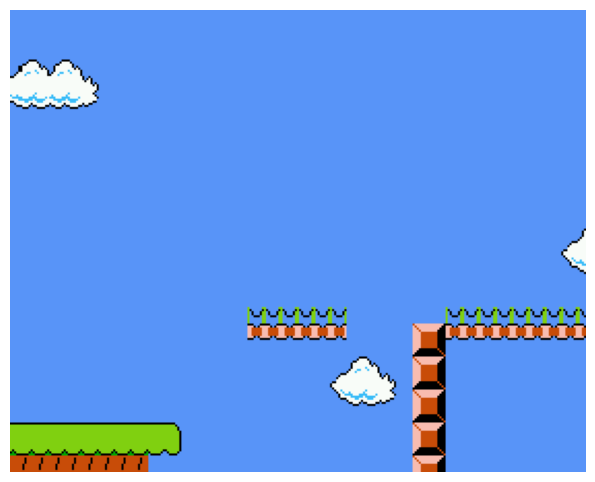

Creating background for scene w2l3s9
Processing sub-01/ses-002/gamelogs/sub-01_ses-002_task-mario_level-w2l3_rep-000.bk2


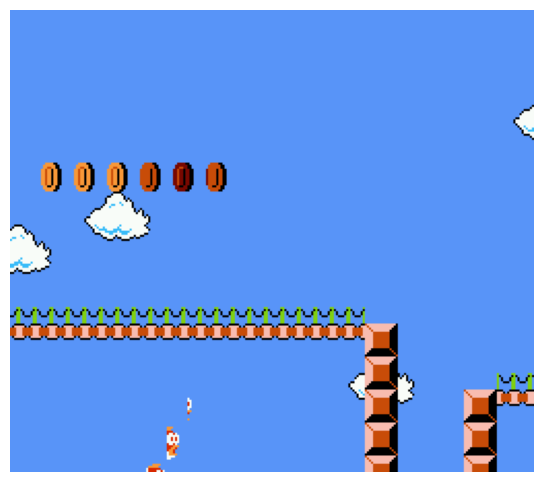

Creating background for scene w2l3s10
Processing sub-01/ses-002/gamelogs/sub-01_ses-002_task-mario_level-w2l3_rep-000.bk2


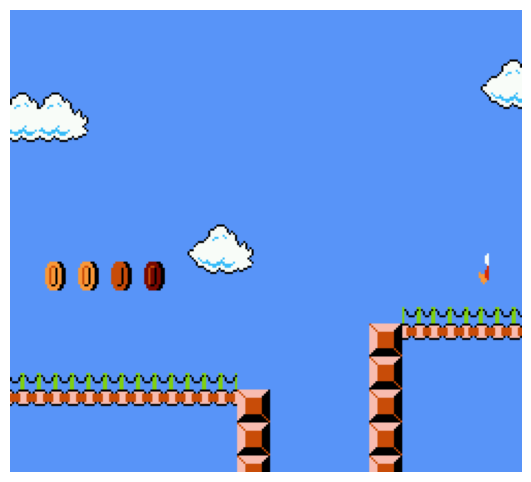

Creating background for scene w2l3s11
Processing sub-01/ses-002/gamelogs/sub-01_ses-002_task-mario_level-w2l3_rep-000.bk2


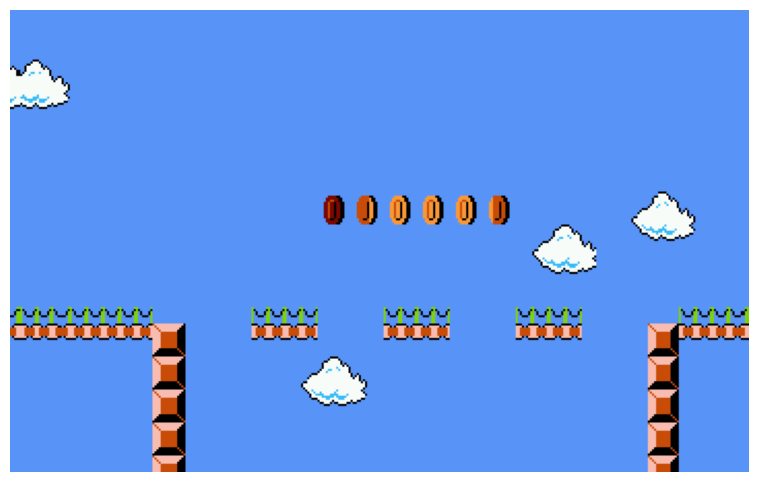

Creating background for scene w2l3s12
Processing sub-01/ses-002/gamelogs/sub-01_ses-002_task-mario_level-w2l3_rep-000.bk2


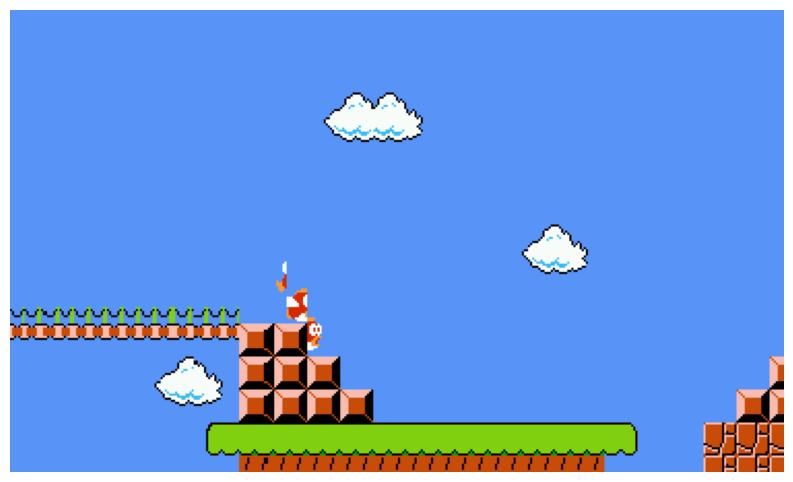

Creating background for scene w2l3s13
Processing sub-01/ses-002/gamelogs/sub-01_ses-002_task-mario_level-w2l3_rep-000.bk2


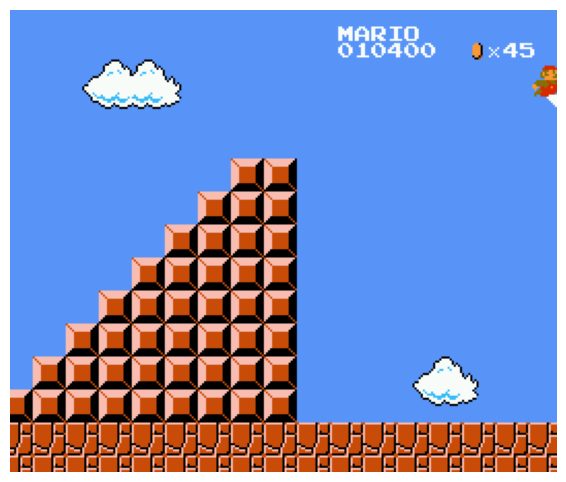

Creating background for scene w3l1s0
Processing sub-01/ses-002/gamelogs/sub-01_ses-002_task-mario_level-w3l1_rep-000.bk2


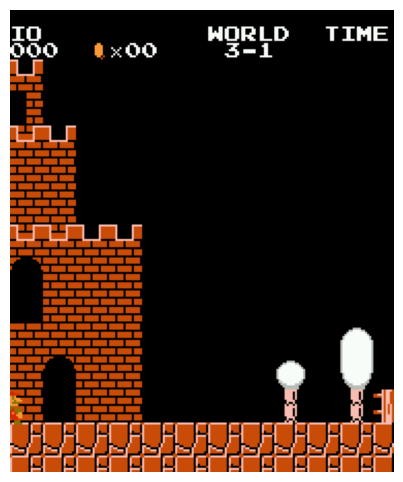

Creating background for scene w3l1s1
Processing sub-01/ses-002/gamelogs/sub-01_ses-002_task-mario_level-w3l1_rep-000.bk2


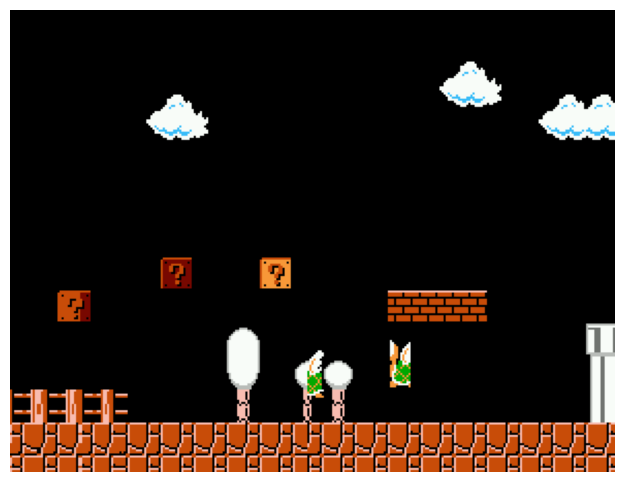

Creating background for scene w3l1s2
Processing sub-01/ses-002/gamelogs/sub-01_ses-002_task-mario_level-w3l1_rep-000.bk2


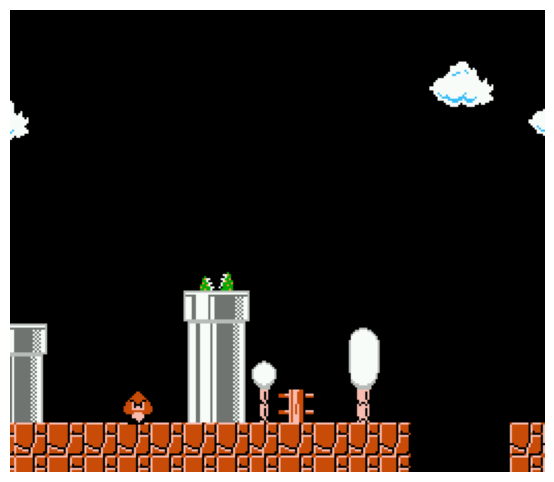

Creating background for scene w3l1s3
Processing sub-01/ses-002/gamelogs/sub-01_ses-002_task-mario_level-w3l1_rep-000.bk2


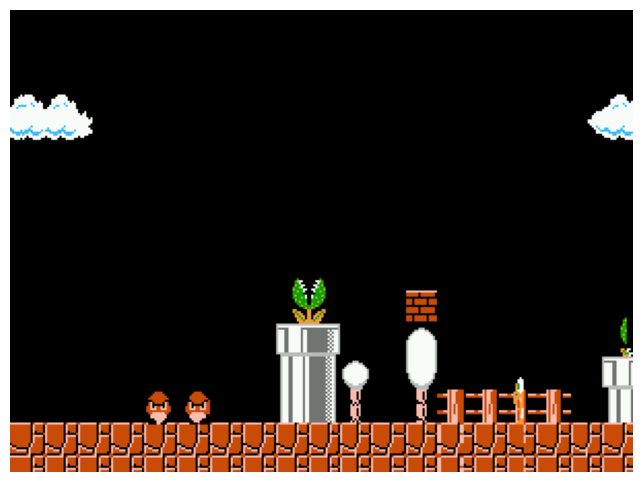

Creating background for scene w3l1s4
Processing sub-01/ses-002/gamelogs/sub-01_ses-002_task-mario_level-w3l1_rep-000.bk2
Processing sub-01/ses-002/gamelogs/sub-01_ses-002_task-mario_level-w3l1_rep-001.bk2
Processing sub-01/ses-002/gamelogs/sub-01_ses-002_task-mario_level-w3l1_rep-002.bk2
Processing sub-01/ses-002/gamelogs/sub-01_ses-002_task-mario_level-w3l1_rep-003.bk2
Processing sub-01/ses-002/gamelogs/sub-01_ses-002_task-mario_level-w3l1_rep-004.bk2
Processing sub-01/ses-002/gamelogs/sub-01_ses-002_task-mario_level-w3l1_rep-005.bk2
Processing sub-01/ses-002/gamelogs/sub-01_ses-002_task-mario_level-w3l1_rep-006.bk2
Processing sub-01/ses-002/gamelogs/sub-01_ses-002_task-mario_level-w3l1_rep-007.bk2
Processing sub-01/ses-007/gamelogs/sub-01_ses-007_task-mario_level-w3l1_rep-002.bk2
Processing sub-01/ses-007/gamelogs/sub-01_ses-007_task-mario_level-w3l1_rep-001.bk2
Processing sub-01/ses-008/gamelogs/sub-01_ses-008_task-mario_level-w3l1_rep-000.bk2
Processing sub-01/ses-008/gamelogs/sub-

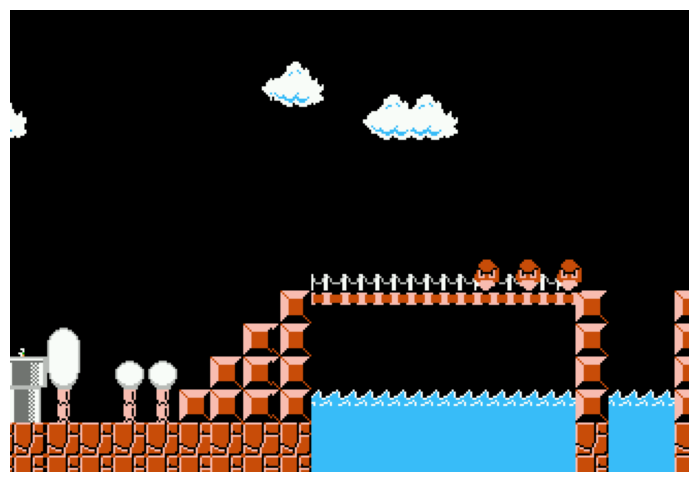

Creating background for scene w3l1s6
Processing sub-01/ses-002/gamelogs/sub-01_ses-002_task-mario_level-w3l1_rep-000.bk2


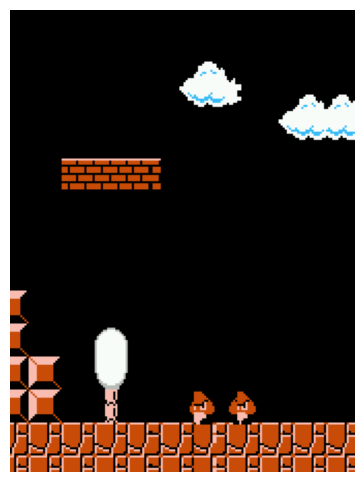

Creating background for scene w3l1s7
Processing sub-01/ses-002/gamelogs/sub-01_ses-002_task-mario_level-w3l1_rep-000.bk2


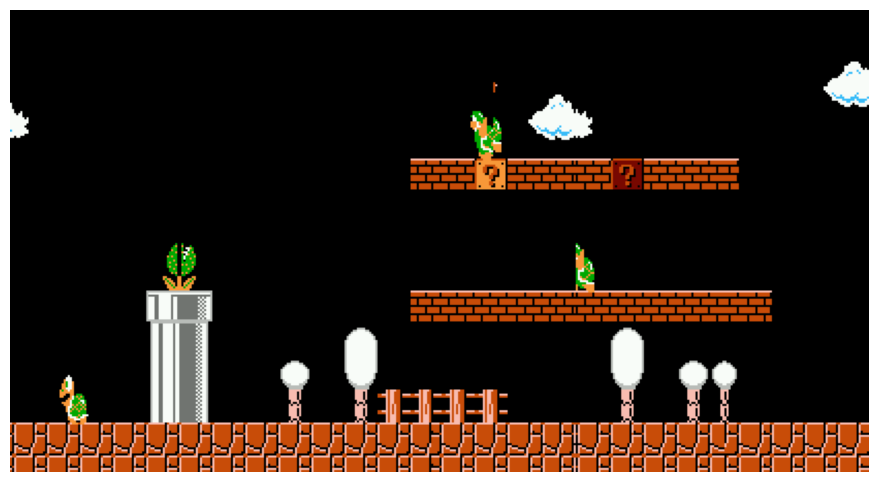

Creating background for scene w3l1s8
Processing sub-01/ses-002/gamelogs/sub-01_ses-002_task-mario_level-w3l1_rep-000.bk2


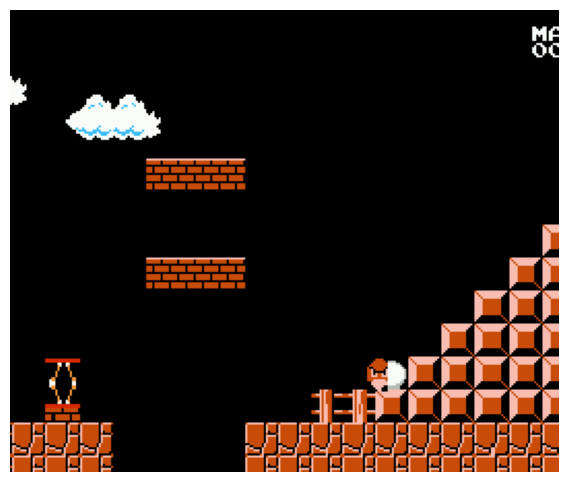

Creating background for scene w3l1s9
Processing sub-01/ses-002/gamelogs/sub-01_ses-002_task-mario_level-w3l1_rep-000.bk2
Processing sub-01/ses-002/gamelogs/sub-01_ses-002_task-mario_level-w3l1_rep-001.bk2
Processing sub-01/ses-002/gamelogs/sub-01_ses-002_task-mario_level-w3l1_rep-002.bk2
Processing sub-01/ses-002/gamelogs/sub-01_ses-002_task-mario_level-w3l1_rep-003.bk2
Processing sub-01/ses-002/gamelogs/sub-01_ses-002_task-mario_level-w3l1_rep-004.bk2
Processing sub-01/ses-002/gamelogs/sub-01_ses-002_task-mario_level-w3l1_rep-005.bk2
Processing sub-01/ses-002/gamelogs/sub-01_ses-002_task-mario_level-w3l1_rep-006.bk2
Processing sub-01/ses-002/gamelogs/sub-01_ses-002_task-mario_level-w3l1_rep-007.bk2
Processing sub-01/ses-007/gamelogs/sub-01_ses-007_task-mario_level-w3l1_rep-002.bk2
Processing sub-01/ses-007/gamelogs/sub-01_ses-007_task-mario_level-w3l1_rep-001.bk2
Processing sub-01/ses-008/gamelogs/sub-01_ses-008_task-mario_level-w3l1_rep-000.bk2
Processing sub-01/ses-008/gamelogs/sub-

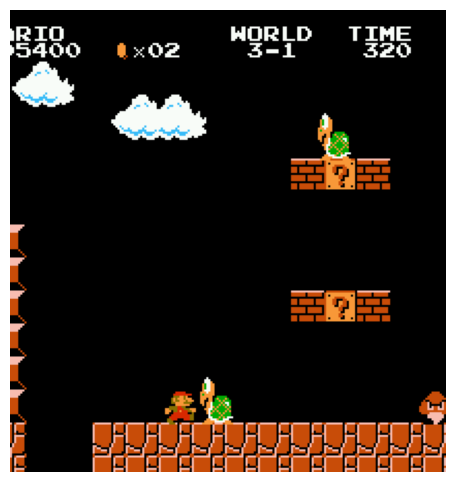

Creating background for scene w3l1s11
Processing sub-01/ses-002/gamelogs/sub-01_ses-002_task-mario_level-w3l1_rep-000.bk2
Creating background for scene w3l1s12
Processing sub-01/ses-002/gamelogs/sub-01_ses-002_task-mario_level-w3l1_rep-000.bk2
Creating background for scene w3l2s0
Processing sub-01/ses-002/gamelogs/sub-01_ses-002_task-mario_level-w3l2_rep-000.bk2


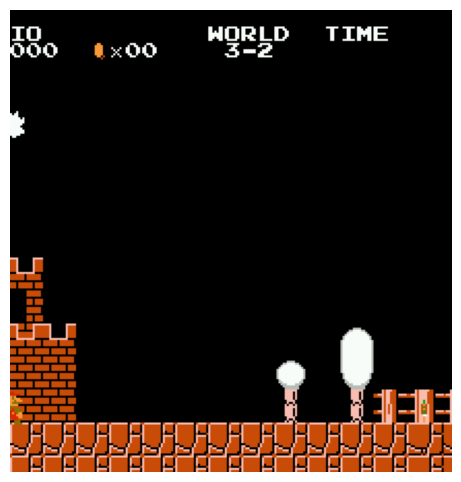

Creating background for scene w3l2s1
Processing sub-01/ses-002/gamelogs/sub-01_ses-002_task-mario_level-w3l2_rep-000.bk2


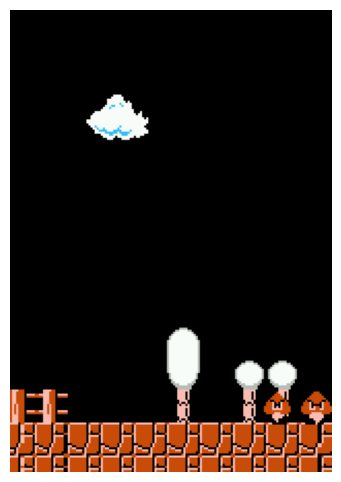

Creating background for scene w3l2s2
Processing sub-01/ses-002/gamelogs/sub-01_ses-002_task-mario_level-w3l2_rep-000.bk2


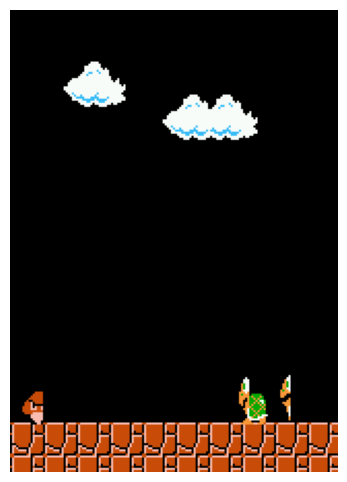

Creating background for scene w3l2s3
Processing sub-01/ses-002/gamelogs/sub-01_ses-002_task-mario_level-w3l2_rep-000.bk2


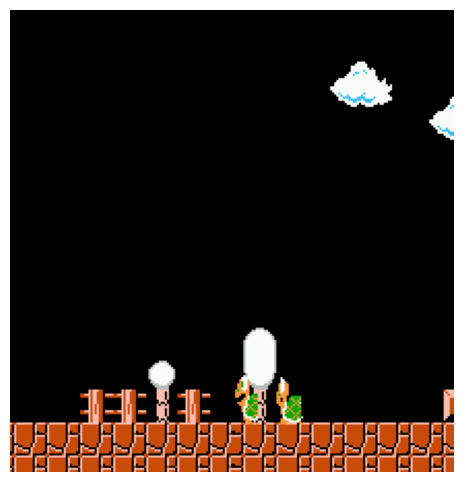

Creating background for scene w3l2s4
Processing sub-01/ses-002/gamelogs/sub-01_ses-002_task-mario_level-w3l2_rep-000.bk2


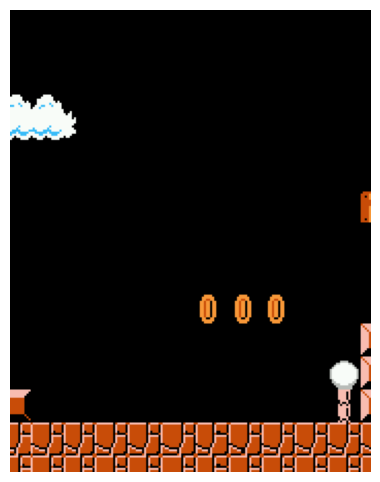

Creating background for scene w3l2s5
Processing sub-01/ses-002/gamelogs/sub-01_ses-002_task-mario_level-w3l2_rep-000.bk2


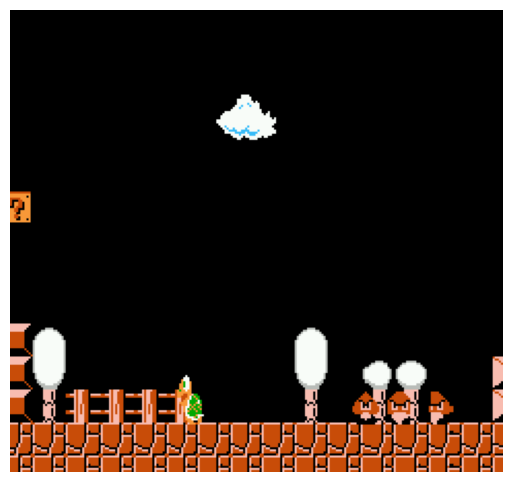

Creating background for scene w3l2s6
Processing sub-01/ses-002/gamelogs/sub-01_ses-002_task-mario_level-w3l2_rep-000.bk2


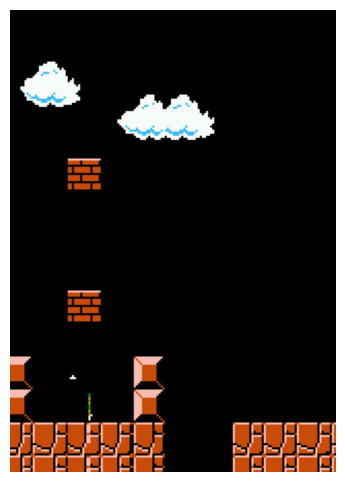

Creating background for scene w3l2s7
Processing sub-01/ses-002/gamelogs/sub-01_ses-002_task-mario_level-w3l2_rep-000.bk2


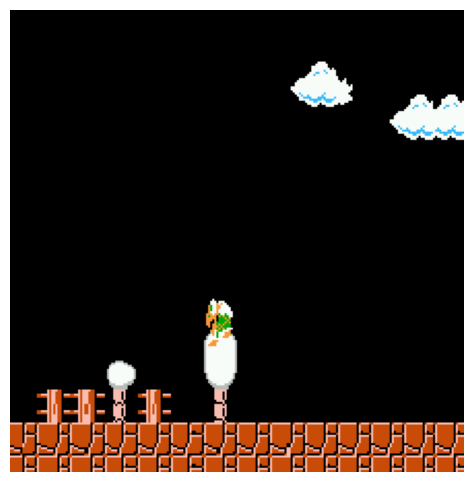

Creating background for scene w3l2s8
Processing sub-01/ses-002/gamelogs/sub-01_ses-002_task-mario_level-w3l2_rep-000.bk2


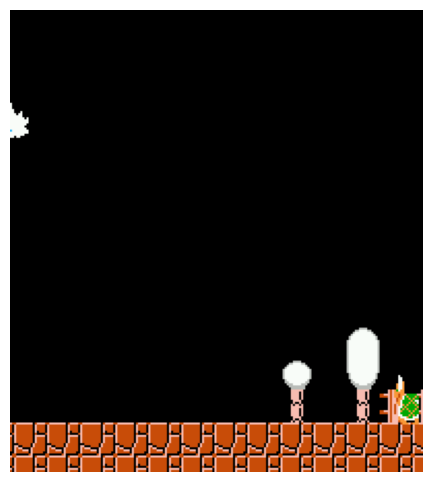

Creating background for scene w3l2s9
Processing sub-01/ses-002/gamelogs/sub-01_ses-002_task-mario_level-w3l2_rep-000.bk2


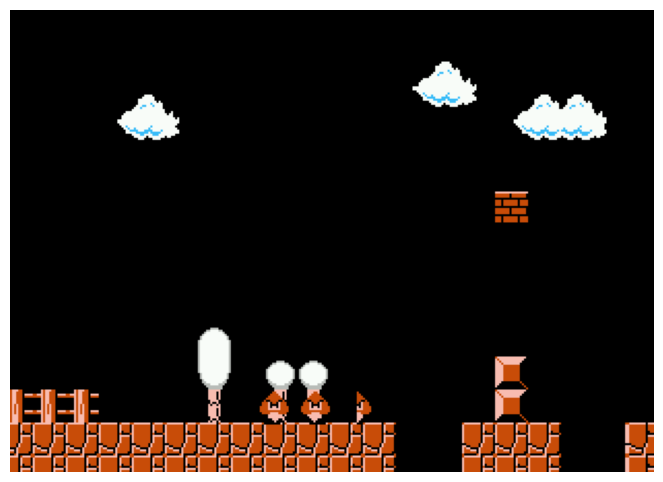

Creating background for scene w3l2s10
Processing sub-01/ses-002/gamelogs/sub-01_ses-002_task-mario_level-w3l2_rep-000.bk2


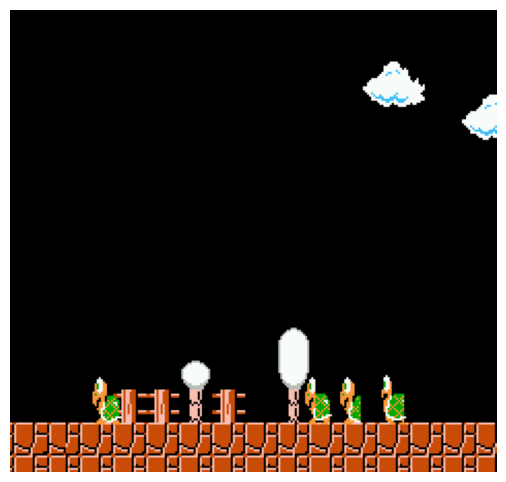

Creating background for scene w3l2s11
Processing sub-01/ses-002/gamelogs/sub-01_ses-002_task-mario_level-w3l2_rep-000.bk2


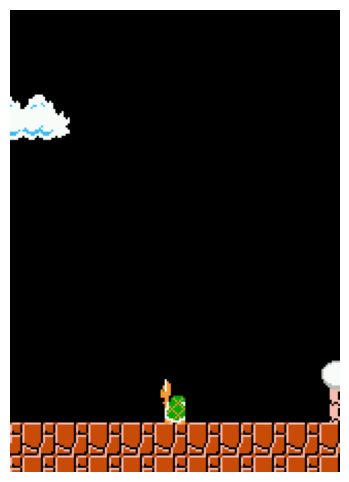

Creating background for scene w3l2s12
Processing sub-01/ses-002/gamelogs/sub-01_ses-002_task-mario_level-w3l2_rep-000.bk2


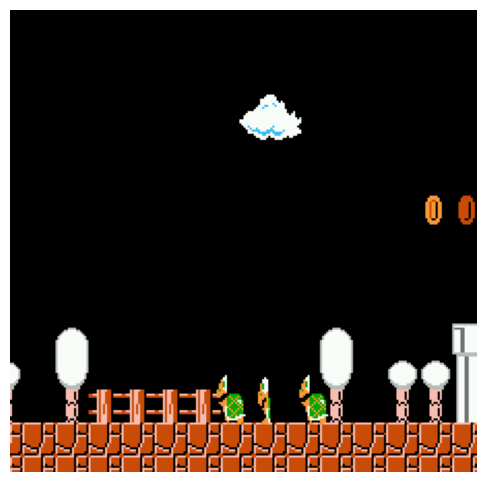

Creating background for scene w3l2s13
Processing sub-01/ses-002/gamelogs/sub-01_ses-002_task-mario_level-w3l2_rep-000.bk2


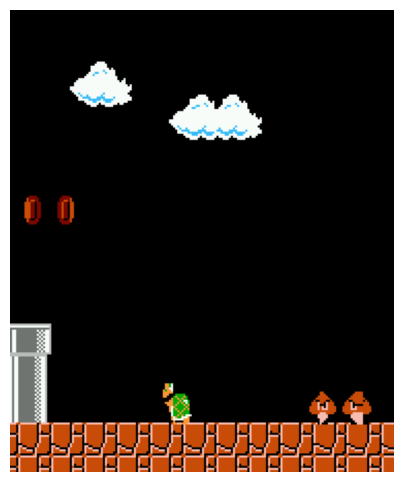

Creating background for scene w3l2s14
Processing sub-01/ses-002/gamelogs/sub-01_ses-002_task-mario_level-w3l2_rep-000.bk2


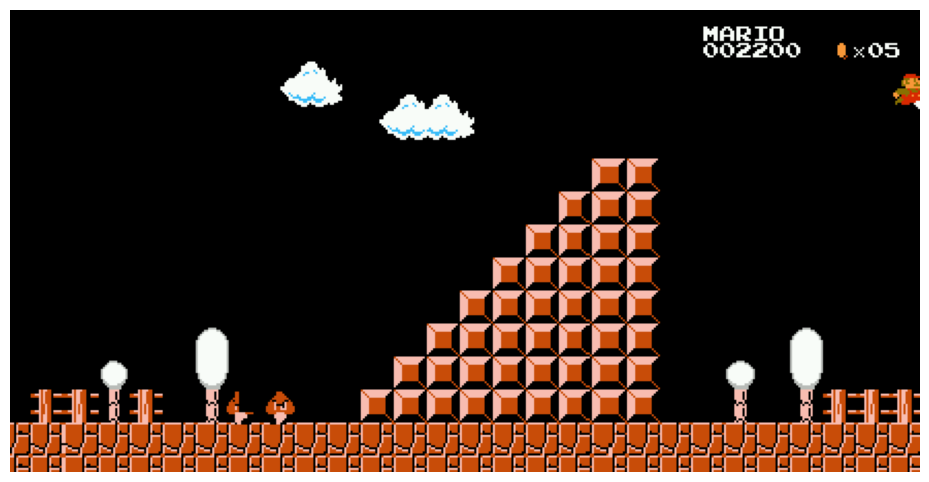

Creating background for scene w3l3s0
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w3l3_rep-000.bk2


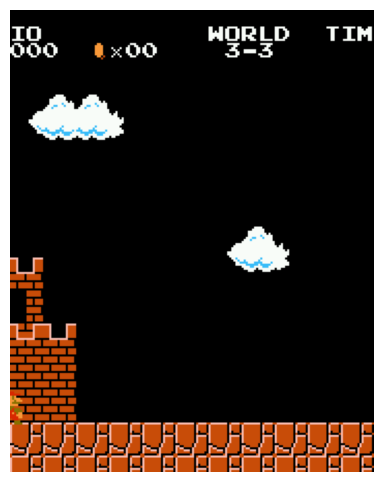

Creating background for scene w3l3s1
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w3l3_rep-000.bk2


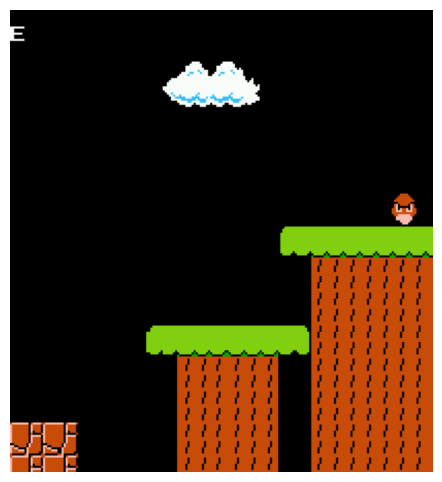

Creating background for scene w3l3s2
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w3l3_rep-000.bk2


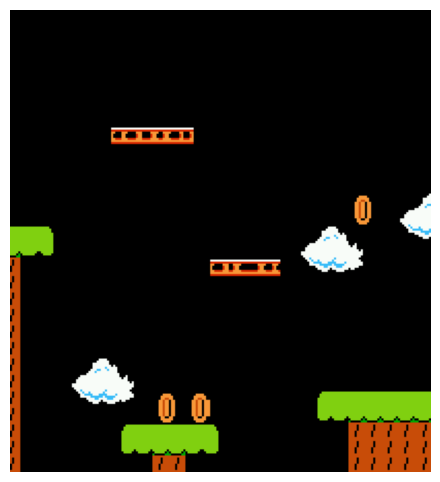

Creating background for scene w3l3s3
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w3l3_rep-000.bk2


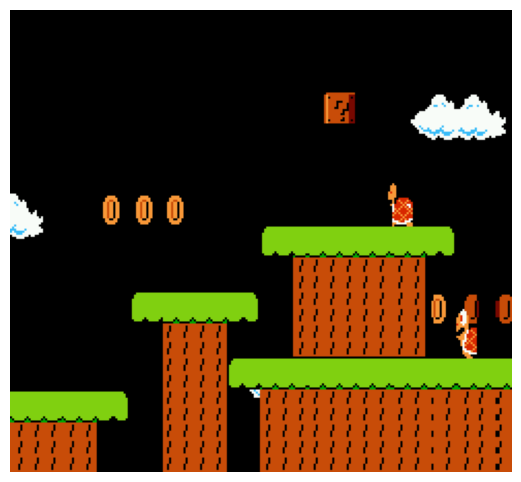

Creating background for scene w3l3s4
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w3l3_rep-000.bk2


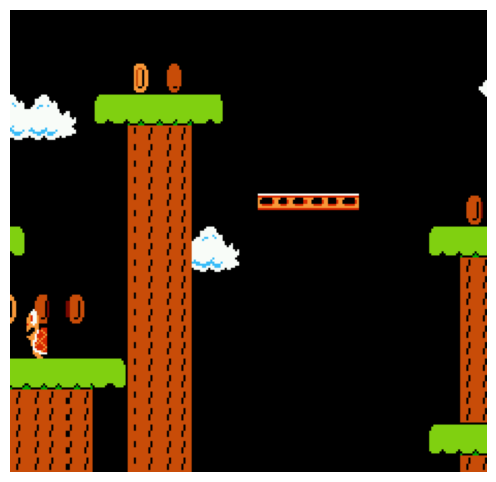

Creating background for scene w3l3s5
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w3l3_rep-000.bk2


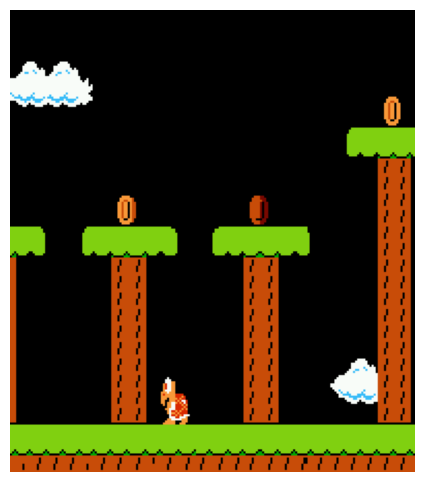

Creating background for scene w3l3s6
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w3l3_rep-000.bk2


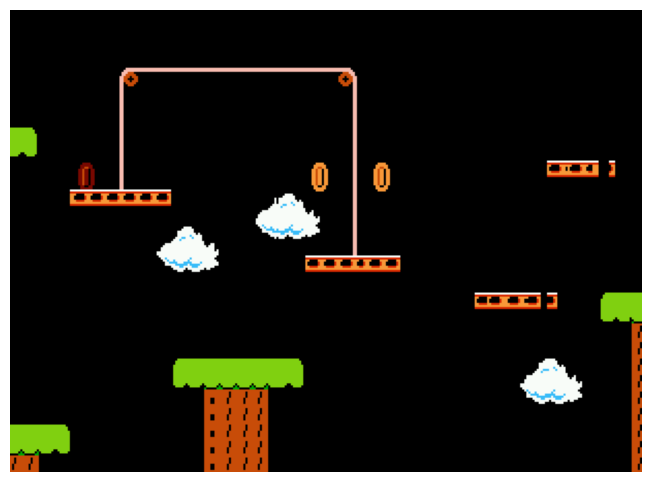

Creating background for scene w3l3s7
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w3l3_rep-000.bk2


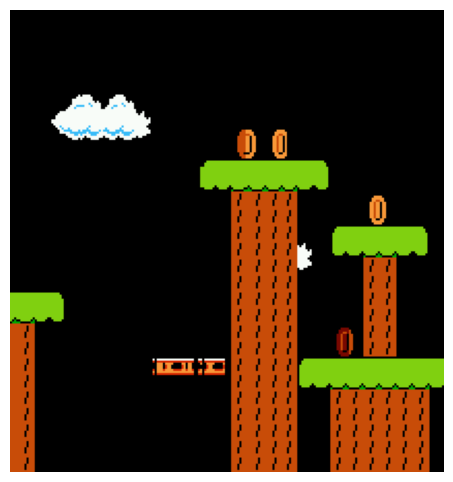

Creating background for scene w3l3s8
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w3l3_rep-000.bk2


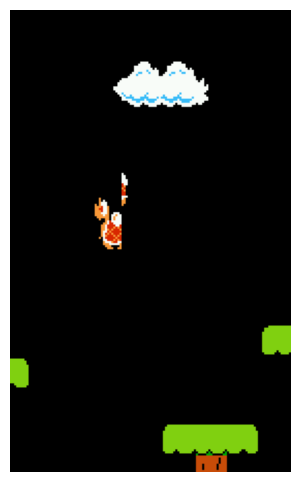

Creating background for scene w3l3s9
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w3l3_rep-000.bk2


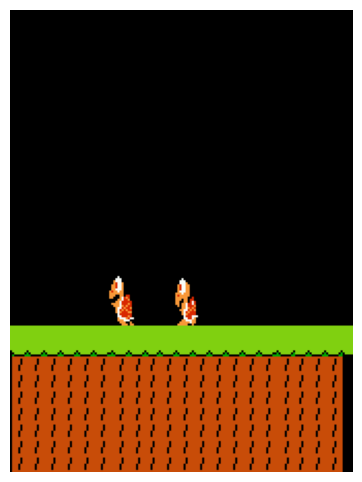

Creating background for scene w3l3s10
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w3l3_rep-000.bk2


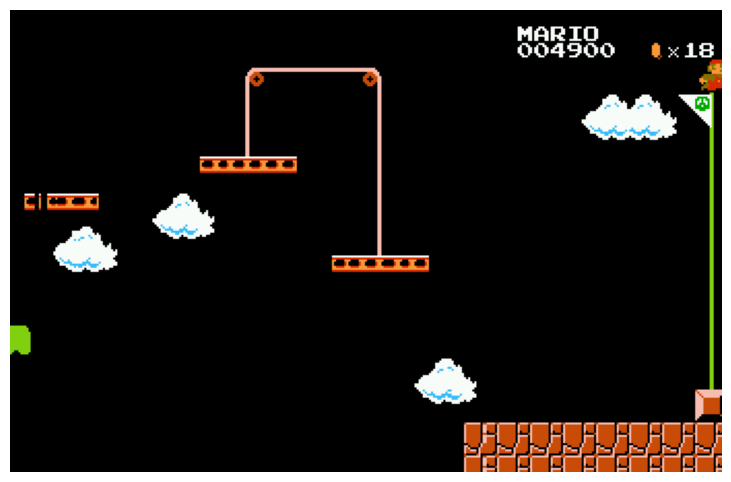

Creating background for scene w4l1s0
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w4l1_rep-000.bk2


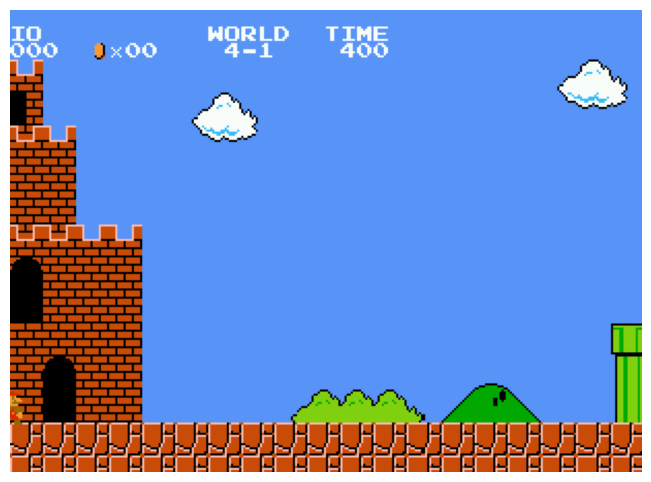

Creating background for scene w4l1s1
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w4l1_rep-000.bk2


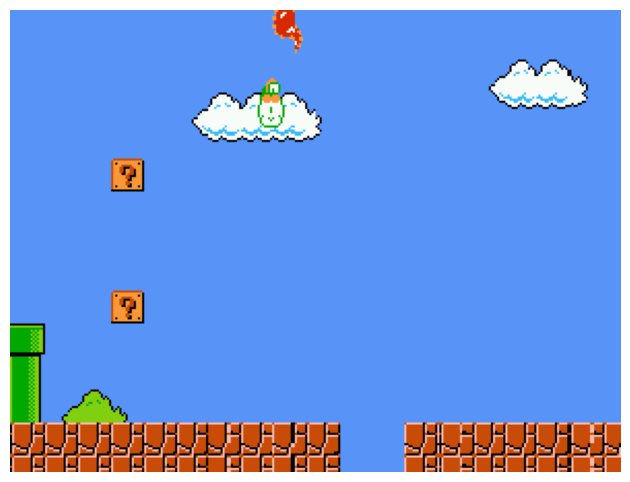

Creating background for scene w4l1s2
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w4l1_rep-000.bk2


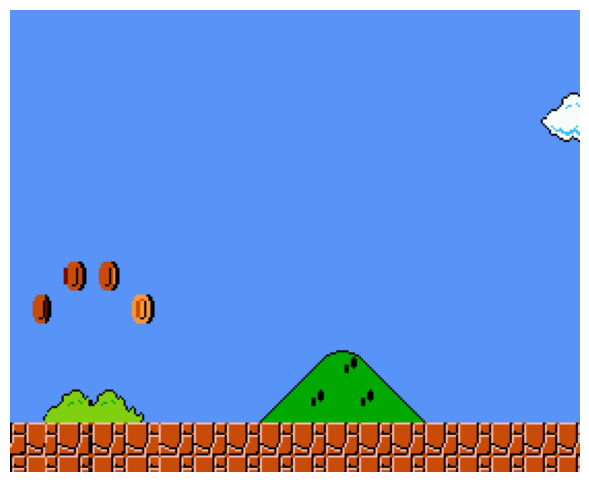

Creating background for scene w4l1s3
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w4l1_rep-000.bk2


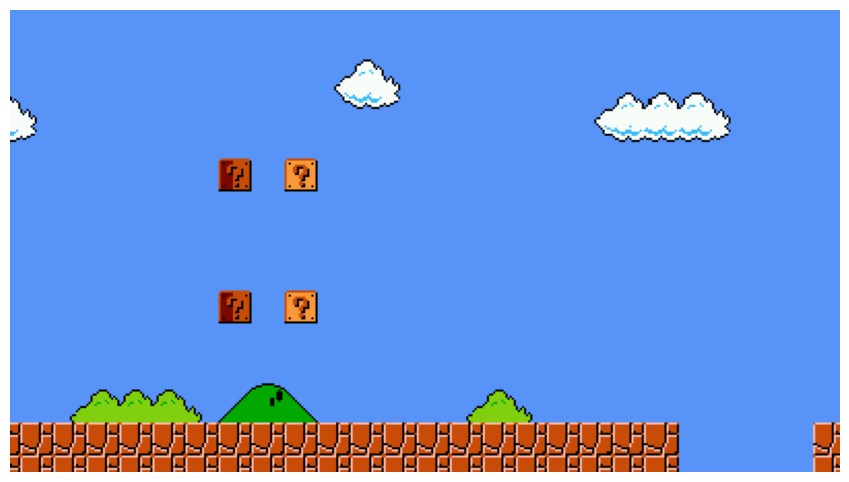

Creating background for scene w4l1s4
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w4l1_rep-000.bk2


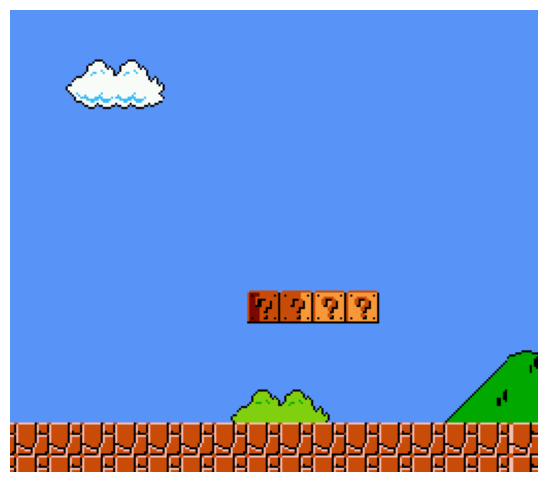

Creating background for scene w4l1s5
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w4l1_rep-000.bk2


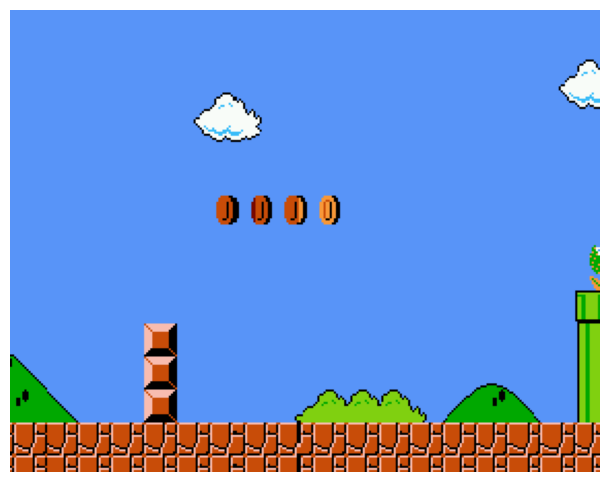

Creating background for scene w4l1s6
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w4l1_rep-000.bk2


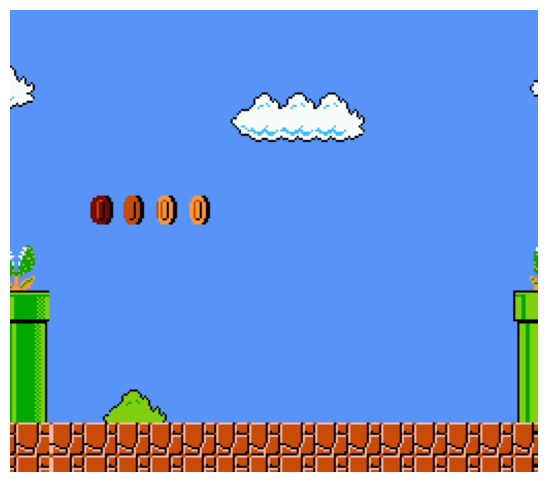

Creating background for scene w4l1s7
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w4l1_rep-000.bk2


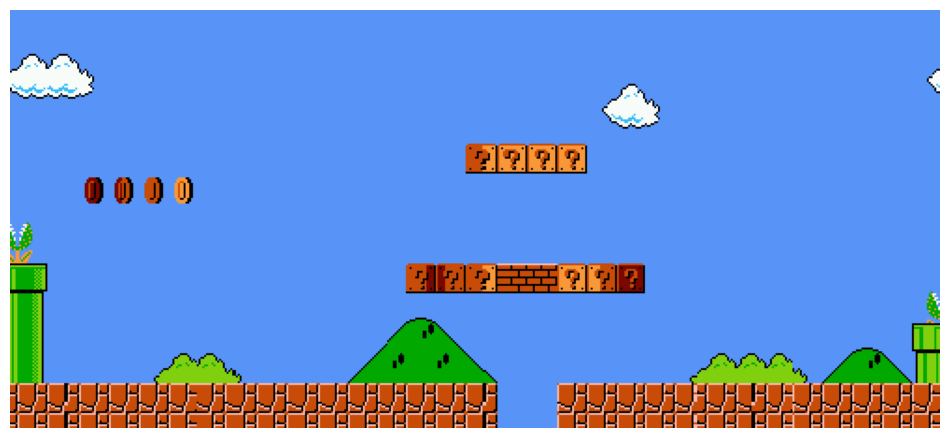

Creating background for scene w4l1s8
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w4l1_rep-000.bk2
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w4l1_rep-001.bk2
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w4l1_rep-002.bk2
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w4l1_rep-003.bk2
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w4l1_rep-004.bk2
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w4l1_rep-005.bk2
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w4l1_rep-006.bk2
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w4l1_rep-007.bk2
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w4l1_rep-008.bk2
Processing sub-01/ses-007/gamelogs/sub-01_ses-007_task-mario_level-w4l1_rep-001.bk2
Processing sub-01/ses-007/gamelogs/sub-01_ses-007_task-mario_level-w4l1_rep-000.bk2
Processing sub-01/ses-008/gamelogs/sub-

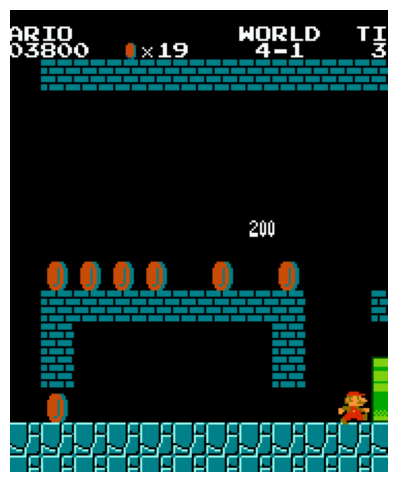

Creating background for scene w4l1s9
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w4l1_rep-000.bk2


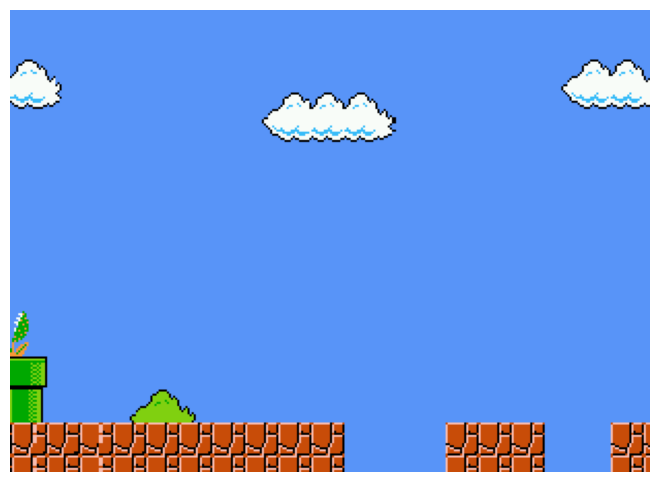

Creating background for scene w4l1s10
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w4l1_rep-000.bk2


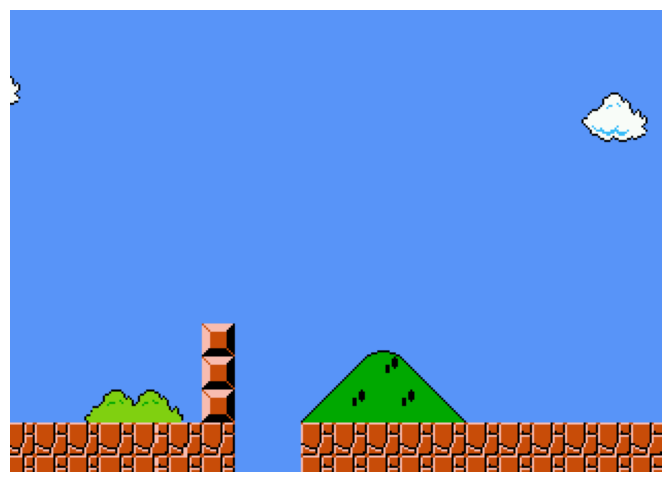

Creating background for scene w4l1s11
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w4l1_rep-000.bk2


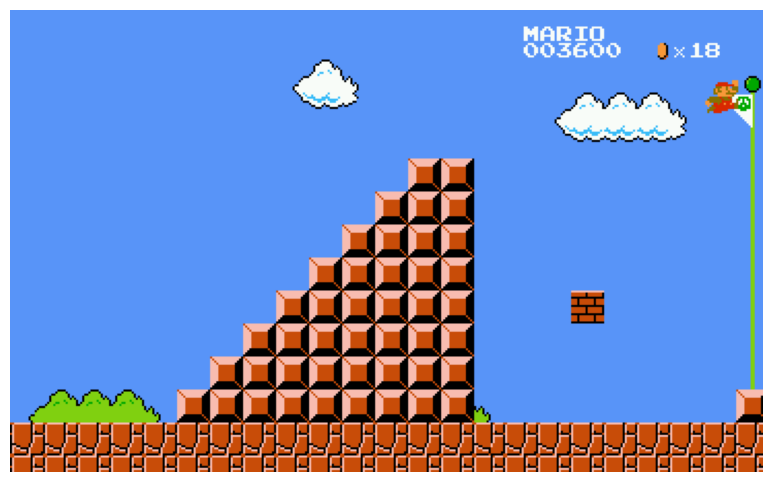

Creating background for scene w4l2s0
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w4l2_rep-000.bk2


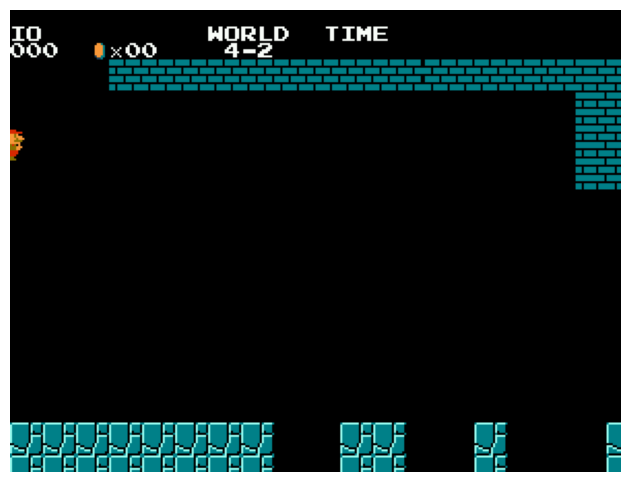

Creating background for scene w4l2s1
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w4l2_rep-000.bk2


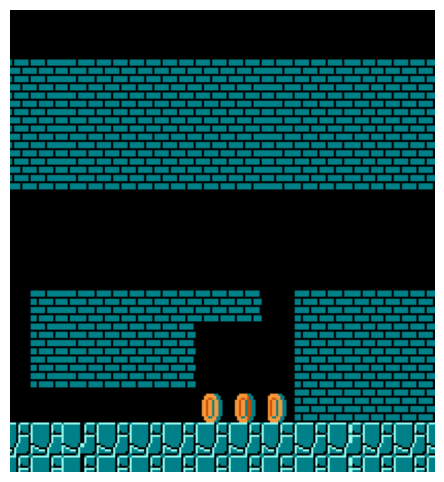

Creating background for scene w4l2s2
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w4l2_rep-000.bk2


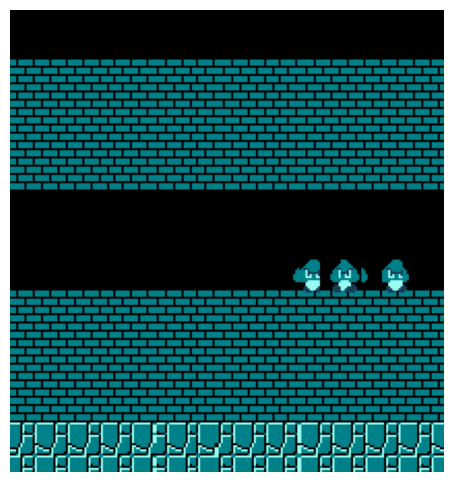

Creating background for scene w4l2s3
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w4l2_rep-000.bk2


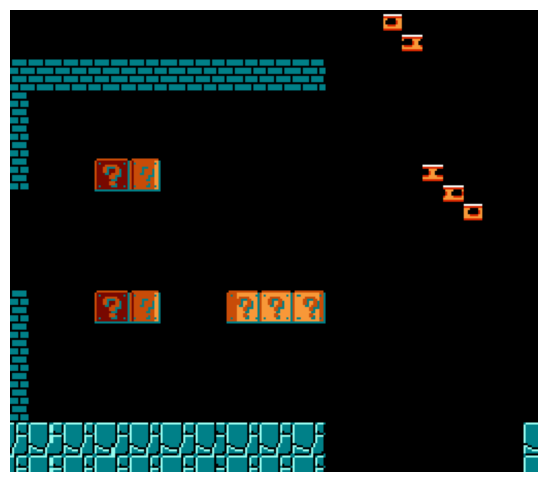

Creating background for scene w4l2s4
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w4l2_rep-000.bk2


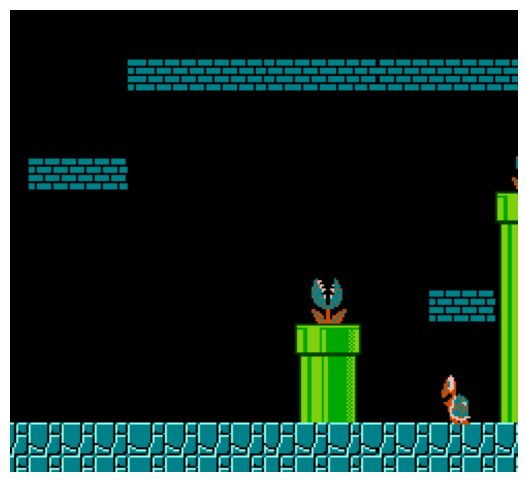

Creating background for scene w4l2s5
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w4l2_rep-000.bk2
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w4l2_rep-001.bk2
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w4l2_rep-002.bk2
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w4l2_rep-003.bk2
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w4l2_rep-004.bk2
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w4l2_rep-005.bk2
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w4l2_rep-006.bk2
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w4l2_rep-007.bk2
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w4l2_rep-008.bk2
Processing sub-01/ses-007/gamelogs/sub-01_ses-007_task-mario_level-w4l2_rep-002.bk2
Processing sub-01/ses-007/gamelogs/sub-01_ses-007_task-mario_level-w4l2_rep-001.bk2
Processing sub-01/ses-007/gamelogs/sub-

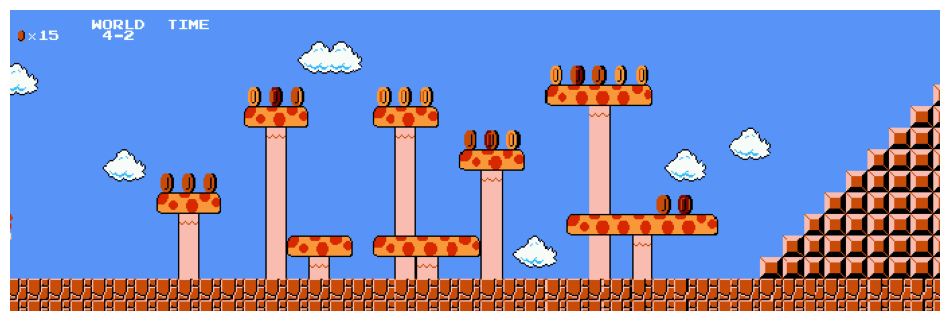

Creating background for scene w4l2s6
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w4l2_rep-000.bk2
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w4l2_rep-001.bk2
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w4l2_rep-002.bk2
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w4l2_rep-003.bk2
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w4l2_rep-004.bk2
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w4l2_rep-005.bk2
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w4l2_rep-006.bk2
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w4l2_rep-007.bk2
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w4l2_rep-008.bk2
Processing sub-01/ses-007/gamelogs/sub-01_ses-007_task-mario_level-w4l2_rep-002.bk2
Processing sub-01/ses-007/gamelogs/sub-01_ses-007_task-mario_level-w4l2_rep-001.bk2
Processing sub-01/ses-007/gamelogs/sub-

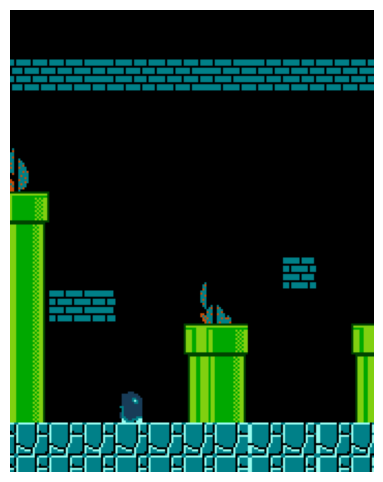

Creating background for scene w4l2s8
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w4l2_rep-000.bk2
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w4l2_rep-001.bk2
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w4l2_rep-002.bk2
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w4l2_rep-003.bk2
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w4l2_rep-004.bk2
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w4l2_rep-005.bk2
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w4l2_rep-006.bk2
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w4l2_rep-007.bk2
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w4l2_rep-008.bk2
Processing sub-01/ses-007/gamelogs/sub-01_ses-007_task-mario_level-w4l2_rep-002.bk2
Processing sub-01/ses-007/gamelogs/sub-01_ses-007_task-mario_level-w4l2_rep-001.bk2
Processing sub-01/ses-007/gamelogs/sub-

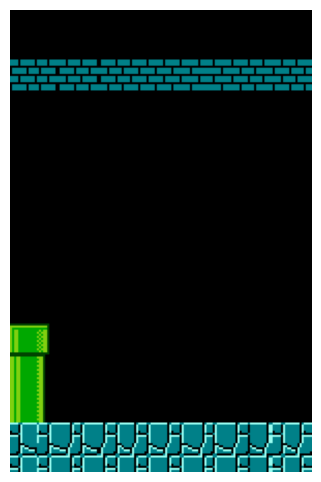

Creating background for scene w4l2s10
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w4l2_rep-000.bk2


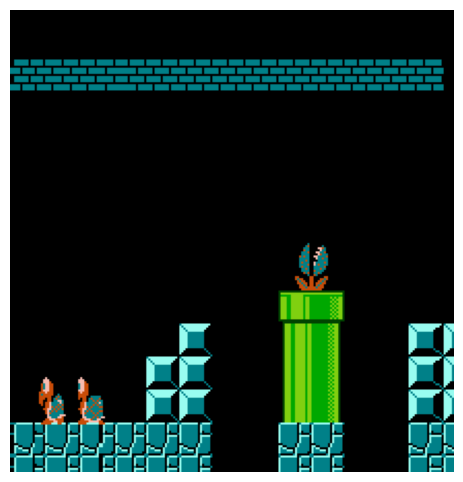

Creating background for scene w4l2s11
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w4l2_rep-000.bk2


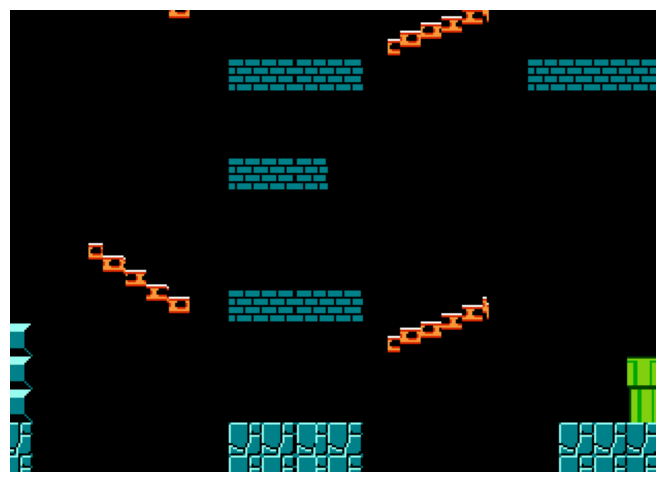

Creating background for scene w4l2s12
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w4l2_rep-000.bk2


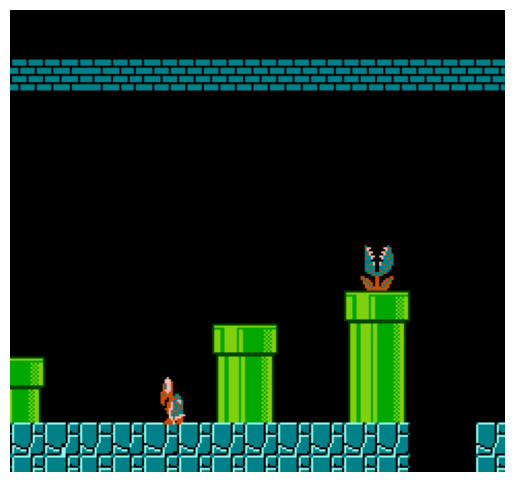

Creating background for scene w4l2s13
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w4l2_rep-000.bk2


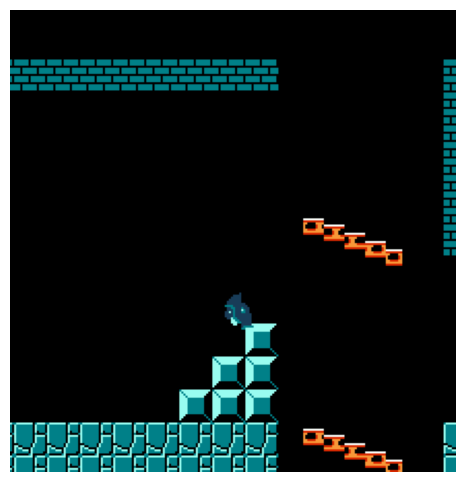

Creating background for scene w4l2s14
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w4l2_rep-000.bk2


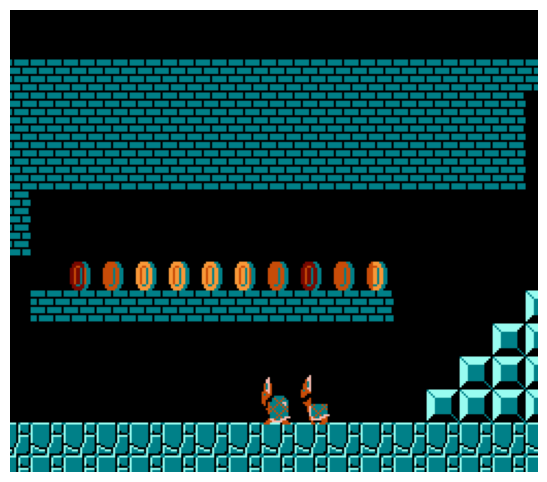

Creating background for scene w4l2s15
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w4l2_rep-000.bk2


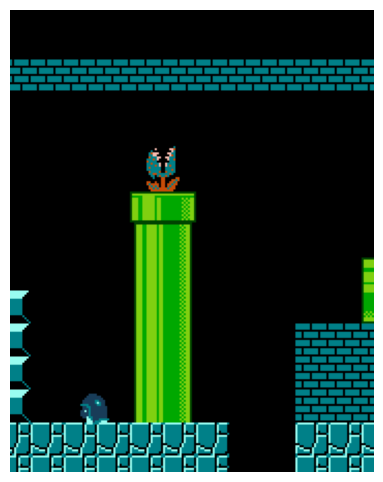

Creating background for scene w4l2s16
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w4l2_rep-000.bk2
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w4l2_rep-001.bk2
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w4l2_rep-002.bk2
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w4l2_rep-003.bk2
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w4l2_rep-004.bk2
Creating background for scene w4l2s17
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w4l2_rep-000.bk2
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w4l2_rep-001.bk2
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w4l2_rep-002.bk2
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w4l2_rep-003.bk2
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w4l2_rep-004.bk2
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w4l2_rep-005.bk2


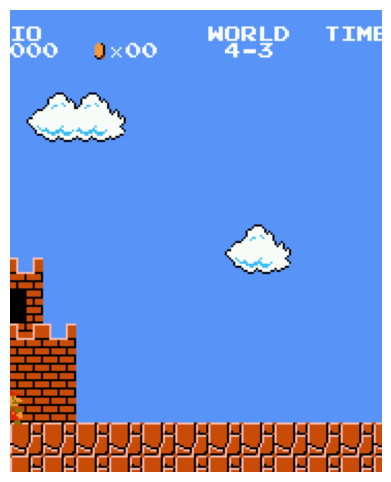

Creating background for scene w4l3s1
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w4l3_rep-000.bk2


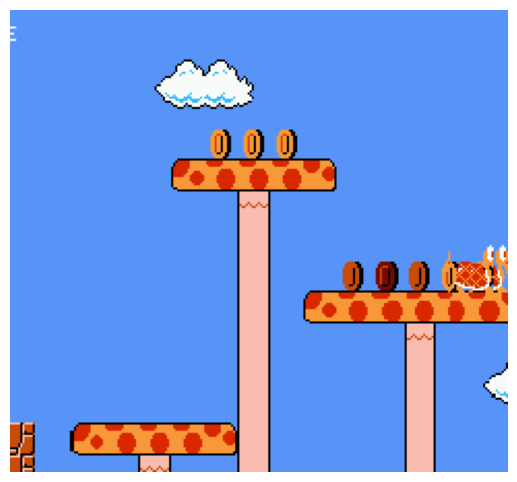

Creating background for scene w4l3s2
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w4l3_rep-000.bk2


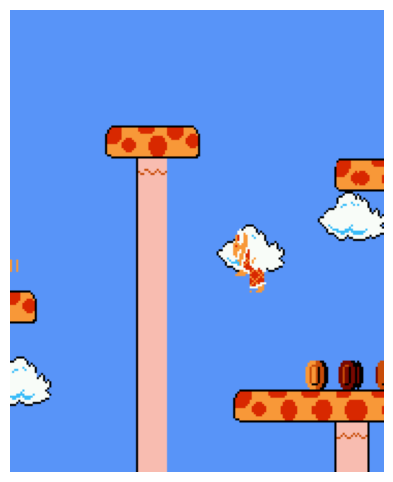

Creating background for scene w4l3s3
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w4l3_rep-000.bk2


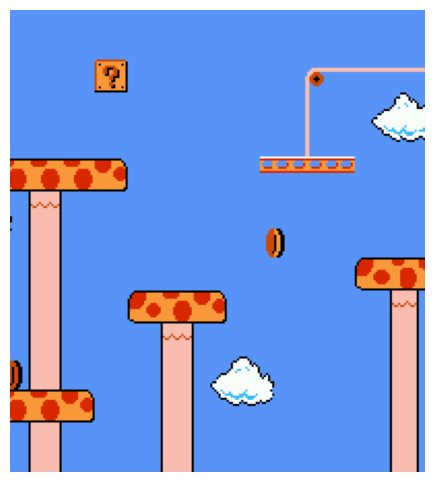

Creating background for scene w4l3s4
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w4l3_rep-000.bk2


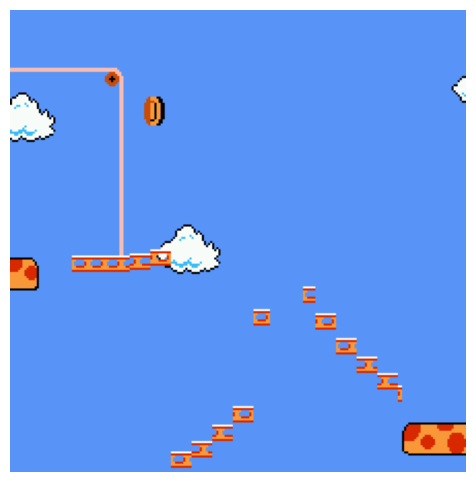

Creating background for scene w4l3s5
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w4l3_rep-000.bk2


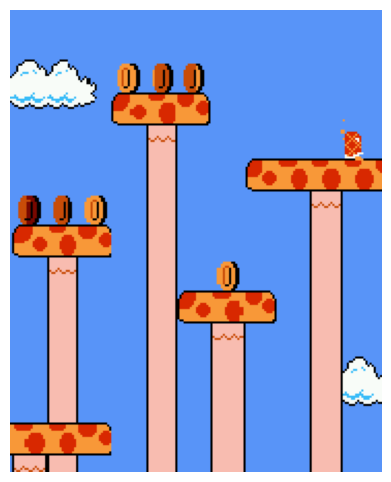

Creating background for scene w4l3s6
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w4l3_rep-000.bk2


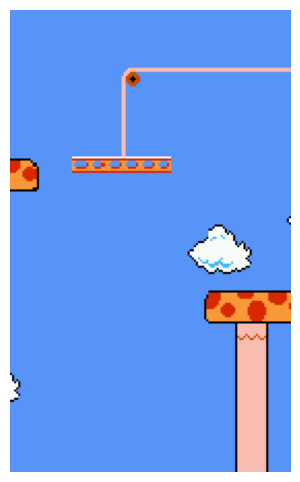

Creating background for scene w4l3s7
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w4l3_rep-000.bk2


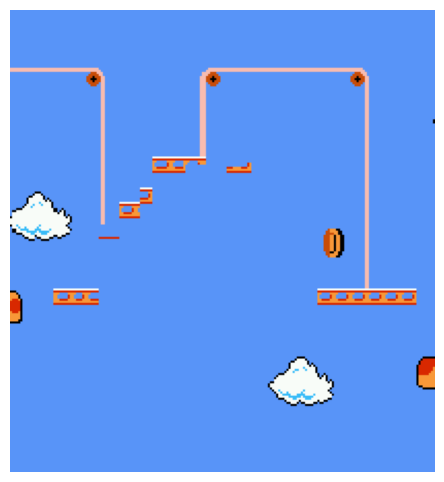

Creating background for scene w4l3s8
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w4l3_rep-000.bk2


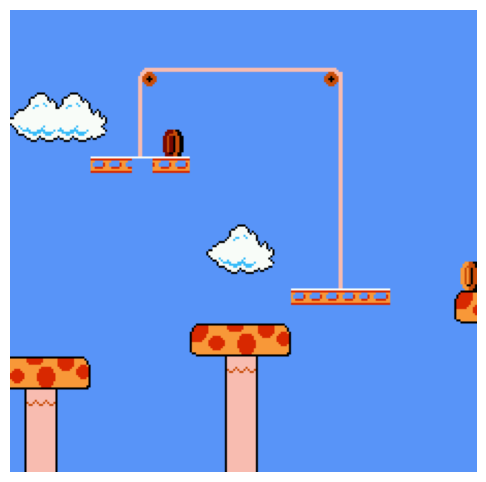

Creating background for scene w4l3s9
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w4l3_rep-000.bk2


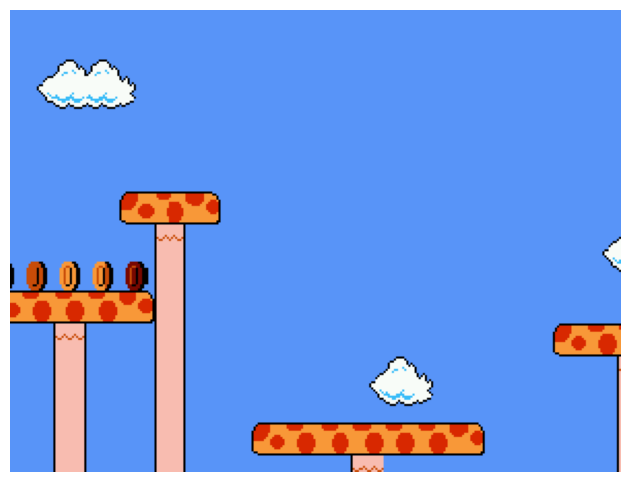

Creating background for scene w4l3s10
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w4l3_rep-000.bk2


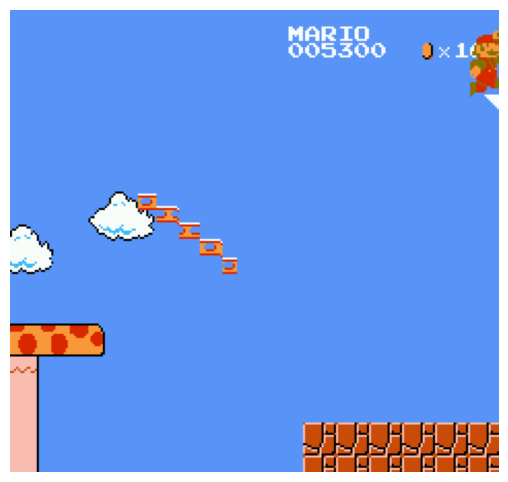

Creating background for scene w5l1s0
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w5l1_rep-000.bk2


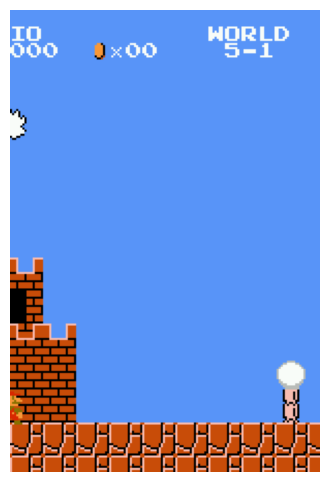

Creating background for scene w5l1s1
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w5l1_rep-000.bk2


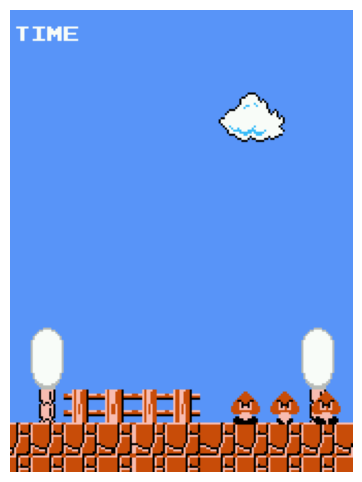

Creating background for scene w5l1s2
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w5l1_rep-000.bk2


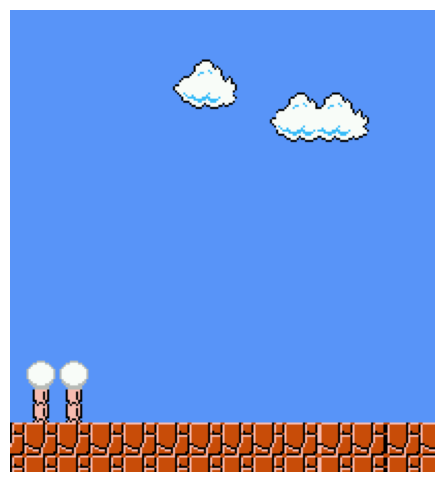

Creating background for scene w5l1s3
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w5l1_rep-000.bk2


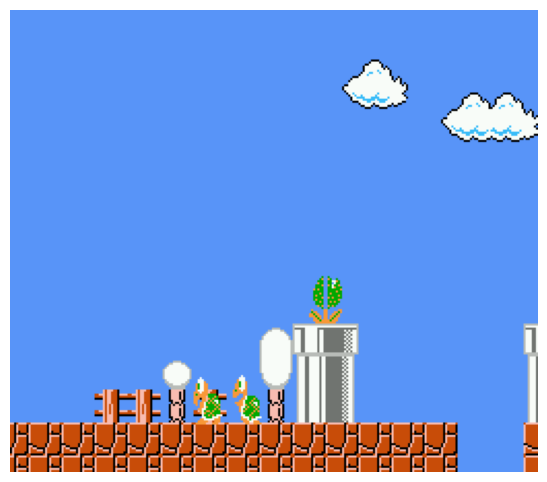

Creating background for scene w5l1s4
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w5l1_rep-000.bk2


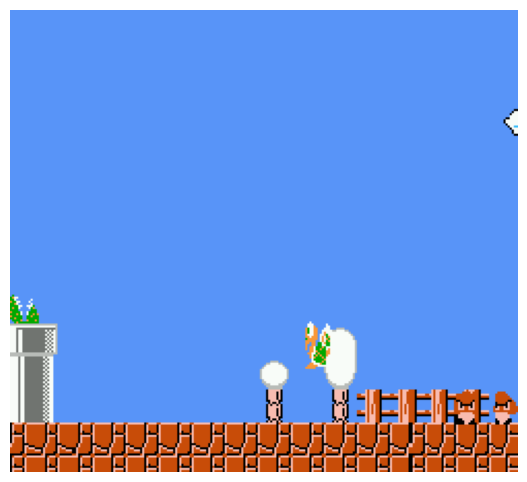

Creating background for scene w5l1s5
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w5l1_rep-000.bk2


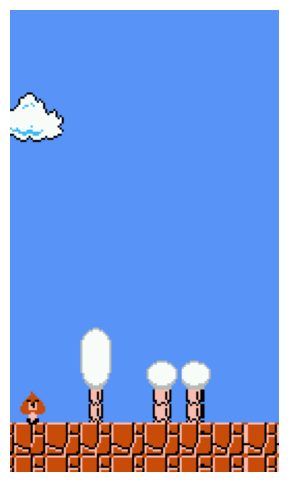

Creating background for scene w5l1s6
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w5l1_rep-000.bk2


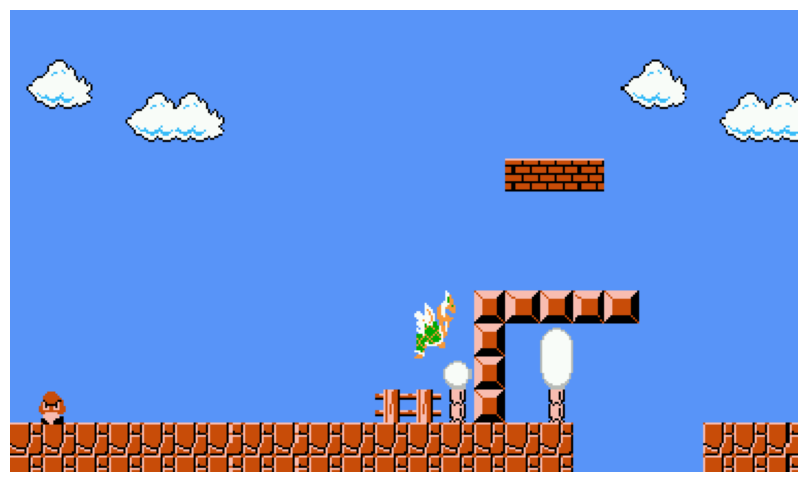

Creating background for scene w5l1s7
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w5l1_rep-000.bk2


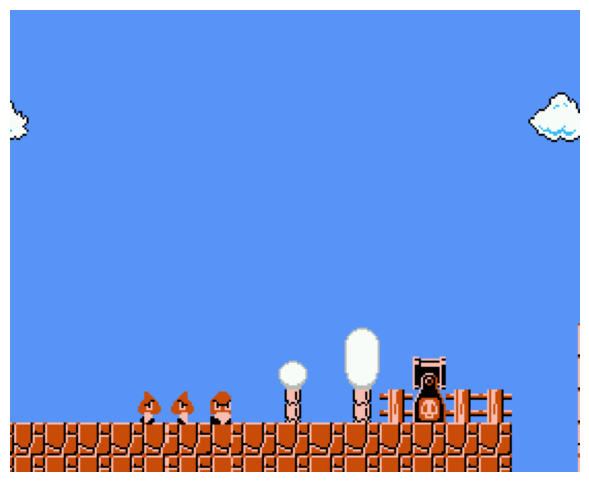

Creating background for scene w5l1s8
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w5l1_rep-000.bk2


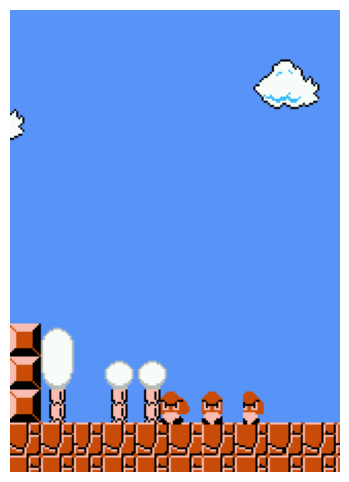

Creating background for scene w5l1s9
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w5l1_rep-000.bk2


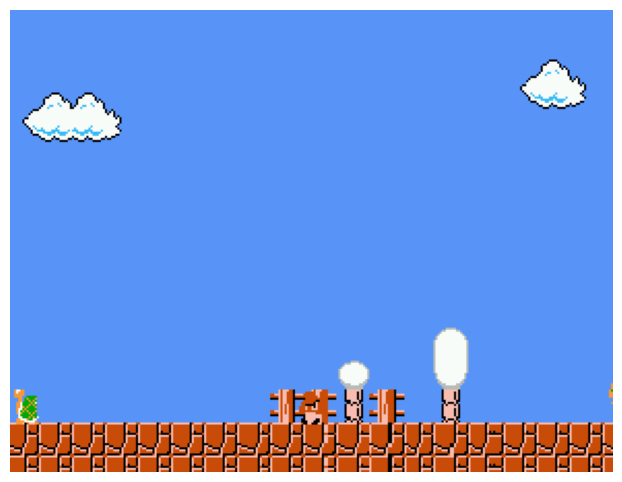

Creating background for scene w5l1s10
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w5l1_rep-000.bk2


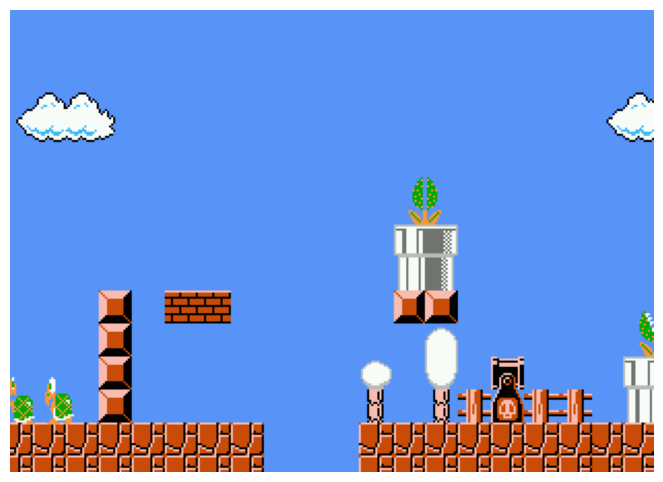

Creating background for scene w5l1s11
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w5l1_rep-000.bk2
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w5l1_rep-001.bk2
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w5l1_rep-002.bk2
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w5l1_rep-003.bk2
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w5l1_rep-004.bk2
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w5l1_rep-005.bk2
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w5l1_rep-006.bk2
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w5l1_rep-007.bk2
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w5l1_rep-008.bk2
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w5l1_rep-009.bk2
Processing sub-01/ses-007/gamelogs/sub-01_ses-007_task-mario_level-w5l1_rep-001.bk2
Processing sub-01/ses-007/gamelogs/sub

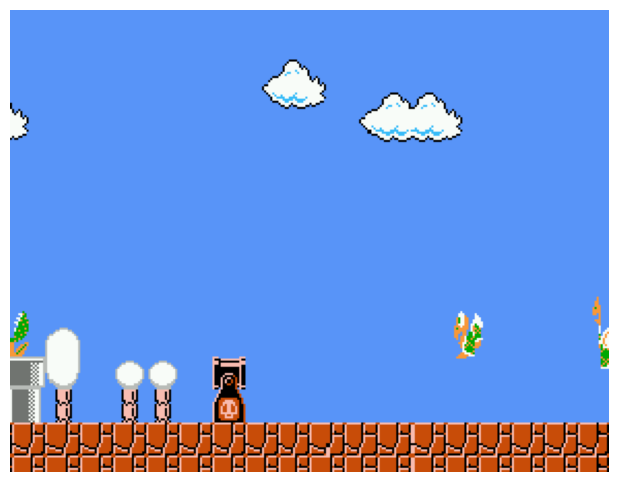

Creating background for scene w5l1s13
Processing sub-01/ses-003/gamelogs/sub-01_ses-003_task-mario_level-w5l1_rep-000.bk2


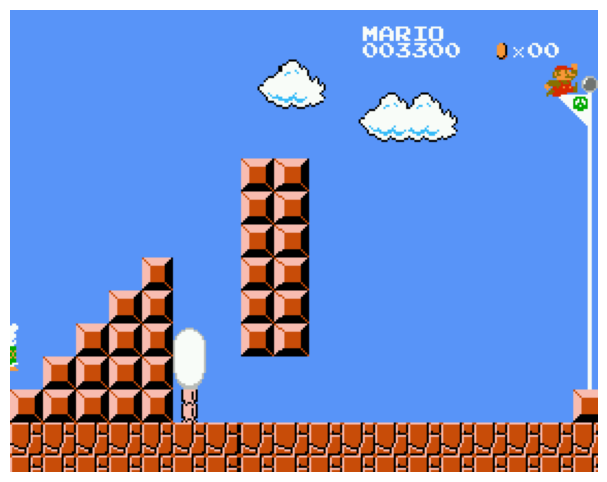

Creating background for scene w5l2s0
Processing sub-01/ses-004/gamelogs/sub-01_ses-004_task-mario_level-w5l2_rep-000.bk2


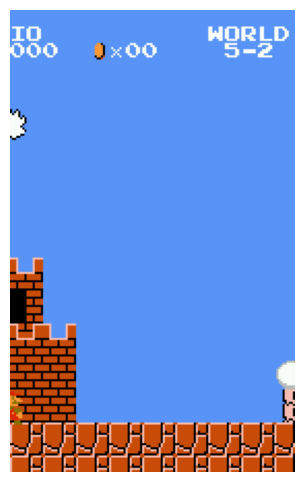

Creating background for scene w5l2s1
Processing sub-01/ses-004/gamelogs/sub-01_ses-004_task-mario_level-w5l2_rep-000.bk2


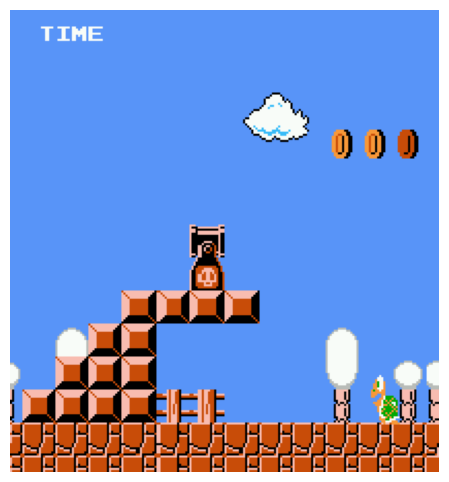

Creating background for scene w5l2s2
Processing sub-01/ses-004/gamelogs/sub-01_ses-004_task-mario_level-w5l2_rep-000.bk2


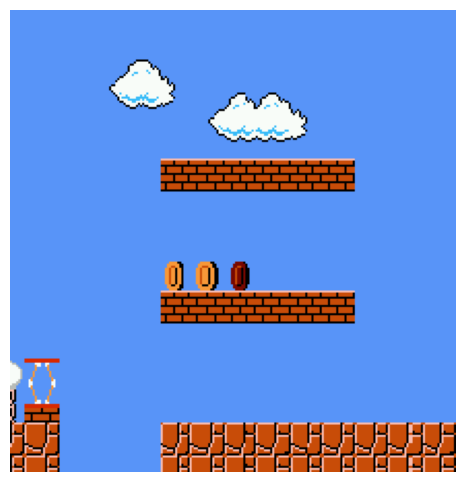

Creating background for scene w5l2s3
Processing sub-01/ses-004/gamelogs/sub-01_ses-004_task-mario_level-w5l2_rep-000.bk2


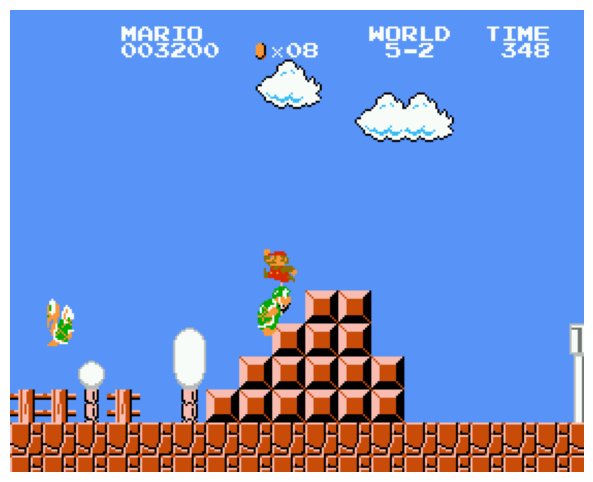

Creating background for scene w5l2s4
Processing sub-01/ses-004/gamelogs/sub-01_ses-004_task-mario_level-w5l2_rep-000.bk2
Creating background for scene w5l2s5
Processing sub-01/ses-004/gamelogs/sub-01_ses-004_task-mario_level-w5l2_rep-000.bk2
Processing sub-01/ses-004/gamelogs/sub-01_ses-004_task-mario_level-w5l2_rep-001.bk2
Processing sub-01/ses-004/gamelogs/sub-01_ses-004_task-mario_level-w5l2_rep-002.bk2
Processing sub-01/ses-004/gamelogs/sub-01_ses-004_task-mario_level-w5l2_rep-003.bk2
Processing sub-01/ses-004/gamelogs/sub-01_ses-004_task-mario_level-w5l2_rep-004.bk2
Processing sub-01/ses-004/gamelogs/sub-01_ses-004_task-mario_level-w5l2_rep-005.bk2
Processing sub-01/ses-004/gamelogs/sub-01_ses-004_task-mario_level-w5l2_rep-006.bk2
Processing sub-01/ses-004/gamelogs/sub-01_ses-004_task-mario_level-w5l2_rep-007.bk2
Processing sub-01/ses-004/gamelogs/sub-01_ses-004_task-mario_level-w5l2_rep-008.bk2
Processing sub-01/ses-004/gamelogs/sub-01_ses-004_task-mario_level-w5l2_rep-009.bk2
Pr

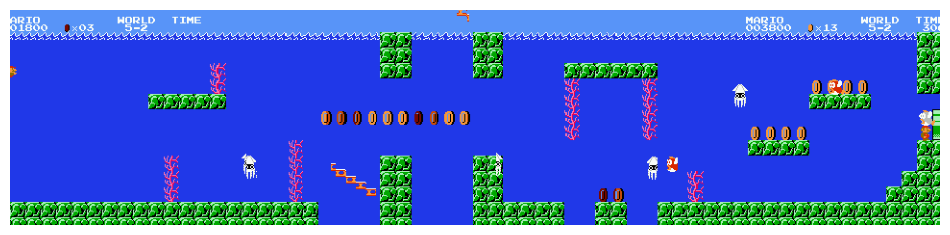

Creating background for scene w5l2s6
Processing sub-01/ses-004/gamelogs/sub-01_ses-004_task-mario_level-w5l2_rep-000.bk2
Creating background for scene w5l2s7
Processing sub-01/ses-004/gamelogs/sub-01_ses-004_task-mario_level-w5l2_rep-000.bk2
Processing sub-01/ses-004/gamelogs/sub-01_ses-004_task-mario_level-w5l2_rep-001.bk2
Processing sub-01/ses-004/gamelogs/sub-01_ses-004_task-mario_level-w5l2_rep-002.bk2
Processing sub-01/ses-004/gamelogs/sub-01_ses-004_task-mario_level-w5l2_rep-003.bk2
Processing sub-01/ses-004/gamelogs/sub-01_ses-004_task-mario_level-w5l2_rep-004.bk2
Processing sub-01/ses-004/gamelogs/sub-01_ses-004_task-mario_level-w5l2_rep-005.bk2
Processing sub-01/ses-004/gamelogs/sub-01_ses-004_task-mario_level-w5l2_rep-006.bk2
Processing sub-01/ses-004/gamelogs/sub-01_ses-004_task-mario_level-w5l2_rep-007.bk2
Processing sub-01/ses-004/gamelogs/sub-01_ses-004_task-mario_level-w5l2_rep-008.bk2
Processing sub-01/ses-004/gamelogs/sub-01_ses-004_task-mario_level-w5l2_rep-009.bk2
Pr

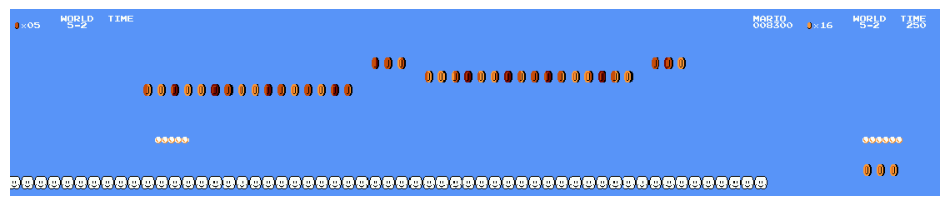

Creating background for scene w5l2s8
Processing sub-01/ses-004/gamelogs/sub-01_ses-004_task-mario_level-w5l2_rep-000.bk2
Creating background for scene w5l2s9
Processing sub-01/ses-004/gamelogs/sub-01_ses-004_task-mario_level-w5l2_rep-000.bk2
Creating background for scene w5l2s10
Processing sub-01/ses-004/gamelogs/sub-01_ses-004_task-mario_level-w5l2_rep-000.bk2
Creating background for scene w5l2s11
Processing sub-01/ses-004/gamelogs/sub-01_ses-004_task-mario_level-w5l2_rep-000.bk2
Creating background for scene w5l2s12
Processing sub-01/ses-004/gamelogs/sub-01_ses-004_task-mario_level-w5l2_rep-000.bk2
Creating background for scene w5l2s13
Processing sub-01/ses-004/gamelogs/sub-01_ses-004_task-mario_level-w5l2_rep-000.bk2
Creating background for scene w5l2s14
Processing sub-01/ses-004/gamelogs/sub-01_ses-004_task-mario_level-w5l2_rep-000.bk2
Creating background for scene w5l3s0
Processing sub-01/ses-004/gamelogs/sub-01_ses-004_task-mario_level-w5l3_rep-000.bk2


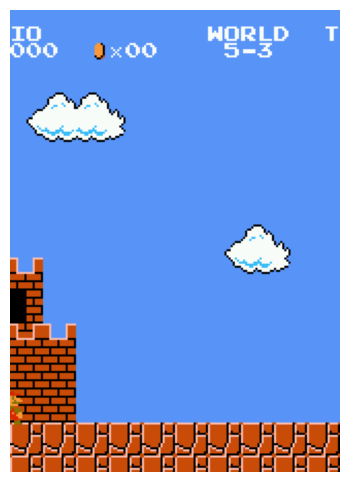

Creating background for scene w5l3s1
Processing sub-01/ses-004/gamelogs/sub-01_ses-004_task-mario_level-w5l3_rep-000.bk2


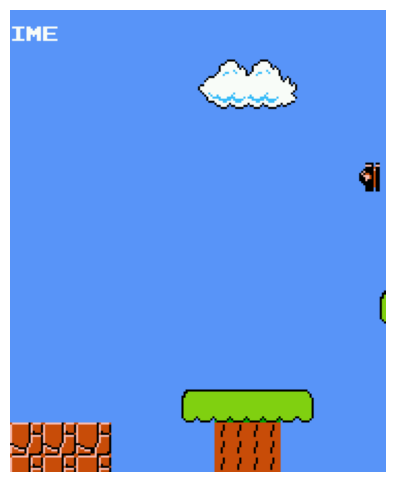

Creating background for scene w5l3s2
Processing sub-01/ses-004/gamelogs/sub-01_ses-004_task-mario_level-w5l3_rep-000.bk2


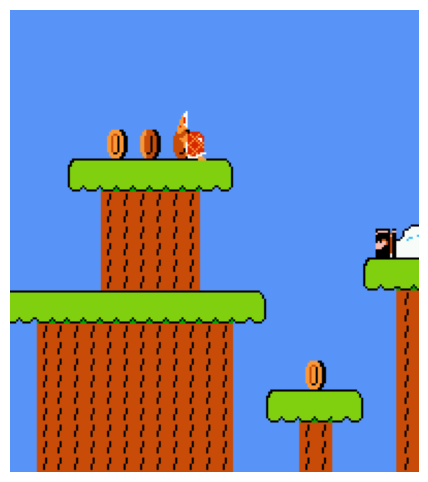

Creating background for scene w5l3s3
Processing sub-01/ses-004/gamelogs/sub-01_ses-004_task-mario_level-w5l3_rep-000.bk2


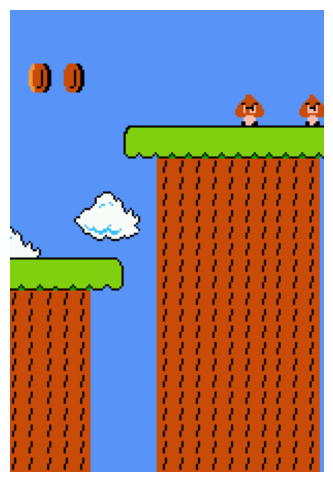

Creating background for scene w5l3s4
Processing sub-01/ses-004/gamelogs/sub-01_ses-004_task-mario_level-w5l3_rep-000.bk2


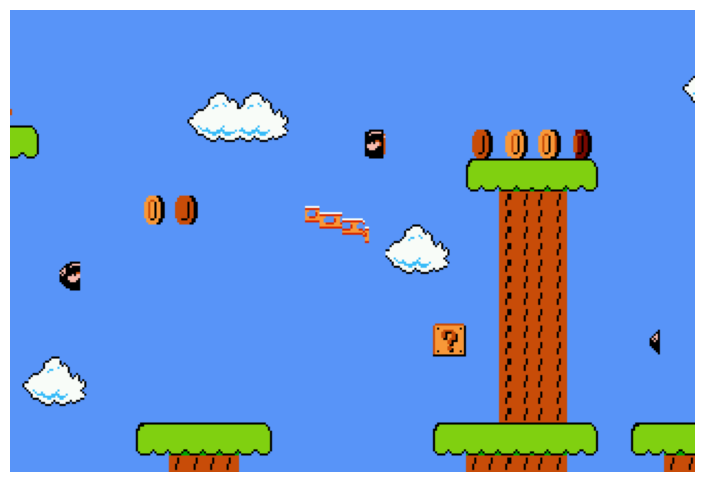

Creating background for scene w5l3s5
Processing sub-01/ses-004/gamelogs/sub-01_ses-004_task-mario_level-w5l3_rep-000.bk2


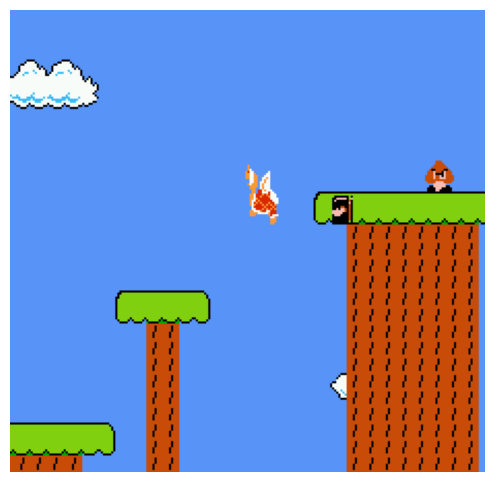

Creating background for scene w5l3s6
Processing sub-01/ses-004/gamelogs/sub-01_ses-004_task-mario_level-w5l3_rep-000.bk2


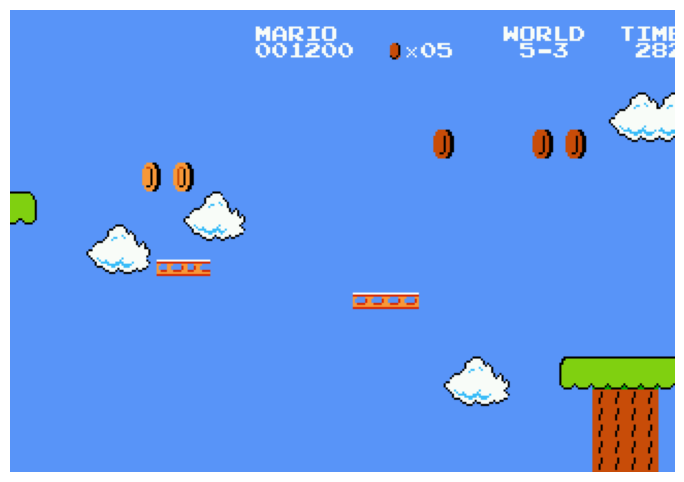

Creating background for scene w5l3s7
Processing sub-01/ses-004/gamelogs/sub-01_ses-004_task-mario_level-w5l3_rep-000.bk2


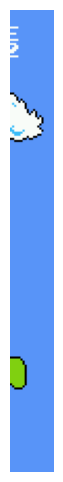

Creating background for scene w5l3s8
Processing sub-01/ses-004/gamelogs/sub-01_ses-004_task-mario_level-w5l3_rep-000.bk2
Creating background for scene w5l3s9
Processing sub-01/ses-004/gamelogs/sub-01_ses-004_task-mario_level-w5l3_rep-000.bk2
Creating background for scene w5l3s10
Processing sub-01/ses-004/gamelogs/sub-01_ses-004_task-mario_level-w5l3_rep-000.bk2
Creating background for scene w6l1s0
Processing sub-01/ses-004/gamelogs/sub-01_ses-004_task-mario_level-w6l1_rep-000.bk2


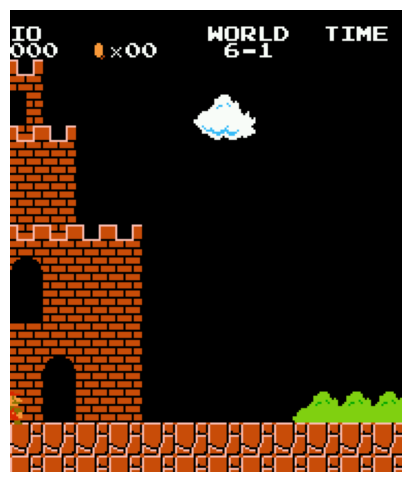

Creating background for scene w6l1s1
Processing sub-01/ses-004/gamelogs/sub-01_ses-004_task-mario_level-w6l1_rep-000.bk2


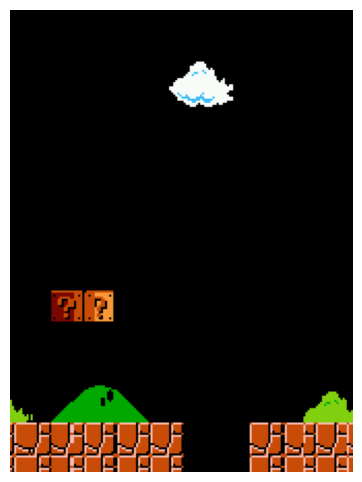

Creating background for scene w6l1s2
Processing sub-01/ses-004/gamelogs/sub-01_ses-004_task-mario_level-w6l1_rep-000.bk2


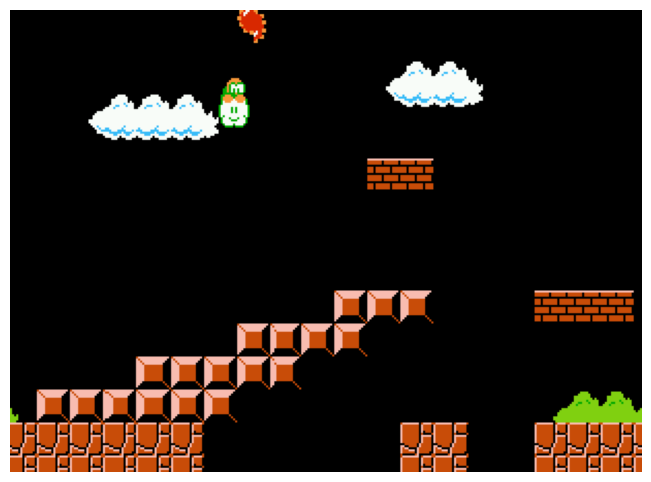

Creating background for scene w6l1s3
Processing sub-01/ses-004/gamelogs/sub-01_ses-004_task-mario_level-w6l1_rep-000.bk2


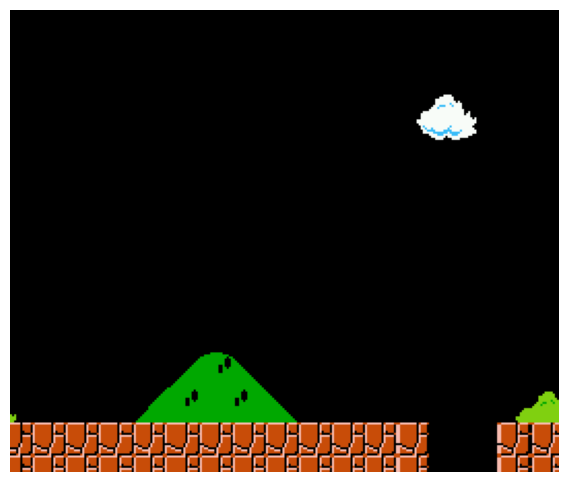

Creating background for scene w6l1s4
Processing sub-01/ses-004/gamelogs/sub-01_ses-004_task-mario_level-w6l1_rep-000.bk2


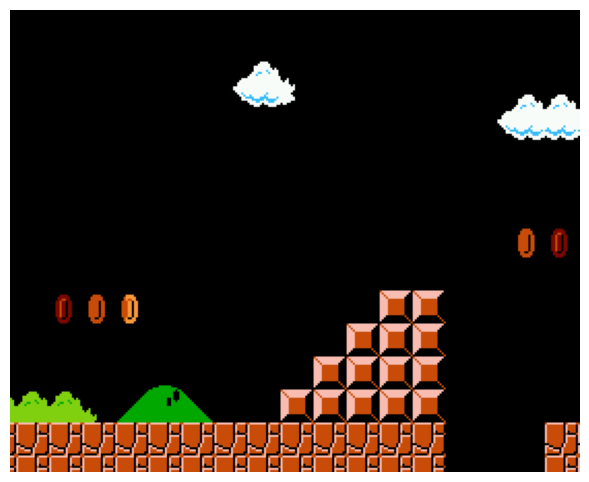

Creating background for scene w6l1s5
Processing sub-01/ses-004/gamelogs/sub-01_ses-004_task-mario_level-w6l1_rep-000.bk2


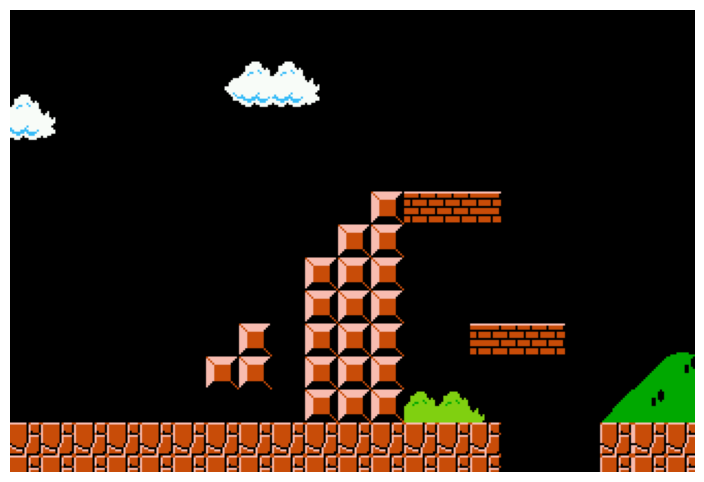

Creating background for scene w6l1s6
Processing sub-01/ses-004/gamelogs/sub-01_ses-004_task-mario_level-w6l1_rep-000.bk2


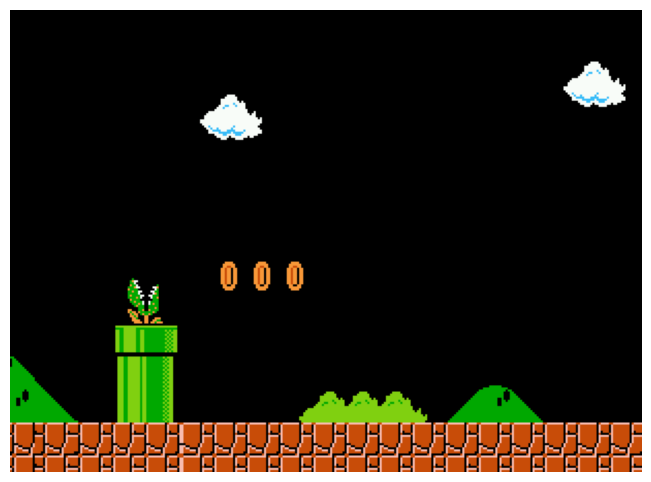

Creating background for scene w6l1s7
Processing sub-01/ses-004/gamelogs/sub-01_ses-004_task-mario_level-w6l1_rep-000.bk2


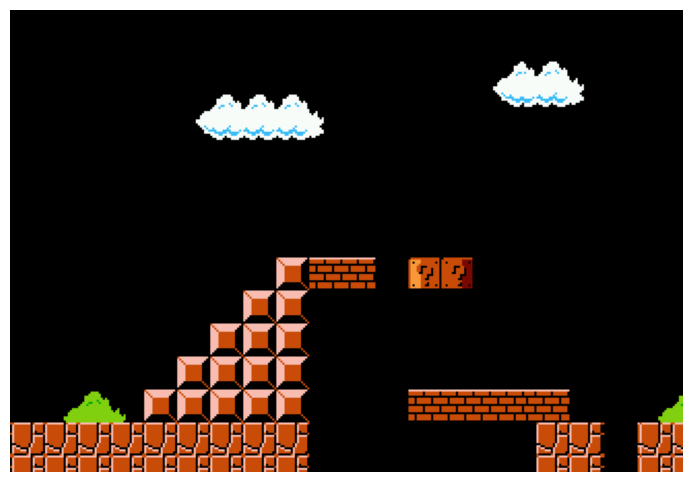

Creating background for scene w6l1s8
Processing sub-01/ses-004/gamelogs/sub-01_ses-004_task-mario_level-w6l1_rep-000.bk2


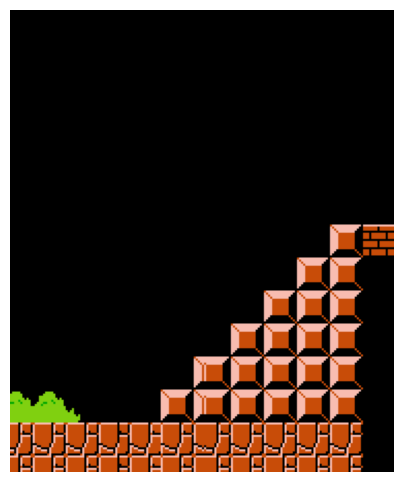

Creating background for scene w6l1s9
Processing sub-01/ses-004/gamelogs/sub-01_ses-004_task-mario_level-w6l1_rep-000.bk2


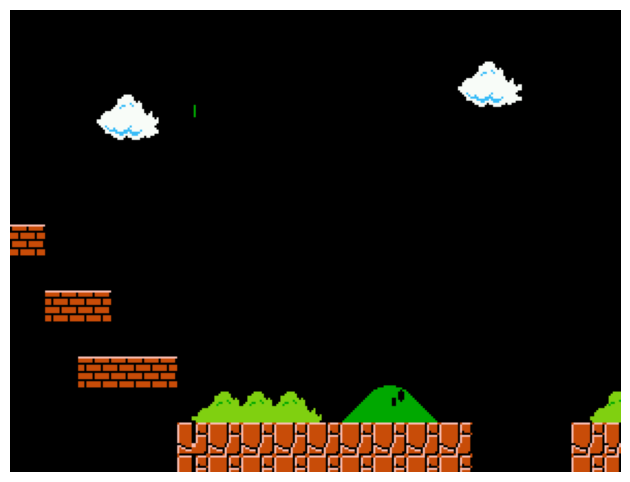

Creating background for scene w6l1s10
Processing sub-01/ses-004/gamelogs/sub-01_ses-004_task-mario_level-w6l1_rep-000.bk2


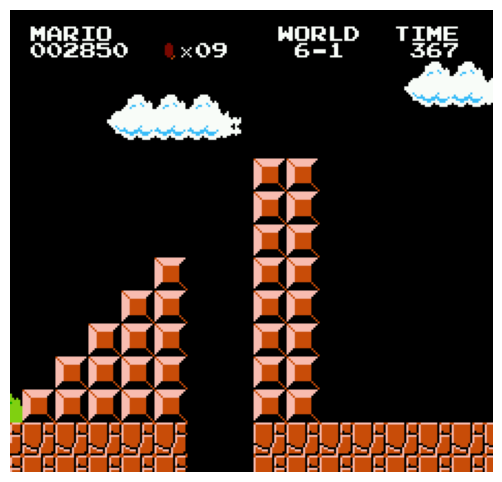

Creating background for scene w6l2s0
Processing sub-01/ses-004/gamelogs/sub-01_ses-004_task-mario_level-w6l2_rep-000.bk2


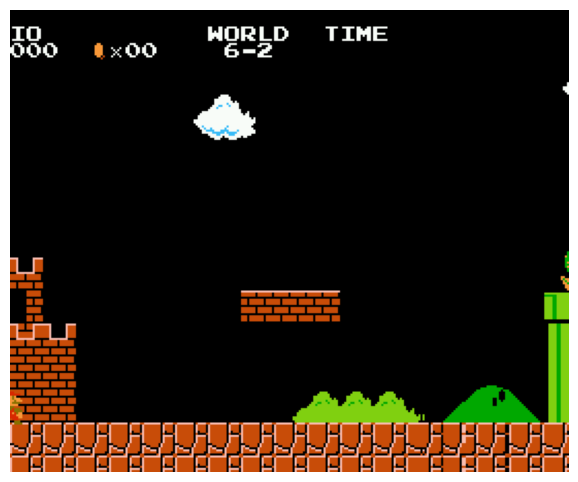

Creating background for scene w6l2s1
Processing sub-01/ses-004/gamelogs/sub-01_ses-004_task-mario_level-w6l2_rep-000.bk2


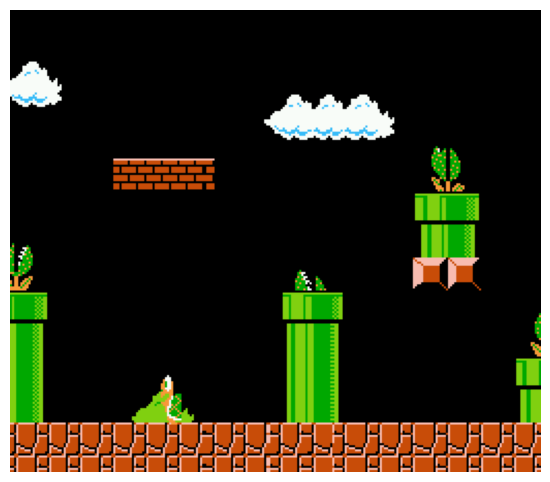

Creating background for scene w6l2s2
Processing sub-01/ses-004/gamelogs/sub-01_ses-004_task-mario_level-w6l2_rep-000.bk2
Processing sub-01/ses-004/gamelogs/sub-01_ses-004_task-mario_level-w6l2_rep-001.bk2
Processing sub-01/ses-004/gamelogs/sub-01_ses-004_task-mario_level-w6l2_rep-002.bk2
Processing sub-01/ses-004/gamelogs/sub-01_ses-004_task-mario_level-w6l2_rep-003.bk2
Processing sub-01/ses-004/gamelogs/sub-01_ses-004_task-mario_level-w6l2_rep-004.bk2
Processing sub-01/ses-004/gamelogs/sub-01_ses-004_task-mario_level-w6l2_rep-005.bk2
Processing sub-01/ses-004/gamelogs/sub-01_ses-004_task-mario_level-w6l2_rep-006.bk2
Processing sub-01/ses-004/gamelogs/sub-01_ses-004_task-mario_level-w6l2_rep-007.bk2
Processing sub-01/ses-006/gamelogs/sub-01_ses-006_task-mario_level-w6l2_rep-000.bk2
Processing sub-01/ses-007/gamelogs/sub-01_ses-007_task-mario_level-w6l2_rep-001.bk2
Processing sub-01/ses-007/gamelogs/sub-01_ses-007_task-mario_level-w6l2_rep-000.bk2
Processing sub-01/ses-008/gamelogs/sub-

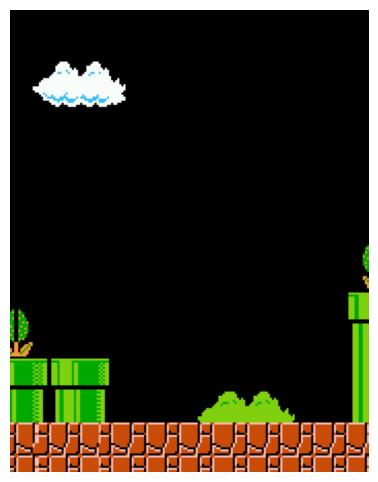

Creating background for scene w6l2s4
Processing sub-01/ses-004/gamelogs/sub-01_ses-004_task-mario_level-w6l2_rep-000.bk2


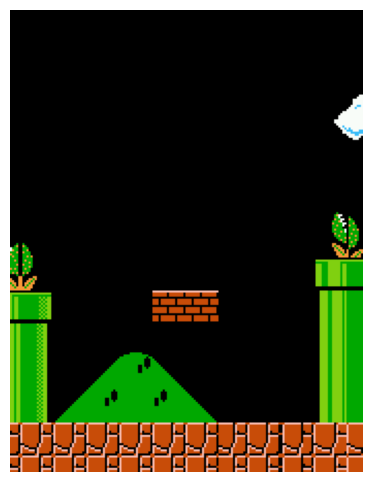

Creating background for scene w6l2s5
Processing sub-01/ses-004/gamelogs/sub-01_ses-004_task-mario_level-w6l2_rep-000.bk2


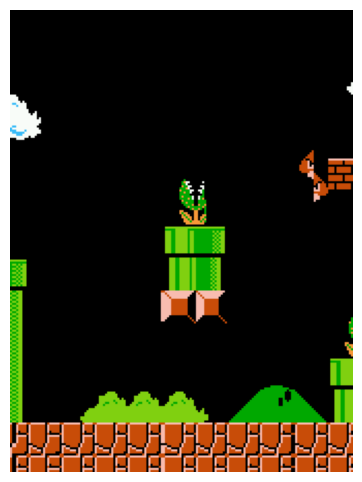

Creating background for scene w6l2s6
Processing sub-01/ses-004/gamelogs/sub-01_ses-004_task-mario_level-w6l2_rep-000.bk2
Processing sub-01/ses-004/gamelogs/sub-01_ses-004_task-mario_level-w6l2_rep-001.bk2
Processing sub-01/ses-004/gamelogs/sub-01_ses-004_task-mario_level-w6l2_rep-002.bk2
Processing sub-01/ses-004/gamelogs/sub-01_ses-004_task-mario_level-w6l2_rep-003.bk2
Processing sub-01/ses-004/gamelogs/sub-01_ses-004_task-mario_level-w6l2_rep-004.bk2
Processing sub-01/ses-004/gamelogs/sub-01_ses-004_task-mario_level-w6l2_rep-005.bk2
Processing sub-01/ses-004/gamelogs/sub-01_ses-004_task-mario_level-w6l2_rep-006.bk2
Processing sub-01/ses-004/gamelogs/sub-01_ses-004_task-mario_level-w6l2_rep-007.bk2
Processing sub-01/ses-006/gamelogs/sub-01_ses-006_task-mario_level-w6l2_rep-000.bk2
Processing sub-01/ses-007/gamelogs/sub-01_ses-007_task-mario_level-w6l2_rep-001.bk2
Processing sub-01/ses-007/gamelogs/sub-01_ses-007_task-mario_level-w6l2_rep-000.bk2
Processing sub-01/ses-008/gamelogs/sub-

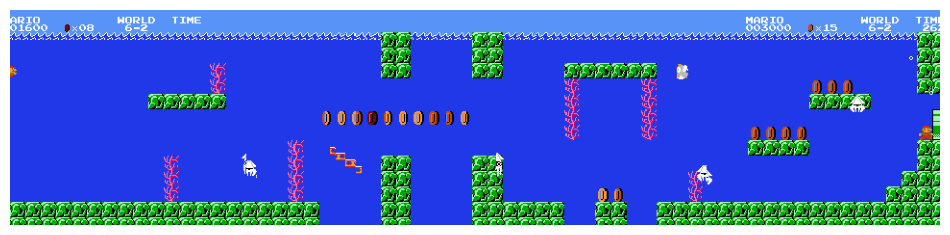

Creating background for scene w6l2s7
Processing sub-01/ses-004/gamelogs/sub-01_ses-004_task-mario_level-w6l2_rep-000.bk2


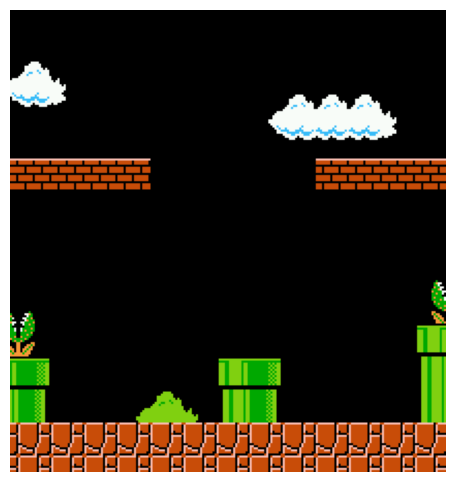

Creating background for scene w6l2s8
Processing sub-01/ses-004/gamelogs/sub-01_ses-004_task-mario_level-w6l2_rep-000.bk2
Processing sub-01/ses-004/gamelogs/sub-01_ses-004_task-mario_level-w6l2_rep-001.bk2
Processing sub-01/ses-004/gamelogs/sub-01_ses-004_task-mario_level-w6l2_rep-002.bk2
Processing sub-01/ses-004/gamelogs/sub-01_ses-004_task-mario_level-w6l2_rep-003.bk2
Processing sub-01/ses-004/gamelogs/sub-01_ses-004_task-mario_level-w6l2_rep-004.bk2
Processing sub-01/ses-004/gamelogs/sub-01_ses-004_task-mario_level-w6l2_rep-005.bk2
Processing sub-01/ses-004/gamelogs/sub-01_ses-004_task-mario_level-w6l2_rep-006.bk2
Processing sub-01/ses-004/gamelogs/sub-01_ses-004_task-mario_level-w6l2_rep-007.bk2
Processing sub-01/ses-006/gamelogs/sub-01_ses-006_task-mario_level-w6l2_rep-000.bk2
Processing sub-01/ses-007/gamelogs/sub-01_ses-007_task-mario_level-w6l2_rep-001.bk2
Processing sub-01/ses-007/gamelogs/sub-01_ses-007_task-mario_level-w6l2_rep-000.bk2
Processing sub-01/ses-008/gamelogs/sub-

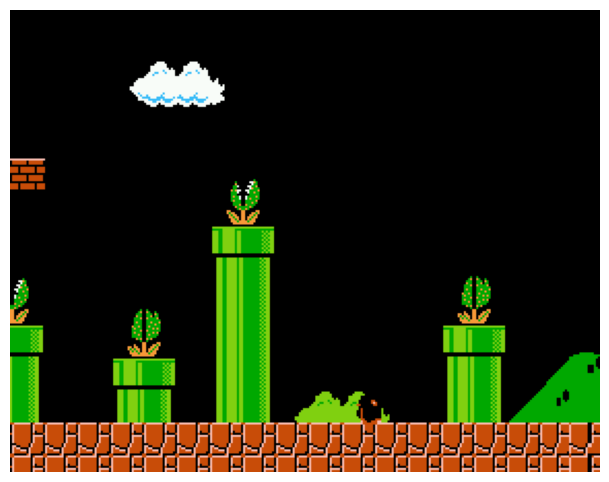

Creating background for scene w6l2s10
Processing sub-01/ses-004/gamelogs/sub-01_ses-004_task-mario_level-w6l2_rep-000.bk2


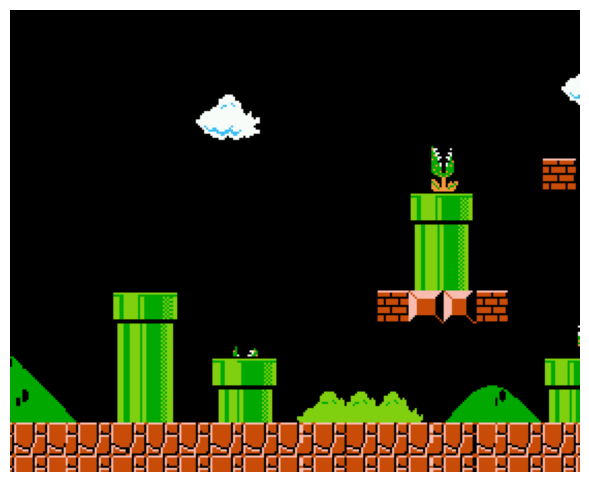

Creating background for scene w6l2s11
Processing sub-01/ses-004/gamelogs/sub-01_ses-004_task-mario_level-w6l2_rep-000.bk2


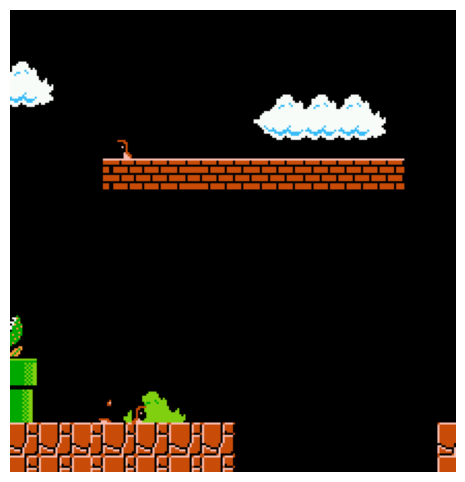

Creating background for scene w6l2s12
Processing sub-01/ses-004/gamelogs/sub-01_ses-004_task-mario_level-w6l2_rep-000.bk2


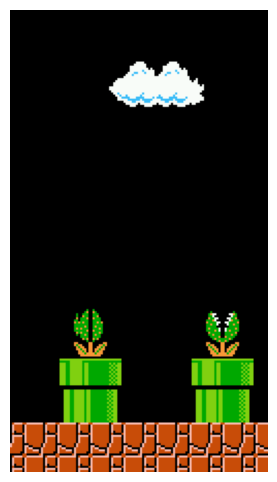

Creating background for scene w6l2s13
Processing sub-01/ses-004/gamelogs/sub-01_ses-004_task-mario_level-w6l2_rep-000.bk2


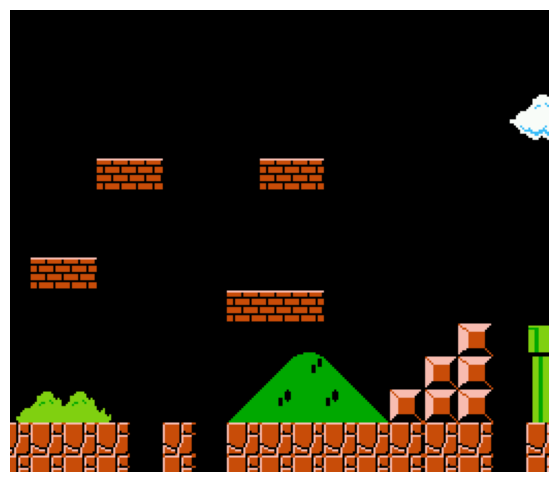

Creating background for scene w6l2s14
Processing sub-01/ses-004/gamelogs/sub-01_ses-004_task-mario_level-w6l2_rep-000.bk2


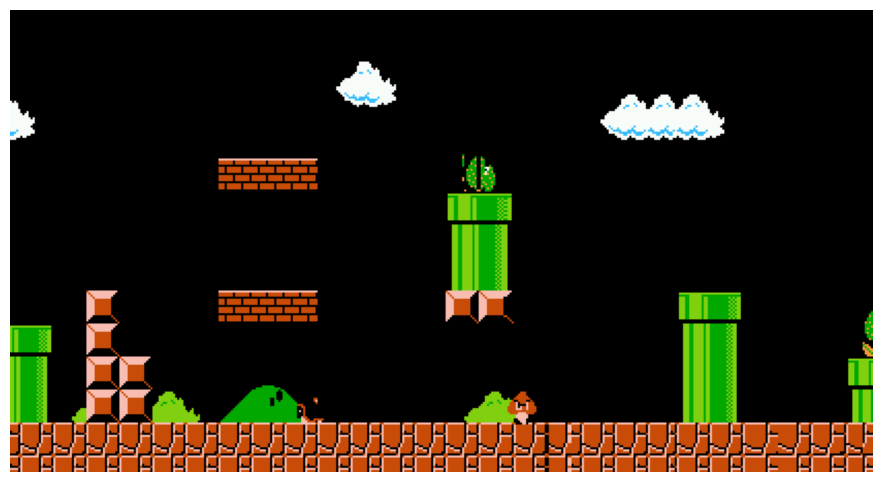

Creating background for scene w6l2s15
Processing sub-01/ses-004/gamelogs/sub-01_ses-004_task-mario_level-w6l2_rep-000.bk2
Processing sub-01/ses-004/gamelogs/sub-01_ses-004_task-mario_level-w6l2_rep-001.bk2
Processing sub-01/ses-004/gamelogs/sub-01_ses-004_task-mario_level-w6l2_rep-002.bk2
Processing sub-01/ses-004/gamelogs/sub-01_ses-004_task-mario_level-w6l2_rep-003.bk2
Processing sub-01/ses-004/gamelogs/sub-01_ses-004_task-mario_level-w6l2_rep-004.bk2
Processing sub-01/ses-004/gamelogs/sub-01_ses-004_task-mario_level-w6l2_rep-005.bk2
Processing sub-01/ses-004/gamelogs/sub-01_ses-004_task-mario_level-w6l2_rep-006.bk2
Processing sub-01/ses-004/gamelogs/sub-01_ses-004_task-mario_level-w6l2_rep-007.bk2
Processing sub-01/ses-006/gamelogs/sub-01_ses-006_task-mario_level-w6l2_rep-000.bk2
Processing sub-01/ses-007/gamelogs/sub-01_ses-007_task-mario_level-w6l2_rep-001.bk2
Processing sub-01/ses-007/gamelogs/sub-01_ses-007_task-mario_level-w6l2_rep-000.bk2
Processing sub-01/ses-008/gamelogs/sub

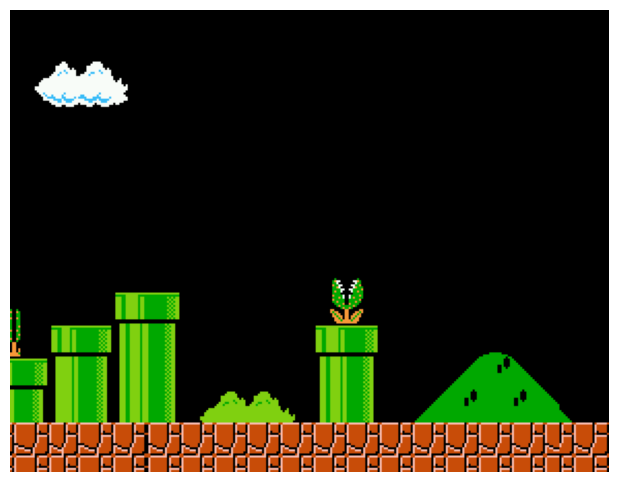

Creating background for scene w6l2s17
Processing sub-01/ses-004/gamelogs/sub-01_ses-004_task-mario_level-w6l2_rep-000.bk2


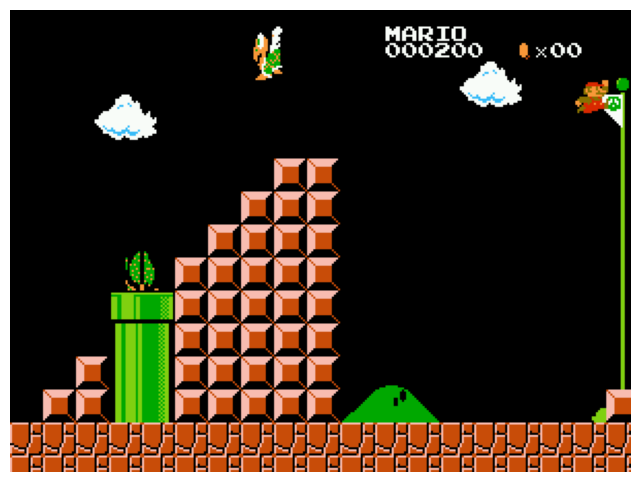

Creating background for scene w6l3s0
Processing sub-01/ses-005/gamelogs/sub-01_ses-005_task-mario_level-w6l3_rep-000.bk2


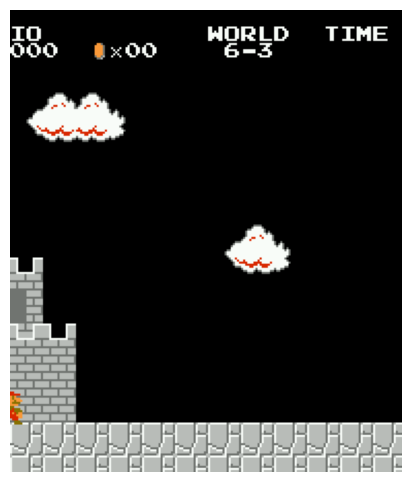

Creating background for scene w6l3s1
Processing sub-01/ses-005/gamelogs/sub-01_ses-005_task-mario_level-w6l3_rep-000.bk2


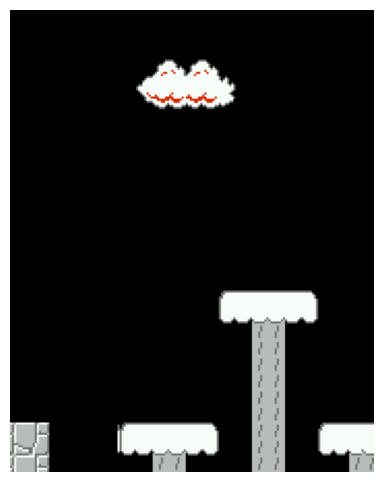

Creating background for scene w6l3s2
Processing sub-01/ses-005/gamelogs/sub-01_ses-005_task-mario_level-w6l3_rep-000.bk2


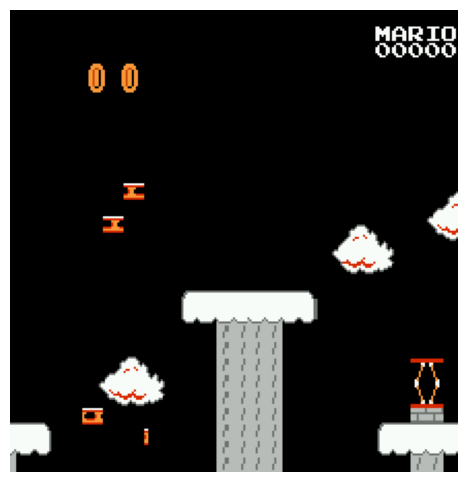

Creating background for scene w6l3s3
Processing sub-01/ses-005/gamelogs/sub-01_ses-005_task-mario_level-w6l3_rep-000.bk2


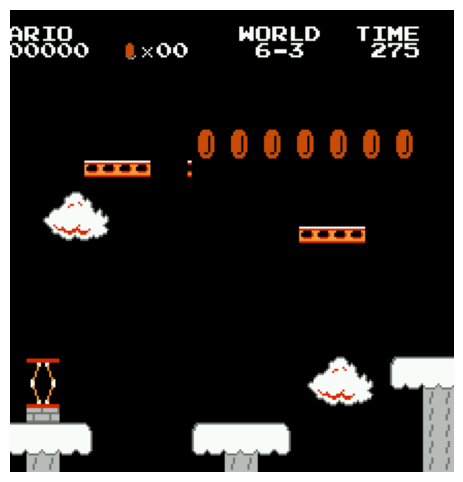

Creating background for scene w6l3s4
Processing sub-01/ses-005/gamelogs/sub-01_ses-005_task-mario_level-w6l3_rep-000.bk2
Creating background for scene w6l3s5
Processing sub-01/ses-005/gamelogs/sub-01_ses-005_task-mario_level-w6l3_rep-000.bk2
Creating background for scene w6l3s6
Processing sub-01/ses-005/gamelogs/sub-01_ses-005_task-mario_level-w6l3_rep-000.bk2
Creating background for scene w6l3s7
Processing sub-01/ses-005/gamelogs/sub-01_ses-005_task-mario_level-w6l3_rep-000.bk2
Creating background for scene w6l3s8
Processing sub-01/ses-005/gamelogs/sub-01_ses-005_task-mario_level-w6l3_rep-000.bk2
Creating background for scene w6l3s9
Processing sub-01/ses-005/gamelogs/sub-01_ses-005_task-mario_level-w6l3_rep-000.bk2
Creating background for scene w7l1s0
Processing sub-01/ses-005/gamelogs/sub-01_ses-005_task-mario_level-w7l1_rep-001.bk2


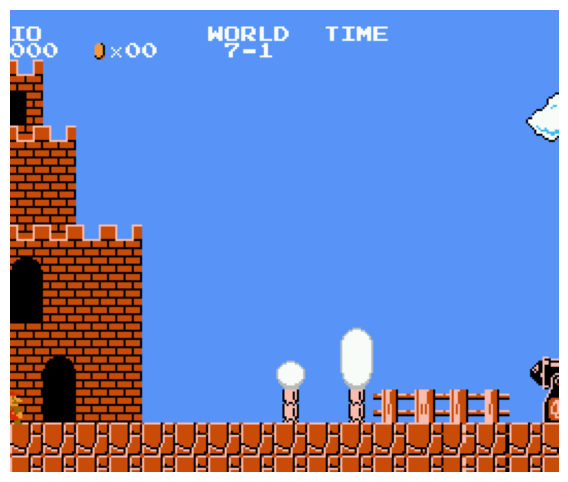

Creating background for scene w7l1s1
Processing sub-01/ses-005/gamelogs/sub-01_ses-005_task-mario_level-w7l1_rep-001.bk2


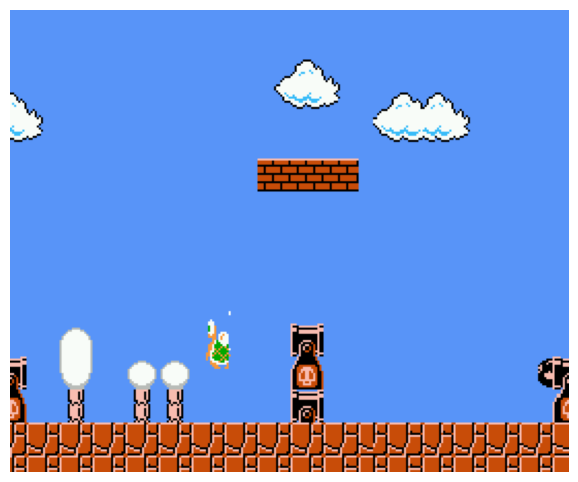

Creating background for scene w7l1s2
Processing sub-01/ses-005/gamelogs/sub-01_ses-005_task-mario_level-w7l1_rep-001.bk2


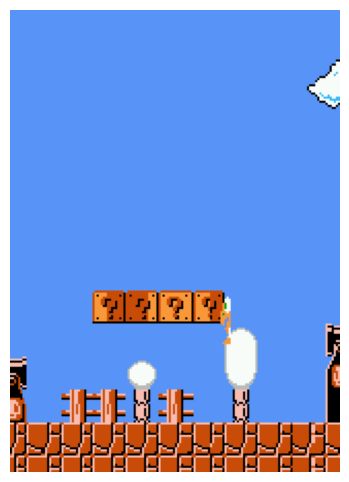

Creating background for scene w7l1s3
Processing sub-01/ses-005/gamelogs/sub-01_ses-005_task-mario_level-w7l1_rep-001.bk2


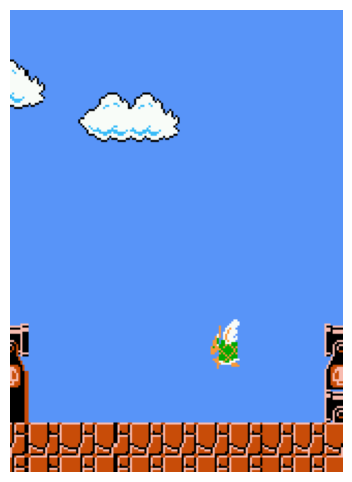

Creating background for scene w7l1s4
Processing sub-01/ses-005/gamelogs/sub-01_ses-005_task-mario_level-w7l1_rep-001.bk2


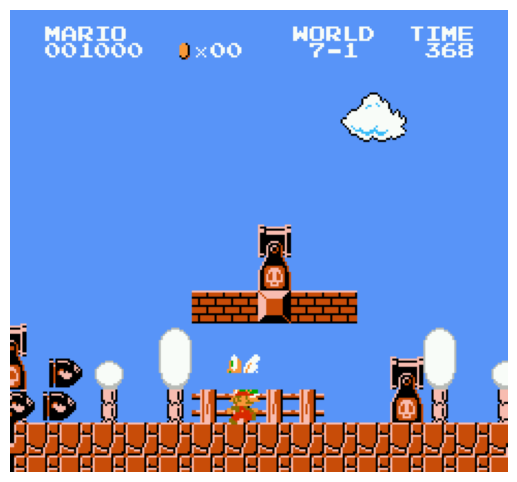

Creating background for scene w7l1s5
Processing sub-01/ses-005/gamelogs/sub-01_ses-005_task-mario_level-w7l1_rep-001.bk2
Creating background for scene w7l1s6
Processing sub-01/ses-005/gamelogs/sub-01_ses-005_task-mario_level-w7l1_rep-001.bk2
Creating background for scene w7l1s7
Processing sub-01/ses-005/gamelogs/sub-01_ses-005_task-mario_level-w7l1_rep-001.bk2
Processing sub-01/ses-005/gamelogs/sub-01_ses-005_task-mario_level-w7l1_rep-002.bk2
Processing sub-01/ses-005/gamelogs/sub-01_ses-005_task-mario_level-w7l1_rep-003.bk2
Processing sub-01/ses-005/gamelogs/sub-01_ses-005_task-mario_level-w7l1_rep-004.bk2
Processing sub-01/ses-005/gamelogs/sub-01_ses-005_task-mario_level-w7l1_rep-005.bk2
Processing sub-01/ses-005/gamelogs/sub-01_ses-005_task-mario_level-w7l1_rep-006.bk2
Processing sub-01/ses-005/gamelogs/sub-01_ses-005_task-mario_level-w7l1_rep-007.bk2
Processing sub-01/ses-005/gamelogs/sub-01_ses-005_task-mario_level-w7l1_rep-008.bk2
Processing sub-01/ses-005/gamelogs/sub-01_ses-005

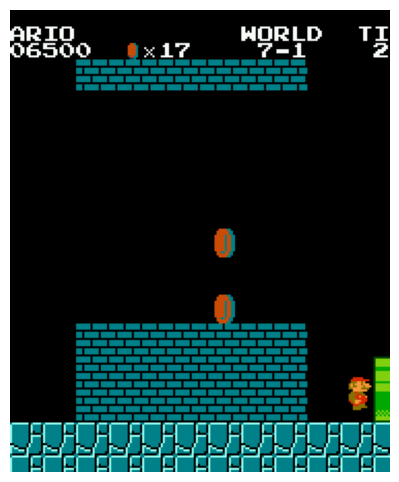

Creating background for scene w7l1s8
Processing sub-01/ses-005/gamelogs/sub-01_ses-005_task-mario_level-w7l1_rep-001.bk2
Creating background for scene w7l1s9
Processing sub-01/ses-005/gamelogs/sub-01_ses-005_task-mario_level-w7l1_rep-001.bk2
Creating background for scene w7l1s10
Processing sub-01/ses-005/gamelogs/sub-01_ses-005_task-mario_level-w7l1_rep-001.bk2
Creating background for scene w7l1s11
Processing sub-01/ses-005/gamelogs/sub-01_ses-005_task-mario_level-w7l1_rep-001.bk2
Creating background for scene w7l1s12
Processing sub-01/ses-005/gamelogs/sub-01_ses-005_task-mario_level-w7l1_rep-001.bk2
Creating background for scene w7l3s0
Processing sub-01/ses-005/gamelogs/sub-01_ses-005_task-mario_level-w7l3_rep-000.bk2


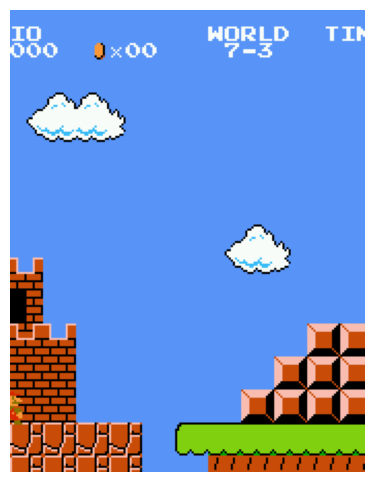

Creating background for scene w7l3s1
Processing sub-01/ses-005/gamelogs/sub-01_ses-005_task-mario_level-w7l3_rep-000.bk2


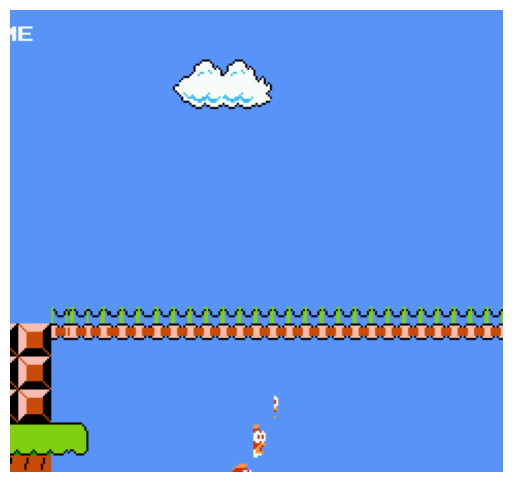

Creating background for scene w7l3s2
Processing sub-01/ses-005/gamelogs/sub-01_ses-005_task-mario_level-w7l3_rep-000.bk2


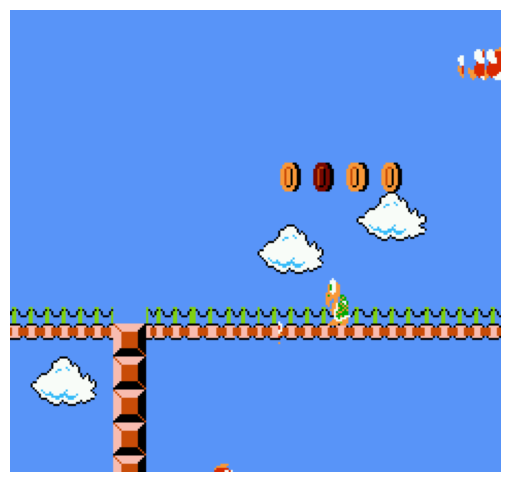

Creating background for scene w7l3s3
Processing sub-01/ses-005/gamelogs/sub-01_ses-005_task-mario_level-w7l3_rep-000.bk2


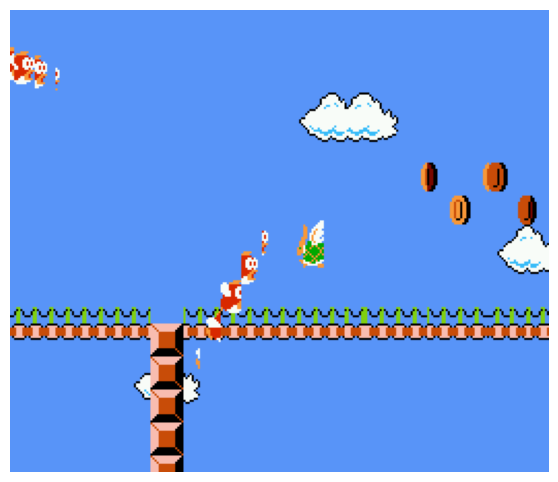

Creating background for scene w7l3s4
Processing sub-01/ses-005/gamelogs/sub-01_ses-005_task-mario_level-w7l3_rep-000.bk2


In [ ]:
### PER SCENE


for scene_todo in scenes_info_dict.keys():
    print(f'Creating background for scene {scene_todo}')
    # First, accumulate columns across all the replays for this level
    scene_collected = False

    scene_layout = scenes_info_dict[scene_todo]['level_layout']
    start_pos = scenes_info_dict[scene_todo]['start']
    end_pos = scenes_info_dict[scene_todo]['end']
    for bk2_info in bk2_list:
        if not scene_collected:

            bk2_file = bk2_info['bk2_file']
            skip_first_step = bk2_info['bk2_idx'] == 0
            bk2_level_fullname = bk2_info['bk2_file'].split('_')[-2].split('-')[1]
            if bk2_level_fullname == scene_todo[:4]:
                try:
                    print(f'Processing {bk2_file}')
                    bk2_file = op.join(DATA_PATH, bk2_file)
                    repetition_variables, replay_info, replay_frames, replay_states = get_variables_from_replay(
                        bk2_file, skip_first_step=skip_first_step
                    )

                    # Create the mosaic using the desired parameters.
                    # Here, we use level_layout 144 and accumulate the rightmost 3 columns for frames after the first valid frame.
                    mosaic_img = create_mosaic_from_replay(repetition_variables, replay_frames, level_layout=scene_layout, columns_per_frame=10, start_pos=start_pos, end_pos=end_pos)

                    scene_collected = True
                    # Save the mosaic image as "background.png" (convert from RGB to BGR for OpenCV).
                    os.makedirs(op.join('..', 'resources', 'scene_backgrounds'), exist_ok=True)
                    cv2.imwrite(op.join('..', 'resources', 'scene_backgrounds', f"{scene_todo}.png"), 
                                cv2.cvtColor(mosaic_img, cv2.COLOR_RGB2BGR))

                    # Display the mosaic in the notebook.
                    plt.figure(figsize=(12, 6))
                    plt.imshow(mosaic_img)
                    plt.axis("off")
                    plt.show()
                    scene_collected = True
                except:
                    continue


In [ ]:

scenes_info_dict



{'w1l1s0': {'start': 40, 'end': 240, 'level_layout': 144},
 'w1l1s1': {'start': 240, 'end': 479, 'level_layout': 144},
 'w1l1s2': {'start': 479, 'end': 639, 'level_layout': 144},
 'w1l1s3': {'start': 639, 'end': 767, 'level_layout': 144},
 'w1l1s4': {'start': 767, 'end': 942, 'level_layout': 144},
 'w1l1s5': {'start': 942, 'end': 1163, 'level_layout': 144},
 'w1l1s6': {'start': 1163, 'end': 1320, 'level_layout': 144},
 'w1l1s7': {'start': 1320, 'end': 1650, 'level_layout': 144},
 'w1l1s8': {'start': 1650, 'end': 1850, 'level_layout': 144},
 'w1l1s9': {'start': 1850, 'end': 2157, 'level_layout': 144},
 'w1l1s10': {'start': 2157, 'end': 2413, 'level_layout': 144},
 'w1l1s11': {'start': 2413, 'end': 2641, 'level_layout': 144},
 'w1l1s12': {'start': 24, 'end': 194, 'level_layout': 123},
 'w1l1s13': {'start': 2641, 'end': 2896, 'level_layout': 144},
 'w1l1s14': {'start': 2896, 'end': 3158, 'level_layout': 144},
 'w1l2s0': {'start': 40, 'end': 286, 'level_layout': 55},
 'w1l2s1': {'start': 2

Creating background for scene w1l1s0
Processing sub-01/ses-001/gamelogs/sub-01_ses-001_task-mario_level-w1l1_rep-000.bk2
Processing sub-01/ses-001/gamelogs/sub-01_ses-001_task-mario_level-w1l1_rep-001.bk2
Processing sub-01/ses-001/gamelogs/sub-01_ses-001_task-mario_level-w1l1_rep-002.bk2
Processing sub-01/ses-001/gamelogs/sub-01_ses-001_task-mario_level-w1l1_rep-003.bk2
Processing sub-01/ses-001/gamelogs/sub-01_ses-001_task-mario_level-w1l1_rep-004.bk2
Processing sub-01/ses-001/gamelogs/sub-01_ses-001_task-mario_level-w1l1_rep-005.bk2
Processing sub-01/ses-001/gamelogs/sub-01_ses-001_task-mario_level-w1l1_rep-006.bk2
Processing sub-01/ses-001/gamelogs/sub-01_ses-001_task-mario_level-w1l1_rep-007.bk2
Processing sub-01/ses-001/gamelogs/sub-01_ses-001_task-mario_level-w1l1_rep-008.bk2
Processing sub-01/ses-001/gamelogs/sub-01_ses-001_task-mario_level-w1l1_rep-009.bk2
Processing sub-01/ses-001/gamelogs/sub-01_ses-001_task-mario_level-w1l1_rep-010.bk2
Processing sub-01/ses-007/gamelogs/sub-

IndexError: list index out of range

In [ ]:
    
    for i in range(0, end-start+1):
        column = mode_array(global_columns_dict[i])
        scene_layout[:,i,:] = column
        print(f'Column {i} done')
    
    img = Image.fromarray(np.uint8(scene_layout))
    os.makedirs(op.join('..', 'resources', 'scene_backgrounds'), exist_ok=True)
    img.save(op.join('..', 'resources', 'scene_backgrounds', f'{scene_fullname}.png'))



Column 0 done
Column 1 done
Column 2 done
Column 3 done
Column 4 done
Column 5 done
Column 6 done
Column 7 done
Column 8 done
Column 9 done
Column 10 done
Column 11 done
Column 12 done
Column 13 done
Column 14 done
Column 15 done
Column 16 done
Column 17 done
Column 18 done
Column 19 done
Column 20 done
Column 21 done
Column 22 done
Column 23 done
Column 24 done
Column 25 done
Column 26 done
Column 27 done
Column 28 done
Column 29 done
Column 30 done
Column 31 done
Column 32 done
Column 33 done
Column 34 done
Column 35 done
Column 36 done
Column 37 done
Column 38 done
Column 39 done
Column 40 done
Column 41 done
Column 42 done
Column 43 done
Column 44 done
Column 45 done
Column 46 done
Column 47 done
Column 48 done
Column 49 done
Column 50 done
Column 51 done
Column 52 done
Column 53 done
Column 54 done
Column 55 done
Column 56 done
Column 57 done
Column 58 done
Column 59 done
Column 60 done
Column 61 done
Column 62 done
Column 63 done
Column 64 done
Column 65 done
Column 66 done
Colum

KeyboardInterrupt: 

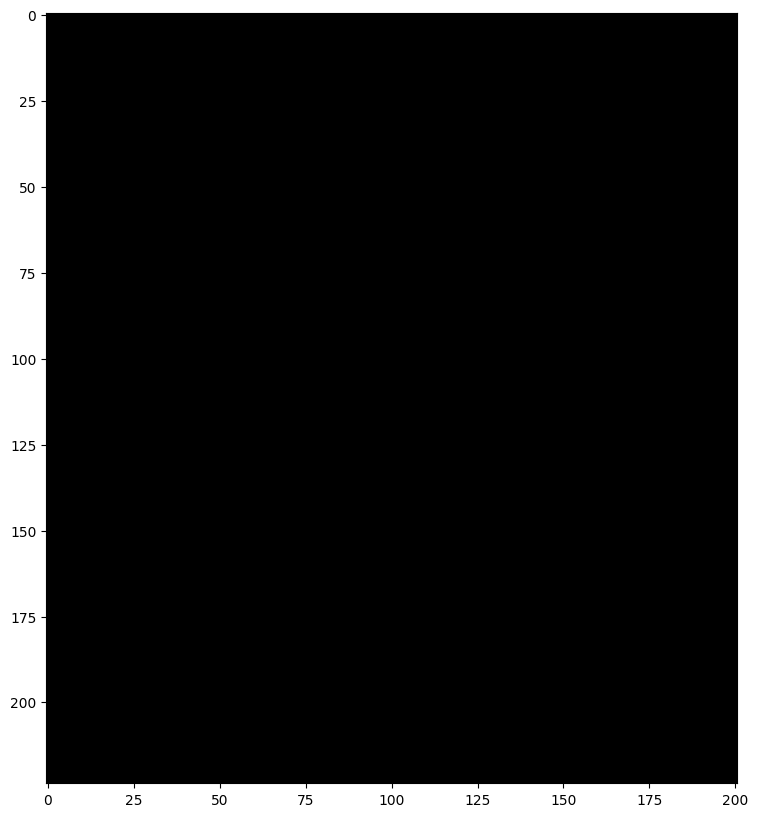

In [ ]:
MAX_LEVEL_SIZE=10000
def generate_map(bk2_path, skip_first_step=False):
    max_scroll_r = 0
    design = None
    for frame, keys, annotations, truncate, sound in replay_bk2(bk2_path, skip_first_step=skip_first_step):
        if design is None:
            design = np.zeros((frame.shape[0], MAX_LEVEL_SIZE, frame.shape[2]))
            cols = np.ones(MAX_LEVEL_SIZE, dtype=bool)
        scroll_x_pos = annotations["info"]["xscrollHi"] * 256 + annotations["info"]["xscrollLo"]
        scroll_x_pos_r = scroll_x_pos+frame.shape[1]
    
        if scroll_x_pos == 0:
            if cols[0] and annotations["info"]["player_x_posLo"] > 0:
                design[:,:frame.shape[1]] = frame
                cols[:frame.shape[1]] = False
        else:
            design[:,:scroll_x_pos_r][:,cols[:scroll_x_pos_r]] = frame[:,cols[scroll_x_pos:scroll_x_pos_r]]
            cols[scroll_x_pos:scroll_x_pos_r] = False
        max_scroll_r = max(max_scroll_r, scroll_x_pos_r)
    design = design[:,:max_scroll_r]
    return design

In [ ]:
events_paths = sorted(glob.glob("/media/hyruuk/Commons/GitHub/neuromod/mario_projects/mario.scenes/data/mario/sub-03/ses-*/func/*_events.tsv"))
events = [pd.read_csv(ep,delimiter="\t") for ep in events_paths]

In [ ]:
reps = sorted(glob.glob("/media/hyruuk/Commons/GitHub/neuromod/mario_projects/mario.scenes/data/mario/sub-03/ses-*/gamelogs/*_task-mario_level-w8l2_rep-*.bk2"))
len(reps)

40

In [ ]:
first_rep = [ any([evts.stim_file[0] in rep for evts in events]) for rep in reps]
np.where(first_rep)

(array([ 0,  8, 14, 32, 34]),)

In [ ]:
reps_data = []
for rep,skip_first_step in zip(reps, first_rep):
    reps_data.append((rep, [annotations["info"] for frame, keys, annotations, sound in replay_bk2(rep, skip_first_step=skip_first_step)]))

    

RuntimeError: Cannot create multiple emulator instances per process, make sure to call env.close() on each environment before creating a new one

In [ ]:
reps_x_pos = [np.asarray([d["player_x_posLo"] + d["player_x_posHi"]*256 for d in rep_data[1]]) for rep_data in reps_data]
rep_xmax = np.argmax([max(x_pos) for x_pos in reps_x_pos])

ValueError: attempt to get argmax of an empty sequence

In [ ]:
from matplotlib.pyplot import subplots

design = generate_map(reps[rep_xmax], skip_first_step=first_rep[rep_xmax])
f,ax = subplots(1,1,figsize=(64,2))
ax.imshow(design/255.)

NameError: name 'generate_map' is not defined

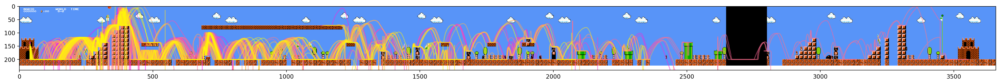

In [ ]:
f,ax = subplots(1,1,figsize=(64,2))
ax.imshow(design/255.)

for rep_data, rep_x_pos in zip(reps_data, reps_x_pos):
    pstate = np.asarray([d["player_state"] for d in rep_data[1]])
    y_pos = np.asarray([float(d["player_y_pos"])+24-(1-d["player_y_screen_pos"])*256 for d in rep_data[1]])
    y_pos = np.ma.masked_where(pstate==0, y_pos)
    ax.plot(rep_x_pos, y_pos)
ax.set_ylim(240,0)

colormap = plt.cm.spring
colors = np.asarray([colormap(i) for i in np.linspace(0, 1,len(ax.lines))])
colors[:,-1]=.5
for i,j in enumerate(ax.lines):
    j.set_color(colors[i])

24

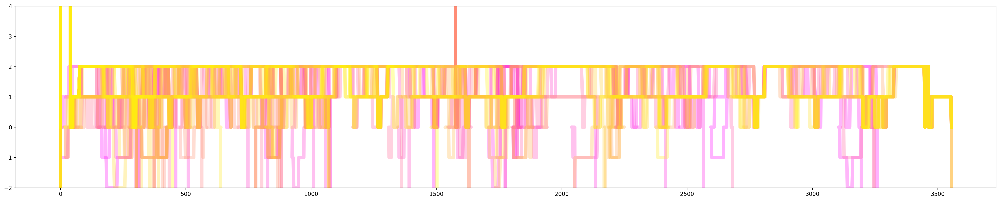

In [ ]:
f,ax = subplots(1,1,figsize=(32,6))
for rep_data in reps_data:
    x_pos = np.asarray([d["player_x_posLo"] + d["player_x_posHi"]*256. for d in rep_data[1]],dtype=np.int32)
    #x_pos_mf = x_pos,4, mode='constant')
    ax.plot(x_pos, scipy.ndimage.gaussian_filter(np.ediff1d(x_pos, to_begin=[0]),2), linewidth=6)
ax.set_ylim([-2,4])
colors = np.asarray([colormap(i) for i in np.linspace(0, 1,len(ax.lines))])
colors[:,-1]=.3
for i,j in enumerate(ax.lines):
    j.set_color(colors[i])

In [ ]:
max_x = (np.max([np.max(rep_x_pos) for rep_x_pos in reps_x_pos ]))//6+1
MAX_NUM_LIVES=3 + 5 # 3 lives + 5 bonus
survival_indexed = np.empty((len(reps_data)*MAX_NUM_LIVES, max_x), dtype=np.float16)
survival_indexed.fill(np.nan)
index = np.zeros(max_x, dtype=np.int32)
for rep_idx, x_pos in enumerate(reps_x_pos):
    uniq_x_pos = np.unique(x_pos//6) #only counts position once per rep
    np.put(survival_indexed, np.ravel_multi_index(np.asanyarray([index[uniq_x_pos],uniq_x_pos]), survival_indexed.shape), rep_idx)
    index[uniq_x_pos]+=1
survival_indexed=survival_indexed[:max(index)+1]

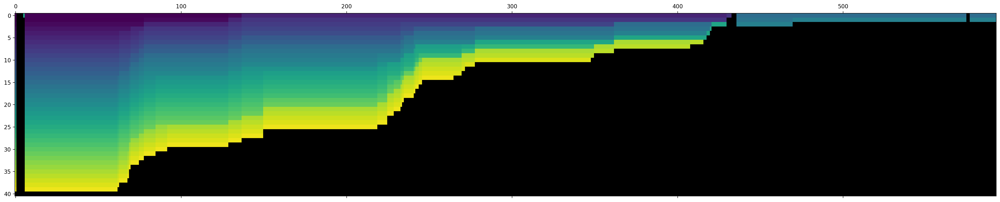

In [ ]:
f,ax = subplots(1,1,figsize=(32,6))
cmap = matplotlib.cm.viridis
cmap.set_bad('black',1.)
survival_indexed_masked = np.ma.array (survival_indexed, mask=np.isnan(survival_indexed))
ax.matshow(survival_indexed_masked, aspect='auto', vmin=1, vmax=len(reps_data), cmap=cmap)

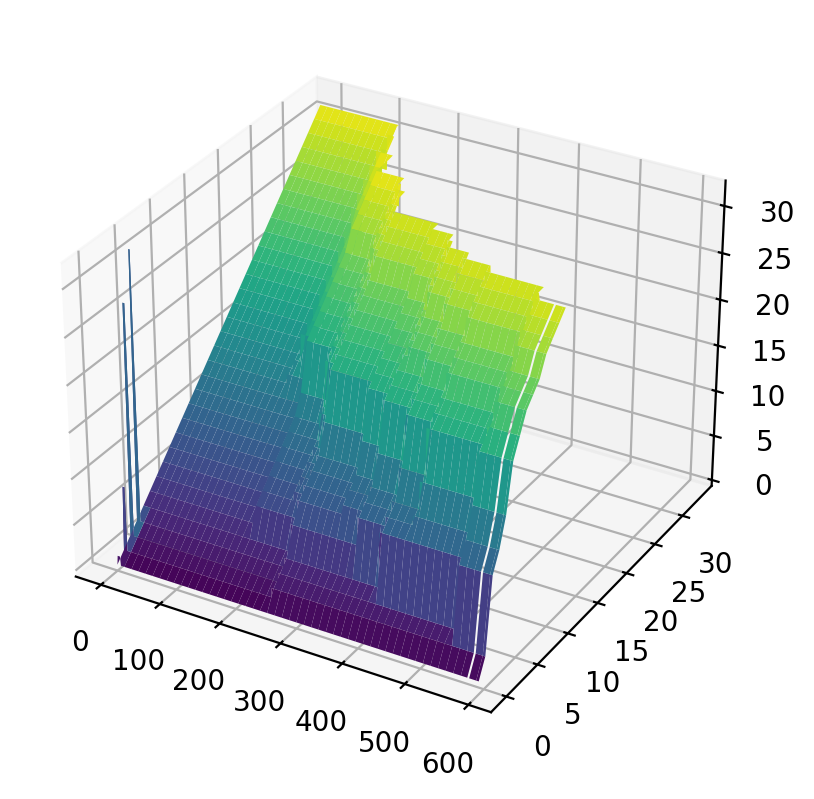

In [ ]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
xv, yv = np.meshgrid(np.arange(survival_indexed.shape[1]),np.arange(survival_indexed.shape[0]))
ax.plot_surface(xv,yv,survival_indexed_masked, cmap='viridis',vmin=0,vmax=len(reps_data))

In [ ]:
np.unique([d["player_y_screen_pos"]+24 for d in rep_data[1]])

array([24, 25, 26, 27, 28])

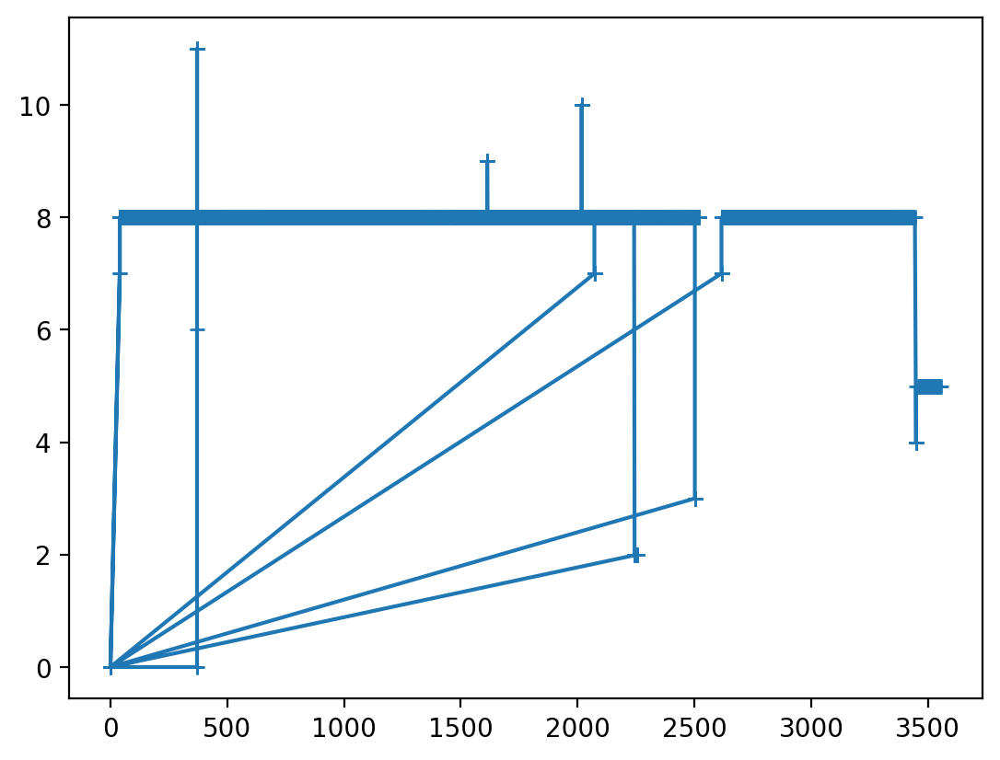

In [ ]:
plot(reps_x_pos[rep_xmax],[d["player_state"] for d in reps_data[rep_xmax][1]],'+-')

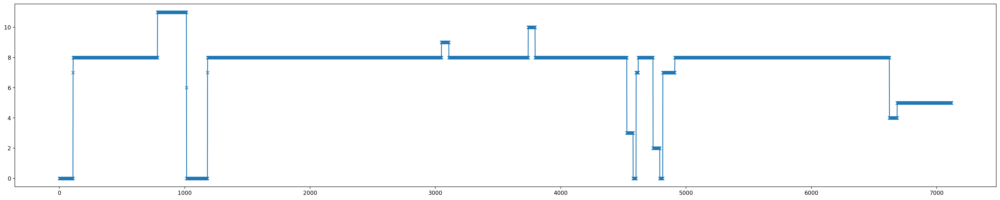

In [ ]:
f,ax = subplots(1,1,figsize=(32,6))
ax.plot([d["player_state"] for d in reps_data[rep_xmax][1]],'-x')

In [ ]:
rep_data = [annotations["info"] for frame, keys, annotations, sound in replay_bk2(rep)]

In [ ]:
np.bincount([d['player_y_screen_pos'] for d in rep_data[1] ] )

array([ 462, 3121,  180,  183,  409])